# Drought Identification and Trend Analysis using Google Earth Engine (GEE) - Admin 2 Level

Author - Nitin Magima (edited by J. Sim for Rwanda)

Date - Oct 2024

Version - 1.0

[**Google Earth Engine**](https://earthengine.google.com/) is a public data archive of petabytes of historical satellite imagery and geospatial datasets. The advantage lies in its remarkable computation speed as processing is outsourced to Google servers. The platform provides a variety of constantly updated datasets; no download of raw imagery is required. While it is free of charge, one still needs to activate access to Google Earth Engine with a valid Google account.

The Jupyter Notebook uses the following [paper](https://www.mdpi.com/2071-1050/13/3/1042) to recreate the analysis for drought identification and trend analysis in Kenya using Google Earth Engine (GEE) for Python, follow these steps:

## Analysis Steps

### Step 1: Data Collection

Obtain long-term satellite-derived precipitation data using the CHIRPS dataset available in GEE. This data will be used to analyze drought conditions in Kenya.

### Step 2: Study Area Definition

Define the study area using Kenya's geographical boundaries.

### Step 3: Data Preprocessing

- **Extract Monthly Precipitation**: Extract monthly CHIRPS precipitation data for the study area to calculate Standardized Precipitation Index (SPI) at different time scales (e.g., SPI1, SPI3, SPI6, SPI12).
- **Clip to Region**: Clip the precipitation data to Kenya's boundaries to ensure that the analysis focuses solely on Kenya. This step has already been implemented using GEE.

### Step 4: Calculate Standardized Precipitation Index (SPI)

- **SPI Calculation**: Calculate SPI at different time scales (1-, 3-, 6-, and 12-month) for drought evaluation. Convert the CHIRPS precipitation data into SPI values by fitting a gamma distribution to each pixel's monthly time series.

### Step 5: Drought Characterization

- **Identify Drought Events**: Use run theory to identify drought events based on SPI values.
- **Drought Duration**: Identify the number of months with SPI values below thresholds like -1.0 for moderate drought.
- **Drought Severity**: Calculate the severity by summing all SPI values during the drought.
- **Drought Intensity**: Calculate drought intensity as severity divided by duration.

### Step 6: Trend Analysis

- **Mann-Kendall Test**: Implement the Mann-Kendall trend test to determine trends in SPI values at annual, seasonal, and monthly time scales.
- **Sen’s Slope Estimator**: Apply Sen’s slope estimator to understand the magnitude of the detected trends.

### Step 7: Clustering Analysis of Drought Metrics

This step aims to perform a comprehensive clustering analysis on drought metrics across administrative units in Kenya, including data preprocessing, dimensionality reduction, and clustering.

#### Workflow Steps

- **Data Preprocessing**:
  - Encode categorical features, and normalize numerical metrics using `MinMaxScaler`.
- **Feature Engineering**:
  - Construct a feature vector (`feature_vector`) for clustering, including encoded categorical features and  normalized numerical metrics.
- **Dimensionality Reduction Using PCA**:
  - Determine the optimal number of components for dimensionality reduction by analyzing cumulative explained variance and applying PCA accordingly.
- **Clustering Analysis**:
  - **K-Means Clustering**:
    - Determine the optimal number of clusters using the **Elbow Method** and apply K-Means.
    - Visualize the clusters geospatially.
  - **Hierarchical Clustering**:
    - Create a linkage matrix using **Ward's method** and determine the optimal clusters using a dendrogram.
    - Assign cluster labels and visualize geospatially.
  - **DBSCAN Clustering**:
    - Perform a grid search to determine the best parameters (`eps`, `min_samples`) and use the **Silhouette Score** for optimization.
    - Assign cluster labels and visualize geospatially.


### Step 8: EM-DAT Analysis

Compare historical drought years from the [Emergency Events Database (EM-DAT)](https://www.emdat.be/) to SPI-derived results.

### DISCLAIMER

This is a set of scripts  shared for educational purposes only.  Anyone who uses this code or its
functionality or structure, assumes full liability and credits the author.

#### Map Disclaimer

The designations employed and the presentation of the material on this map do not imply the expression
of any opinion whatsoever on the part of the author concerning the legal status of any country, territory, city or area or of its authorities, or concerning the delimitation of its
frontiers or boundaries.


# Google Earth Engine Setup

### Install Geemap

In [329]:
!pip install -U "geemap[workshop]"

### Import libraries

In [330]:
!pip install pymannkendall

In [331]:
import ee
import geemap
import numpy as np
import pandas as pd
from scipy.stats import gamma, norm, kstest, probplot
import time
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from ipywidgets import interact, Dropdown, fixed, widgets, Checkbox, RadioButtons
import pymannkendall as mk
import json
import geopandas as gpd
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, LabelEncoder
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score

### Authenticate and initialize Earth Engine

You will need to create a [Google Cloud Project](https://console.cloud.google.com/projectcreate) and enable the [Earth Engine API](https://console.cloud.google.com/apis/api/earthengine.googleapis.com) for the project. You can find detailed instructions [here](https://book.geemap.org/chapters/01_introduction.html#earth-engine-authentication).

In [332]:
ee.Authenticate()

True

Update the project below.

In [333]:
ee.Initialize(project="bayesian-clustering-for-zoning")

## Initialize Map

In [334]:
# Creating a map
m = geemap.Map(center=[-1.94, 29.87], zoom=8)
m

Map(center=[-1.94, 29.87], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGU…

# Define Analysis Boundaries

We use the following [crop calendar](https://fews.net/sites/default/files/styles/large_width_880/public/2023-03/seasonal-calendar-kenya.png?itok=0Wob_hCK) to select the regions and time periods to focus on.

We define boundaries for the Western and Rift Valley, and Eastern and Northern Kenya. We use the [FAO GAUL: Global Administrative Unit Layers](https://data.apps.fao.org/catalog/dataset/global-administrative-unit-layers-gaul) for the analysis.

The Global Administrative Unit Layers (GAUL) compiles and disseminates the best available information on administrative units for all the countries in the world, providing a contribution to the standardization of the spatial dataset representing administrative units. The GAUL always maintains global layers with a unified coding system at country, first (e.g. departments), and second administrative levels (e.g. districts). Where data is available, it provides layers on a country by country basis down to third, fourth, and lowers levels.

# Define Time Period

The periods of interest are the planting, harvest, and rain seasons for different regions of Kenya. We will use these timelines to define the start and end dates for creating the relevant dekadal (10-day period) analysis from the CHIRPS pentad data.

1. Western and Rift Valley  

- Long Rains: March to June
- Planting: April to June
- Long Rains Harvest: July to August & October to November

2. Eastern and Northern Kenya:

- Short Rains Harvest: February to March
- Planting: March to May
- Long Rains: March to June
- Lean Season: September to November
- Short Rains: October to December

Based on this calendar, we'll use the start and end months for rainfall using the CHIRPS Pentad dataset ('UCSB-CHG/CHIRPS/PENTAD').

In [335]:
# This loaded dataframe is created using GEE
combined_df = pd.read_csv("/content/rwanda_admin2_precip.csv")

# Calculate Standardized Precipitation Index (SPI)

## SPI Definitions

* SPI1 (1-month scale)

Used to capture short-term monthly precipitation fluctuations and early warning of meteorological drought.

* SPI3 (3-month scale)

Useful for seasonal drought analysis, which helps in understanding the drought conditions over a quarterly period, closely related to agricultural impacts.

* SPI6 (6-month scale)

Provides insights into medium-term drought conditions, capturing both the end of one season and the start of another, which can influence soil moisture and crop yield over a longer period.

* SPI12 (12-month scale)

Used to assess long-term drought conditions, representing annual fluctuations and providing insights into the overall hydrological drought scenario, which can affect groundwater recharge and surface water availability.


## Selecting SPI Time Scales
Based on the above definitions we select the following time Scales for Long and Short Rains:

- Long Rains: March to June (4-month period) - We will use 1-month and 3-month SPI for long rains to understand short-term and medium-term droughts.
- Short Rains: October to December (3-month period) - We will use 1-month and 3-month SPI to capture variability within the shorter rainy season.

## Determining Gamma Distribution

What is a Gamma Distribution?

A gamma distribution is a type of statistical model used to describe data that are always positive and usually skewed, meaning most values are small but there can be a few large values. It's often used for things like rainfall, where:

- Many days have little or no rain, and
- A few days have a lot of rain.

This type of pattern creates a graph that has a high peak near the small values and a long tail extending to larger values. That’s what the gamma distribution looks like.

Why Do We Use Gamma Distribution for Rainfall?

- Always Positive: Rainfall cannot be negative; it either doesn’t rain or it rains some amount. The gamma distribution is great for representing only positive values.
- Right-Skewed Data: Most of the time, we have small amounts of rainfall, and occasionally, we get heavy rainfall. The gamma distribution is good for representing this kind of uneven distribution.
- Flexibility: The shape of the gamma distribution can change to fit different types of rainfall patterns, making it a very flexible tool for modeling different weather conditions.

The Gamma Distribution is the Standardized Precipitation Index (SPI) as a way to figure out if a place is having normal, dry, or wet weather compared to its history.

1. Modeling Historical Rainfall:

We use the gamma distribution to fit the historical rainfall data. This helps us understand what the usual rainfall is like for each month.

2. Comparing to Current Rainfall:

Once we have the gamma model of typical rainfall, we compare current rainfall to see how much it differs from the usual.
This comparison tells us if it is drier or wetter than normal, and by how much.

3. Getting SPI:

The final step is to convert this difference into a number called SPI, which tells us:
- If the SPI is negative, it means it’s drier than usual (possible drought).
- If the SPI is positive, it means it’s wetter than usual (possible flooding).

### Histograms

In [336]:
# Define an interactive function for plotting histograms
def interactive_histogram(region, admin2_name, season):
    """
    Plots a histogram of the precipitation data for a specific region, Admin 2 area, and season.

    Parameters:
    region (str): The selected region.
    admin2_name (str): The selected Admin 2 area within the region.
    season (str): The selected season (e.g., Long Rains or Short Rains).
    """
    # Filter the DataFrame based on the selected region, admin2_name, and season
    filtered_df = combined_df[
        (combined_df['region'] == region) &
        (combined_df['admin2_name'] == admin2_name) &
        (combined_df['season'] == season)
    ]

    if filtered_df.empty:
        print("No data available for the selected region, admin2_name, and season.")
        return

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(filtered_df['precipitation'], bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Precipitation Histogram for {admin2_name} ({region}, {season})')
    plt.xlabel('Precipitation')
    plt.ylabel('Frequency')
    plt.grid(axis='y', alpha=0.75)
    plt.show()

# Define the interactive dropdown widgets
region_dropdown = Dropdown(
    options=combined_df['region'].unique(),
    description='Select Region:',
    style={'description_width': 'initial'}
)

admin2_name_dropdown = Dropdown(
    options=[],  # Initially empty, will be updated based on region selection
    description='Select Admin2:',
    style={'description_width': 'initial'}
)

season_dropdown = Dropdown(
    options=combined_df['season'].unique(),
    description='Select Season:',
    style={'description_width': 'initial'}
)

# Function to update admin2_name options based on the selected region
def update_admin2_dropdown(change):
    selected_region = change['new']
    if selected_region:
        admin2_options = combined_df[combined_df['region'] == selected_region]['admin2_name'].unique()
        admin2_name_dropdown.options = admin2_options
    else:
        admin2_name_dropdown.options = []

# Attach an observer to the region dropdown to update the admin2_name dropdown
region_dropdown.observe(update_admin2_dropdown, names='value')

# Set an initial value to trigger the observer and populate admin2_name dropdown
update_admin2_dropdown({'new': region_dropdown.value})

# Use `interact` to create an interactive histogram based on the selected region, admin2_name, and season
interact(interactive_histogram, region=region_dropdown, admin2_name=admin2_name_dropdown, season=season_dropdown)

interactive(children=(Dropdown(description='Select Region:', options=('east', 'city', 'west', 'north', 'south'…

<function __main__.interactive_histogram(region, admin2_name, season)>

### Kolmogorov-Smirnov Test

Understanding the Kolmogorov-Smirnov Test:
The Kolmogorov-Smirnov test compares the empirical distribution of your data to a theoretical distribution (in this case, the gamma distribution).
The null hypothesis (H₀) of the KS test is that the data follows the specified distribution (in this case, gamma).
The alternative hypothesis (H₁) is that the data does not follow the specified distribution.

In the context of the Kolmogorov-Smirnov (KS) test, a p-value greater than 0.05 is typically desired when checking the fit of a distribution.

Interpreting the p-value:

- p-value > 0.05:
If the p-value is greater than 0.05, it means there is insufficient evidence to reject the null hypothesis.
In other words, the data fits the gamma distribution well. Therefore, we accept the null hypothesis and conclude that the gamma distribution is likely a good fit.

- p-value < 0.05:
If the p-value is less than 0.05, it means that there is significant evidence to reject the null hypothesis.
This suggests that the gamma distribution may not be a good fit for the data.

In [337]:
# Function to perform Kolmogorov-Smirnov test for each admin2_name and determine if it passes or fails
def perform_ks_test_for_all(region, season, pass_or_fail="pass"):
    """
    Perform Kolmogorov-Smirnov test for each admin2_name within the selected region and season.

    Parameters:
    region (str): Name of the region.
    season (str): Name of the season (e.g., 'Long Rains', 'Short Rains').
    pass_or_fail (str): Specify whether to print areas that pass or fail the test ('pass' or 'fail').

    Returns:
    None: Prints the names of admin2 areas that pass or fail the KS test.
    """
    # Filter the dataset based on the provided region and season
    filtered_df = combined_df[(combined_df['region'] == region) & (combined_df['season'] == season)]

    # Initialize lists to hold the names of areas that pass or fail the test
    passing_admin2_names = []
    failing_admin2_names = []

    # Loop through each admin2_name in the filtered DataFrame
    for admin2_name in filtered_df['admin2_name'].unique():
        # Get the precipitation data for the current admin2_name
        data = filtered_df[filtered_df['admin2_name'] == admin2_name]['precipitation'].dropna()

        # Check if there is enough data to perform the test
        if len(data) < 2:
            continue

        # Fit a gamma distribution to the data
        shape, loc, scale = gamma.fit(data, floc=0)  # floc=0 to ensure non-negative values

        # Perform Kolmogorov-Smirnov test
        _, p_value = kstest(data, gamma(shape, loc, scale).cdf)

        # Determine if the admin2_name passes or fails based on the p-value
        if p_value > 0.05:
            passing_admin2_names.append(admin2_name)
        else:
            failing_admin2_names.append(admin2_name)

    # Print the results based on the pass_or_fail argument
    if pass_or_fail == "pass":
        if passing_admin2_names:
            print(f"Admin2 areas in {region} during {season} that pass the KS test:")
            for name in passing_admin2_names:
                print(name)
        else:
            print(f"No admin2 areas in {region} during {season} passed the KS test.")
    elif pass_or_fail == "fail":
        if failing_admin2_names:
            print(f"Admin2 areas in {region} during {season} that fail the KS test:")
            for name in failing_admin2_names:
                print(name)
        else:
            print(f"No admin2 areas in {region} during {season} failed the KS test.")
    else:
        print("Invalid argument for 'pass_or_fail'. Please use 'pass' or 'fail'.")

# Interactive widgets
region_dropdown = Dropdown(
    options=combined_df['region'].unique(),
    description='Select Region:',
    style={'description_width': 'initial'}
)

season_dropdown = Dropdown(
    options=combined_df['season'].unique(),
    description='Select Season:',
    style={'description_width': 'initial'}
)

pass_or_fail_dropdown = Dropdown(
    options=['pass', 'fail'],
    description='Pass or Fail:',
    style={'description_width': 'initial'}
)

# Function to update the Admin2 dropdown options based on the selected region
def update_admin2_dropdown(region):
    admin2_options = combined_df[combined_df['region'] == region]['admin2_name'].unique()
    admin2_name_dropdown.options = admin2_options

# Interactive function to display the results of the KS test for all admin2 areas
interact(
    perform_ks_test_for_all,
    region=region_dropdown,
    season=season_dropdown,
    pass_or_fail=pass_or_fail_dropdown
)


interactive(children=(Dropdown(description='Select Region:', options=('east', 'city', 'west', 'north', 'south'…

<function __main__.perform_ks_test_for_all(region, season, pass_or_fail='pass')>

### QQ Plots

A QQ plot, or Quantile-Quantile plot, is a graphical tool used to compare the distribution of a dataset with a theoretical distribution, such as the normal or gamma distribution. It's a provides a visual assessment of how well the dataset fits a chosen probability distribution. The QQ plot compares the quantiles of the dataset with the quantiles of the specified theoretical distribution.

If the data follows the theoretical distribution closely, the points on the plot will align approximately along a straight line. Deviations from this line indicate that the data does not conform well to the expected distribution.

In [338]:
# Define an interactive function for generating QQ plots
def interactive_qq_plot(region, admin2_name, season):
    """
    Generates a QQ plot for the selected dataset using a gamma distribution.

    Parameters:
    region (str): The selected region.
    admin2_name (str): The selected Admin 2 area within the region.
    season (str): The selected season (e.g., Long Rains or Short Rains).
    """
    # Filter the DataFrame based on the selected region, admin2_name, and season
    filtered_df = combined_df[
        (combined_df['region'] == region) &
        (combined_df['admin2_name'] == admin2_name) &
        (combined_df['season'] == season)
    ]

    if filtered_df.empty:
        print("No data available for the selected region, admin2_name, and season.")
        return

    data = filtered_df['precipitation'].dropna()

    # Fit the gamma distribution to the data
    shape, loc, scale = gamma.fit(data, floc=0)

    # Generate QQ plot
    plt.figure(figsize=(8, 6))
    probplot(data, dist="gamma", sparams=(shape, loc, scale), plot=plt)
    plt.title(f"QQ Plot to Check Gamma Fit: {admin2_name} ({region}, {season})")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Ordered Values")
    plt.grid(True)
    plt.show()

# Define the interactive dropdown widgets
region_dropdown = Dropdown(
    options=combined_df['region'].unique(),
    description='Select Region:',
    style={'description_width': 'initial'}
)

admin2_name_dropdown = Dropdown(
    options=[],  # Initially empty, will be updated based on the region selected
    description='Select Admin2:',
    style={'description_width': 'initial'}
)

season_dropdown = Dropdown(
    options=combined_df['season'].unique(),
    description='Select Season:',
    style={'description_width': 'initial'}
)

# Function to update admin2_name options based on the selected region
def update_admin2_dropdown(change):
    selected_region = change['new']
    if selected_region:
        admin2_options = combined_df[combined_df['region'] == selected_region]['admin2_name'].unique()
        admin2_name_dropdown.options = admin2_options
    else:
        admin2_name_dropdown.options = []

# Attach an observer to the region dropdown to update the admin2_name dropdown
region_dropdown.observe(update_admin2_dropdown, names='value')

# Set an initial value to trigger the observer and populate admin2_name dropdown
update_admin2_dropdown({'new': region_dropdown.value})

# Use `interact` to create an interactive QQ plot based on the selected region, admin2_name, and season
interact(interactive_qq_plot, region=region_dropdown, admin2_name=admin2_name_dropdown, season=season_dropdown)

interactive(children=(Dropdown(description='Select Region:', options=('east', 'city', 'west', 'north', 'south'…

<function __main__.interactive_qq_plot(region, admin2_name, season)>

## Calculate SPI

In [339]:
# Combine all datasets
all_rains_df = combined_df

# Convert the 'date' column to datetime
all_rains_df['date'] = pd.to_datetime(all_rains_df['date'])

# Set the 'date' as the index for easier time series operations
all_rains_df.set_index('date', inplace=True)

# Sort the data by index
all_rains_df.sort_index(inplace=True)

In [340]:
all_rains_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5040 entries, 2000-02-01 to 2023-11-01
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0.1   5040 non-null   int64  
 1   Unnamed: 0     5040 non-null   int64  
 2   year           5040 non-null   int64  
 3   month          5040 non-null   int64  
 4   region         5040 non-null   object 
 5   admin2_name    5040 non-null   object 
 6   precipitation  5040 non-null   float64
 7   Season         5040 non-null   object 
 8   season         5040 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 393.8+ KB


In [341]:
def calculate_spi(precip_series, scale=1):
    """
    Calculate Standardized Precipitation Index (SPI) for a given precipitation series.

    Parameters:
    precip_series (pd.Series): Monthly precipitation data.
    scale (int): Time scale over which to calculate SPI (e.g., 1-month, 3-month).

    Returns:
    pd.Series: SPI values for the given precipitation series.
    """
    # Calculate rolling sum over the specified time scale
    precip_rolling = precip_series.rolling(window=scale).sum()

    # Drop NaN values resulting from the rolling operation
    precip_rolling = precip_rolling.dropna()

    # Fit a gamma distribution to the rolling sum data
    shape, loc, scale_param = gamma.fit(precip_rolling, floc=0)

    # Calculate cumulative distribution function (CDF) for gamma distribution
    gamma_cdf = gamma.cdf(precip_rolling, shape, loc=loc, scale=scale_param)

    # Convert gamma CDF to standard normal distribution to calculate SPI
    spi_values = norm.ppf(gamma_cdf)

    # Return the SPI values as a pandas Series with the same index as the rolling sum
    return pd.Series(spi_values, index=precip_rolling.index)

# Prepare the data by grouping it by region, admin2_name, and season, and calculating SPI separately
spi_results_list = []

for (region, admin2_name, season), group in all_rains_df.groupby(['region', 'admin2_name', 'season']):
    precip_series = group['precipitation']

    # Calculate 1-month SPI
    spi_1_month = calculate_spi(precip_series, scale=1)

    # Create a DataFrame from the SPI result for 1-month scale
    spi_1_month_df = pd.DataFrame({
        'year': spi_1_month.index.year,
        'month': spi_1_month.index.month,
        'region': region,
        'admin2_name': admin2_name,
        'season': season,
        'precipitation': precip_series.loc[spi_1_month.index],
        'spi': spi_1_month,
        'spi_scale': '1'  # Indicates the 1-month SPI
    })

    # Append to the results list
    spi_results_list.append(spi_1_month_df)

    # Calculate 3-month SPI
    spi_3_month = calculate_spi(precip_series, scale=3)

    # Create a DataFrame from the SPI result for 3-month scale
    spi_3_month_df = pd.DataFrame({
        'year': spi_3_month.index.year,
        'month': spi_3_month.index.month,
        'region': region,
        'admin2_name': admin2_name,
        'season': season,
        'precipitation': precip_series.loc[spi_3_month.index],
        'spi': spi_3_month,
        'spi_scale': '3'  # Indicates the 3-month SPI
    })

    # Append to the results list
    spi_results_list.append(spi_3_month_df)

# Concatenate all SPI results into a single DataFrame
spi_results_df = pd.concat(spi_results_list)

# Reset the index for the final DataFrame
spi_results_df.reset_index(drop=True, inplace=True)

# Display the first few rows of the final DataFrame
print(spi_results_df.head())

   year  month region admin2_name      season  precipitation       spi  \
0  2000      2   city      Gasabo  Long Rains      48.453012 -1.667118   
1  2000      3   city      Gasabo  Long Rains     105.644945 -0.196961   
2  2000      4   city      Gasabo  Long Rains      96.106213 -0.394784   
3  2000      5   city      Gasabo  Long Rains      72.906209 -0.939720   
4  2001      2   city      Gasabo  Long Rains      62.269462 -1.230800   

  spi_scale  
0         1  
1         1  
2         1  
3         1  
4         1  


In [342]:
# Function to plot SPI values
def plot_spi(region, admin2_name, season, spi_scale):
    """
    Plots the Standardized Precipitation Index (SPI) for the selected region, Admin 2 area, season, and scale.

    Parameters:
    region (str): Selected region (e.g., Western Rift).
    admin2_name (str): Selected Admin 2 area within the region.
    season (str): Selected season (e.g., Long Rains, Short Rains).
    spi_scale (str): Selected SPI scale (e.g., 1-month, 3-month).
    """
    # Filter the DataFrame based on the selected region, admin2_name, season, and spi_scale
    filtered_df = spi_results_df[
        (spi_results_df['region'] == region) &
        (spi_results_df['admin2_name'] == admin2_name) &
        (spi_results_df['season'] == season) &
        (spi_results_df['spi_scale'] == spi_scale)
    ]

    if filtered_df.empty:
        print(f"No data available for {admin2_name} in {region} for {season} with {spi_scale}-month SPI.")
        return

    # Create a datetime index from the year and month columns
    filtered_df['date'] = pd.to_datetime(filtered_df[['year', 'month']].assign(day=1))

    # Extract the SPI series with the datetime index
    spi_series = filtered_df.set_index('date')['spi'].dropna()

    # Plot the SPI values
    plt.figure(figsize=(10, 6))
    plt.plot(spi_series.index, spi_series, color='blue', linestyle='-', marker='o', label='SPI')
    plt.axhline(y=0, color='black', linestyle='--')  # Reference line at SPI=0
    plt.axhline(y=-1, color='red', linestyle='--', label='Mild Drought (SPI=-1)')
    plt.axhline(y=-1.5, color='orange', linestyle='--', label='Moderate Drought (SPI=-1.5)')
    plt.axhline(y=-2, color='darkred', linestyle='--', label='Severe Drought (SPI=-2)')

    plt.xlabel('Date')
    plt.ylabel('SPI Value')
    plt.title(f'Standardized Precipitation Index (SPI) for {admin2_name} in {region} ({season}, {spi_scale}-Month Scale)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Create interactive dropdown widgets
region_dropdown = Dropdown(
    options=spi_results_df['region'].unique(),
    description='Select Region:',
    style={'description_width': 'initial'}
)

admin2_name_dropdown = Dropdown(
    description='Select Admin2:',
    style={'description_width': 'initial'}
)

season_dropdown = Dropdown(
    options=spi_results_df['season'].unique(),
    description='Select Season:',
    style={'description_width': 'initial'}
)

spi_scale_dropdown = Dropdown(
    options=['1', '3'],  # Options for 1-month and 3-month SPI
    description='Select SPI Scale (months):',
    style={'description_width': 'initial'}
)

# Function to update the Admin2 dropdown options based on the selected region
def update_admin2_dropdown(change):
    selected_region = change['new']
    if selected_region:
        admin2_options = spi_results_df[spi_results_df['region'] == selected_region]['admin2_name'].unique().tolist()
        admin2_name_dropdown.options = admin2_options
    else:
        admin2_name_dropdown.options = []

# Attach the update function to the 'region' dropdown
region_dropdown.observe(update_admin2_dropdown, names='value')

# Set initial value for admin2_name_dropdown when the widget is first displayed
update_admin2_dropdown({'new': region_dropdown.value})

# Use `interact` to create an interactive plot for SPI values based on the selected parameters
interact(
    plot_spi,
    region=region_dropdown,
    admin2_name=admin2_name_dropdown,
    season=season_dropdown,
    spi_scale=spi_scale_dropdown
)

interactive(children=(Dropdown(description='Select Region:', options=('city', 'east', 'north', 'south', 'west'…

<function __main__.plot_spi(region, admin2_name, season, spi_scale)>

## Identify Drought Events

To characterize droughts, we need to analyze the SPI values calculated previously to identify distinct drought events. This involves analyzing when SPI values fall below a threshold, like -1.0, to determine the duration, severity, and intensity of each drought event.

Definitions:

- Drought Event: A period during which SPI is below a defined threshold (e.g., SPI < -1.0 for moderate drought).
- Drought Duration: The number of months during which the SPI value stays below the threshold.
- Drought Severity: The sum of all SPI values during the drought period.
- Drought Intensity: Severity divided by duration, indicating how intense the drought is on average.

In [343]:
def characterize_drought_events(df, spi_threshold=-1.0):
    """
    Characterize drought events based on SPI values.

    Parameters:
    df (pd.DataFrame): Input DataFrame containing columns:
                       'year', 'month', 'region', 'admin2_name', 'season', 'precipitation', 'spi', 'spi_scale'.
    spi_threshold (float): Threshold for defining a drought event (default is -1.0 for moderate drought).

    Returns:
    pd.DataFrame: Output DataFrame containing columns:
                  'region', 'admin2_name', 'season', 'spi_scale', 'Drought Event', 'Drought Duration',
                  'Drought Severity', 'Drought Intensity', 'Drought Event_start', 'Drought Event_end'.
    """
    drought_events = []

    # Group the data by region, admin2_name, season, and spi_scale
    grouped = df.groupby(['region', 'admin2_name', 'season', 'spi_scale'])

    for (region, admin2_name, season, spi_scale), group in grouped:
        group = group.sort_values(by=['year', 'month'])
        in_drought = False
        start_date = None
        severity = 0
        drought_event_count = 0

        # Loop through each row in the group to identify drought events
        for _, row in group.iterrows():
            if row['spi'] < spi_threshold:
                if not in_drought:
                    # Start of a new drought event
                    in_drought = True
                    start_date = f"{row['year']}-{row['month']:02d}"
                    severity = 0
                    drought_event_count += 1

                # Accumulate severity
                severity += row['spi']
            else:
                if in_drought:
                    # End of the drought event
                    in_drought = False
                    end_date = f"{row['year']}-{row['month']:02d}"
                    duration = (pd.to_datetime(end_date) - pd.to_datetime(start_date)).days // 30
                    intensity = severity / duration if duration > 0 else 0

                    # Append drought event details
                    drought_events.append({
                        'region': region,
                        'admin2_name': admin2_name,
                        'season': season,
                        'spi_scale': spi_scale,
                        'Drought Event': drought_event_count,
                        'Drought Duration': duration,
                        'Drought Severity': severity,
                        'Drought Intensity': intensity,
                        'Drought Event_start': start_date,
                        'Drought Event_end': end_date
                    })

        # Handle case where a drought event is ongoing at the end of the data
        if in_drought:
            end_date = f"{row['year']}-{row['month']:02d}"
            duration = (pd.to_datetime(end_date) - pd.to_datetime(start_date)).days // 30
            intensity = severity / duration if duration > 0 else 0

            drought_events.append({
                'region': region,
                'admin2_name': admin2_name,
                'season': season,
                'spi_scale': spi_scale,
                'Drought Event': drought_event_count,
                'Drought Duration': duration,
                'Drought Severity': severity,
                'Drought Intensity': intensity,
                'Drought Event_start': start_date,
                'Drought Event_end': end_date
            })

    # Convert the list of drought events to a DataFrame
    drought_events_df = pd.DataFrame(drought_events)

    return drought_events_df

drought_events_df = characterize_drought_events(spi_results_df)
drought_events_df

,region,admin2_name,season,spi_scale,Drought Event,Drought Duration,Drought Severity,Drought Intensity,Drought Event_start,Drought Event_end
0,city,Gasabo,Long Rains,1,1,0,-1.667118,0.000000,2000-02,2000-03
1,city,Gasabo,Long Rains,1,2,0,-1.230800,0.000000,2001-02,2001-03
2,city,Gasabo,Long Rains,1,3,0,-1.373133,0.000000,2003-02,2003-03
3,city,Gasabo,Long Rains,1,4,9,-1.457783,-0.161976,2004-05,2005-02
4,city,Gasabo,Long Rains,1,5,0,-1.079836,0.000000,2008-02,2008-03
...,...,...,...,...,...,...,...,...,...,...
1149,west,Rutsiro,Short Rains,3,3,12,-6.092539,-0.507712,2005-11,2006-11
1150,west,Rutsiro,Short Rains,3,4,11,-3.214600,-0.292236,2008-11,2009-10
1151,west,Rutsiro,Short Rains,3,5,12,-3.937792,-0.328149,2013-11,2014-11
1152,west,Rutsiro,Short Rains,3,6,1,-1.006830,-1.006830,2022-09,2022-10


Note - The issue where drought durations exceed expected limits (e.g., durations exceeding 3 months for a "3-month SPI scale") arises from the way the drought characterization function is designed. Specifically, the function might be identifying prolonged drought events that span beyond a single season or multi-month drought events that are not being properly split when SPI values rise above the threshold.

Due to continuous negative SPI Values, the function currently identifies a drought event as continuing until the SPI rises above the threshold. If the SPI remains below the threshold for an extended period (even beyond a season), the function will count that entire period as a single drought event.

### Distribution Analysis

In [344]:
# Interactive plotting function
def plot_interactive_histogram(region, admin2_name, season, variable, df=drought_events_df):
    """
    Plots an interactive histogram or density plot for a selected drought characteristic.

    Parameters:
    - region (str): Selected region.
    - admin2_name (str): Selected admin2_name (administrative unit).
    - season (str): Selected season.
    - variable (str): The drought characteristic to plot (e.g., 'Drought Duration', 'Drought Severity', 'Drought Intensity').
    - df (pd.DataFrame): The DataFrame containing drought characteristics data.
    """
    # Filter data based on user selections
    filtered_df = df[
        (df['region'] == region) &
        (df['admin2_name'] == admin2_name) &
        (df['season'] == season)
    ]

    # Check if filtered data is not empty
    if filtered_df.empty:
        print("No data available for the selected filters.")
        return

    # Plot the histogram
    plt.figure(figsize=(10, 6))
    sns.histplot(filtered_df[variable], bins=20, kde=True, color='skyblue', edgecolor='black')
    plt.title(f"Distribution of {variable} for {region} ({admin2_name}) - {season}")
    plt.xlabel(variable)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Dropdown options
region_options = drought_events_df['region'].unique().tolist()
admin2_name_options = drought_events_df['admin2_name'].unique().tolist()
season_options = drought_events_df['season'].unique().tolist()
variable_options = ['Drought Duration', 'Drought Severity', 'Drought Intensity']

# Create dropdown widgets
region_dropdown = Dropdown(options=region_options, description='Region:', style={'description_width': 'initial'})
admin2_name_dropdown = Dropdown(options=admin2_name_options, description='Admin2 Name:', style={'description_width': 'initial'})
season_dropdown = Dropdown(options=season_options, description='Season:', style={'description_width': 'initial'})
variable_dropdown = Dropdown(options=variable_options, description='Variable:', style={'description_width': 'initial'})

# Function to update the Admin2 dropdown based on the selected region
def update_admin2_options(*args):
    selected_region = region_dropdown.value
    filtered_admin2_options = drought_events_df[drought_events_df['region'] == selected_region]['admin2_name'].unique().tolist()
    admin2_name_dropdown.options = filtered_admin2_options

# Attach the update function to the 'region' dropdown
region_dropdown.observe(update_admin2_options, names='value')

# Create interactive dropdown widgets for selecting region, admin2_name, season, and variable
interact(
    plot_interactive_histogram,
    region=region_dropdown,
    admin2_name=admin2_name_dropdown,
    season=season_dropdown,
    variable=variable_dropdown,
    df=fixed(drought_events_df)  # Pass the DataFrame as a fixed value
)

interactive(children=(Dropdown(description='Region:', options=('city', 'east', 'north', 'south', 'west'), styl…

<function __main__.plot_interactive_histogram(region, admin2_name, season, variable, df=     region admin2_name       season spi_scale  Drought Event  \
0      city      Gasabo   Long Rains         1              1   
1      city      Gasabo   Long Rains         1              2   
2      city      Gasabo   Long Rains         1              3   
3      city      Gasabo   Long Rains         1              4   
4      city      Gasabo   Long Rains         1              5   
...     ...         ...          ...       ...            ...   
1149   west     Rutsiro  Short Rains         3              3   
1150   west     Rutsiro  Short Rains         3              4   
1151   west     Rutsiro  Short Rains         3              5   
1152   west     Rutsiro  Short Rains         3              6   
1153   west     Rutsiro  Short Rains         3              7   

      Drought Duration  Drought Severity  Drought Intensity  \
0                    0         -1.667118           0.000000   
1                    0         -1.230800           0.000000   
2                    0         -1.373133           0.000000   
3                    9         -1.457783          -0.161976   
4                    0         -1.079836           0.000000   
...                ...               ...                ...   
1149                12         -6.092539          -0.507712   
1150                11         -3.214600          -0.292236   
1151                12         -3.937792          -0.328149   
1152                 1         -1.006830          -1.006830   
1153                 0         -1.252744           0.000000   

     Drought Event_start Drought Event_end  
0                2000-02           2000-03  
1                2001-02           2001-03  
2                2003-02           2003-03  
3                2004-05           2005-02  
4                2008-02           2008-03  
...                  ...               ...  
1149             2005-11           2006-11  
1150             2008-11           2009-10  
1151             2013-11           2014-11  
1152             2022-09           2022-10  
1153             2023-11           2023-11  

[1154 rows x 10 columns])>

### Drought Event Frequency

In [345]:
# Define an interactive function to plot drought event frequency
def plot_drought_event_frequency(df, dimension, sort_by_height):
    """
    Plots a bar chart for drought event frequency based on the selected dimension,
    with 'region' as the color of the bars.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing drought characteristics data.
    - dimension (str): The dimension to group by ('admin2_name', 'season', 'spi_scale').
    - sort_by_height (bool): Whether to sort the bars based on frequency.
    """
    # Check if the selected dimension is in the DataFrame
    if dimension not in df.columns:
        print(f"Dimension '{dimension}' is not available in the DataFrame.")
        return

    # Group by the selected dimension and region to calculate the frequency of drought events
    drought_freq = df.groupby([dimension, 'region'])['Drought Event'].nunique().reset_index()
    drought_freq = drought_freq.rename(columns={'Drought Event': 'Drought Event Frequency'})

    # Sort values if specified
    if sort_by_height:
        drought_freq = drought_freq.sort_values(by='Drought Event Frequency', ascending=False)

    # Plot the bar chart
    plt.figure(figsize=(12, 6))
    sns.barplot(
        x=dimension,
        y='Drought Event Frequency',
        hue='region',
        data=drought_freq,
        palette=['#1f77b4', '#ff7f0e']  # Blue and orange colors
    )

    plt.title(f'Frequency of Drought Events by {dimension.capitalize()} (Colored by Region)')
    plt.xlabel(dimension.capitalize())
    plt.ylabel('Drought Event Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(axis='y', alpha=0.75)
    plt.show()

# Define the dropdown options for different dimensions (excluding 'region')
dimension_options = ['admin2_name', 'season', 'spi_scale']

# Create interactive dropdown widgets for selecting the dimension and sort by height
interact(
    plot_drought_event_frequency,
    df=fixed(drought_events_df),
    dimension=Dropdown(
        options=dimension_options,
        description='Select Dimension:',
        style={'description_width': 'initial'}
    ),
    sort_by_height=Checkbox(
        value=False,
        description='Sort by Height',
        style={'description_width': 'initial'}
    )
)


interactive(children=(Dropdown(description='Select Dimension:', options=('admin2_name', 'season', 'spi_scale')…

<function __main__.plot_drought_event_frequency(df, dimension, sort_by_height)>

### Regional Comparison

In [346]:
# Define an interactive function to compare drought characteristics across regions and administrative levels
def plot_drought_characteristics(df, characteristic):
    """
    Plots a boxplot to compare drought characteristics across regions and administrative units.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing drought characteristics data.
    - characteristic (str): The drought characteristic to plot ('Drought Intensity', 'Drought Severity', 'Drought Duration').
    """
    # Check if the selected characteristic is in the DataFrame
    if characteristic not in df.columns:
        print(f"Characteristic '{characteristic}' is not available in the DataFrame.")
        return

    # Set up the plot
    plt.figure(figsize=(14, 7))

    # Plot the boxplot for the selected characteristic
    sns.boxplot(
        x='region',
        y=characteristic,
        hue='admin2_name',
        data=df,
        palette='Blues'
    )

    plt.title(f'Boxplot of {characteristic} by Region and Admin2 Level')
    plt.xlabel('Region')
    plt.ylabel(characteristic)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Admin2 Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(axis='y', alpha=0.75)
    plt.show()

# Define the dropdown options for different characteristics
characteristic_options = ['Drought Intensity', 'Drought Severity', 'Drought Duration']

# Create interactive dropdown widgets for selecting characteristic
interact(
    plot_drought_characteristics,
    df=fixed(drought_events_df),
    characteristic=Dropdown(
        options=characteristic_options,
        description='Select Characteristic:',
        style={'description_width': 'initial'}
    )
)


interactive(children=(Dropdown(description='Select Characteristic:', options=('Drought Intensity', 'Drought Se…

<function __main__.plot_drought_characteristics(df, characteristic)>

### Correlation Analysis

In [347]:
# Define an interactive function to perform correlation analysis
def plot_correlation_analysis(df, x_variable, y_variable):
    """
    Plots a scatter plot to analyze the correlation between two selected drought characteristics.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing drought characteristics data.
    - x_variable (str): The x-axis drought characteristic to plot.
    - y_variable (str): The y-axis drought characteristic to plot.
    """
    # Check if the selected variables are in the DataFrame
    if x_variable not in df.columns or y_variable not in df.columns:
        print(f"One or both selected characteristics are not available in the DataFrame.")
        return

    # Set up the plot
    plt.figure(figsize=(10, 6))

    # Plot the scatter plot for the selected characteristics
    sns.scatterplot(
        x=x_variable,
        y=y_variable,
        data=df,
        hue='region',
        palette=['blue', 'orange'],
        alpha=0.7
    )

    plt.title(f'Scatter Plot of {y_variable} vs {x_variable}')
    plt.xlabel(x_variable)
    plt.ylabel(y_variable)
    plt.grid(True)
    plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Define the dropdown options for different characteristics
correlation_options = ['Drought Duration', 'Drought Severity', 'Drought Intensity']

# Create interactive dropdown widgets for selecting x and y variables
interact(
    plot_correlation_analysis,
    df=fixed(drought_events_df),
    x_variable=Dropdown(
        options=correlation_options,
        description='Select X Variable:',
        style={'description_width': 'initial'}
    ),
    y_variable=Dropdown(
        options=correlation_options,
        description='Select Y Variable:',
        style={'description_width': 'initial'}
    )
)

interactive(children=(Dropdown(description='Select X Variable:', options=('Drought Duration', 'Drought Severit…

<function __main__.plot_correlation_analysis(df, x_variable, y_variable)>

### SPI Scale (1-month vs. 3-month) Analysis

In [348]:
# Define an interactive function for seasonal drought analysis
def plot_drought_analysis(df, characteristic, analysis_category):
    """
    Plots a grouped bar chart to compare drought characteristics based on the selected analysis category.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing drought characteristics data.
    - characteristic (str): The drought characteristic to plot (e.g., 'Drought Duration', 'Drought Severity', 'Drought Intensity').
    - analysis_category (str): The category to analyze (e.g., 'season' or 'region').
    """
    # Group the DataFrame by the selected analysis category and 'spi_scale', and calculate the mean for the selected characteristic
    grouped_df = df.groupby([analysis_category, 'spi_scale'])[characteristic].mean().reset_index()

    # Set up the plot
    plt.figure(figsize=(12, 6))

    # Plot a grouped bar chart for the selected characteristic
    sns.barplot(
        x=analysis_category,
        y=characteristic,
        hue='spi_scale',
        data=grouped_df,
        palette=['blue', 'orange'],
        edgecolor='black'
    )

    plt.title(f'Comparison of {characteristic} and {analysis_category.title()} by SPI Scale')
    plt.xlabel(analysis_category.title())
    plt.ylabel(f'Mean {characteristic}')
    plt.grid(axis='y', alpha=0.75)
    plt.tight_layout()
    plt.legend(title='SPI Scale')
    plt.show()

# Define the dropdown options for drought characteristics and analysis category
characteristic_options = ['Drought Duration', 'Drought Severity', 'Drought Intensity']
analysis_category_options = ['season', 'region']

# Use `interact` to create an interactive grouped bar chart based on the selected characteristic and category
interact(
    plot_drought_analysis,
    df=fixed(drought_events_df),
    characteristic=Dropdown(
        options=characteristic_options,
        description='Select Characteristic:',
        style={'description_width': 'initial'}
    ),
    analysis_category=Dropdown(
        options=analysis_category_options,
        description='Analyze By:',
        style={'description_width': 'initial'}
    )
)


interactive(children=(Dropdown(description='Select Characteristic:', options=('Drought Duration', 'Drought Sev…

<function __main__.plot_drought_analysis(df, characteristic, analysis_category)>

### Temporal Heatmaps

In [349]:
# Define an interactive function for temporal heatmap analysis
def plot_temporal_heatmap(df, region, characteristic):
    """
    Plots a heatmap to show drought events over time for a specific region.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing drought characteristics data.
    - region (str): The selected region to visualize.
    - characteristic (str): The drought characteristic to plot (e.g., 'Drought Duration', 'Drought Severity').
    """
    # Filter the DataFrame based on the selected region
    filtered_df = df[df['region'] == region]

    # Convert 'Drought Event_start' to datetime if not already
    if not pd.api.types.is_datetime64_any_dtype(filtered_df['Drought Event_start']):
        filtered_df['Drought Event_start'] = pd.to_datetime(filtered_df['Drought Event_start'])

    # Create a pivot table with years on the x-axis and months on the y-axis for the selected characteristic
    filtered_df['year'] = filtered_df['Drought Event_start'].dt.year
    filtered_df['month'] = filtered_df['Drought Event_start'].dt.month

    pivot_table = filtered_df.pivot_table(
        index='month',
        columns='year',
        values=characteristic,
        aggfunc='mean',
        fill_value=0
    )

    # Plot the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_table, cmap='Blues', annot=True, fmt='.1f', linewidths=.5, cbar_kws={'label': characteristic})

    plt.title(f'Temporal Heatmap of Mean {characteristic} for {region}')
    plt.xlabel('Year')
    plt.ylabel('Month')
    plt.tight_layout()
    plt.show()

# Define the dropdown options for region and drought characteristics
region_options = drought_events_df['region'].unique().tolist()
characteristic_options = ['Drought Duration', 'Drought Severity', 'Drought Intensity']

# Use `interact` to create an interactive heatmap based on the selected region and characteristic
interact(
    plot_temporal_heatmap,
    df=fixed(drought_events_df),
    region=Dropdown(
        options=region_options,
        description='Select Region:',
        style={'description_width': 'initial'}
    ),
    characteristic=Dropdown(
        options=characteristic_options,
        description='Select Characteristic:',
        style={'description_width': 'initial'}
    )
)

interactive(children=(Dropdown(description='Select Region:', options=('city', 'east', 'north', 'south', 'west'…

<function __main__.plot_temporal_heatmap(df, region, characteristic)>

### Drought Event Analysis

In [350]:
# Define an interactive function for drought event analysis
def plot_drought_event_analysis(region, admin2_name, characteristic):
    """
    Plots drought event analysis for the selected region, admin2_name, and characteristic.

    Parameters:
    - region (str): The selected region.
    - admin2_name (str): The selected Admin 2 area within the region.
    - characteristic (str): The characteristic to plot (e.g., 'Drought Duration', 'Drought Event Frequency', 'Drought Severity').
    """
    # Filter the DataFrame based on the selected region and admin2_name
    filtered_df = drought_events_df[
        (drought_events_df['region'] == region) &
        (drought_events_df['admin2_name'] == admin2_name)
    ]

    # Ensure columns 'Drought Event_start' and 'Drought Event_end' are in datetime format
    filtered_df['Drought Event_start'] = pd.to_datetime(filtered_df['Drought Event_start'])
    filtered_df['Drought Event_end'] = pd.to_datetime(filtered_df['Drought Event_end'])

    # Extract year from the start date
    filtered_df['year'] = filtered_df['Drought Event_start'].dt.year

    # Group the data by year and calculate event frequency or average characteristic
    if characteristic == 'Drought Event Frequency':
        drought_analysis = filtered_df.groupby('year').size().reset_index(name='Event Frequency')
    elif characteristic == 'Average Drought Duration':
        drought_analysis = filtered_df.groupby('year')['Drought Duration'].mean().reset_index(name='Average Duration')
    elif characteristic == 'Average Drought Severity':
        drought_analysis = filtered_df.groupby('year')['Drought Severity'].mean().reset_index(name='Average Severity')

    # Plot the drought event analysis
    plt.figure(figsize=(12, 6))
    if characteristic == 'Drought Event Frequency':
        plt.bar(drought_analysis['year'], drought_analysis['Event Frequency'], color='skyblue')
        plt.ylabel('Number of Drought Events')
    elif characteristic == 'Average Drought Duration':
        plt.plot(drought_analysis['year'], drought_analysis['Average Duration'], color='orange', marker='o', linestyle='-')
        plt.ylabel('Average Drought Duration (months)')
    elif characteristic == 'Average Drought Severity':
        plt.plot(drought_analysis['year'], drought_analysis['Average Severity'], color='green', marker='o', linestyle='-')
        plt.ylabel('Average Drought Severity')

    plt.xlabel('Year')
    plt.title(f'{characteristic} for {admin2_name} in {region}')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Define the dropdown options
region_options = drought_events_df['region'].unique().tolist()

# Create region dropdown
region_dropdown = Dropdown(
    options=region_options,
    description='Select Region:',
    style={'description_width': 'initial'}
)

# Admin2 dropdown, updated when the region changes
admin2_name_dropdown = Dropdown(
    description='Select Admin2:',
    style={'description_width': 'initial'}
)

# Function to update admin2_name options based on the selected region
def update_admin2_dropdown(region):
    admin2_options = drought_events_df[drought_events_df['region'] == region]['admin2_name'].unique()
    admin2_name_dropdown.options = admin2_options

# Update the Admin2 dropdown options when the region is selected
def on_region_change(change):
    if change['name'] == 'value' and change['new']:
        update_admin2_dropdown(change['new'])

# Observe changes in the region dropdown
region_dropdown.observe(on_region_change, names='value')

# Use `interact` to create an interactive plot based on the selected parameters
interact(
    plot_drought_event_analysis,
    region=region_dropdown,
    admin2_name=admin2_name_dropdown,
    characteristic=Dropdown(
        options=['Drought Event Frequency', 'Average Drought Duration', 'Average Drought Severity'],
        description='Select Characteristic:',
        style={'description_width': 'initial'}
    )
)

interactive(children=(Dropdown(description='Select Region:', options=('city', 'east', 'north', 'south', 'west'…

<function __main__.plot_drought_event_analysis(region, admin2_name, characteristic)>

### Geospatial Analysis

In [351]:
# Load the geographic boundaries for admin2 regions (replace with your file path)
admin_boundaries = gpd.read_file('rwanda_admin2_boundaries.geojson')


# Merge the drought events DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(drought_events_df, left_on='ADM2_NAME', right_on='admin2_name')

In [352]:
import os
print(os.getcwd())

/content


In [353]:
assert os.path.exists('rwanda_admin2_boundaries.geojson'), "File not found!"

In [354]:
drought_gdf.columns

Index(['id', 'ADM0_CODE', 'ADM0_NAME', 'ADM1_CODE', 'ADM1_NAME', 'ADM2_CODE',
       'ADM2_NAME', 'DISP_AREA', 'EXP2_YEAR', 'STATUS', 'STR2_YEAR',
       'Shape_Area', 'Shape_Leng', 'geometry', 'region', 'admin2_name',
       'season', 'spi_scale', 'Drought Event', 'Drought Duration',
       'Drought Severity', 'Drought Intensity', 'Drought Event_start',
       'Drought Event_end'],
      dtype='object')

In [355]:
with open('rwanda_admin2_boundaries.geojson', 'r') as f:
    data = f.read()
    print(data[:500])  # Print the first 500 characters to inspect the structure


{"type": "FeatureCollection", "columns": {"ADM0_CODE": "Integer", "ADM0_NAME": "String", "ADM1_CODE": "Integer", "ADM1_NAME": "String", "ADM2_CODE": "Integer", "ADM2_NAME": "String", "DISP_AREA": "String", "EXP2_YEAR": "Integer", "STATUS": "String", "STR2_YEAR": "Integer", "Shape_Area": "Float", "Shape_Leng": "Float", "system:index": "String"}, "version": 1701682634012831, "id": "FAO/GAUL/2015/level2", "properties": {"system:asset_size": 316969462}, "features": [{"type": "Feature", "geometry": {


In [356]:
# Function to plot a geospatial drought map using GeoPandas and Matplotlib
def plot_geospatial_drought_map_static(characteristic):
    """
    Plots a static geospatial map showing the selected drought characteristic.

    Parameters:
    - characteristic (str): The drought characteristic to plot (e.g., 'Drought Duration', 'Drought Severity', 'Drought Intensity').
    """
    # Check if the characteristic exists in the GeoDataFrame
    if characteristic not in drought_gdf.columns:
        print(f"Error: The column '{characteristic}' does not exist in the GeoDataFrame.")
        return

    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(12, 10))

    # Plot the GeoDataFrame
    drought_gdf.plot(
        column=characteristic,  # Column to be visualized
        cmap='YlOrRd',          # Color map
        linewidth=0.8,          # Line width for boundaries
        ax=ax,                  # Axis to plot on
        edgecolor='black',      # Edge color
        legend=True             # Include a legend
    )

    # Customize the title and remove axis
    plt.title(f'{characteristic} by Administrative Unit', fontsize=15)
    plt.axis('off')

    # Display the map
    plt.show()

# Create the GeoDataFrame by merging the drought events DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(drought_events_df, left_on='ADM2_NAME', right_on='admin2_name')

# Get the available characteristics for plotting
available_characteristics = ['Drought Duration', 'Drought Severity', 'Drought Intensity']

# Use interact to create an interactive dropdown for the selected characteristic
interact(
    plot_geospatial_drought_map_static,
    characteristic=Dropdown(
        options=available_characteristics,
        description='Characteristic:',
        style={'description_width': 'initial'}
    )
)

interactive(children=(Dropdown(description='Characteristic:', options=('Drought Duration', 'Drought Severity',…

<function __main__.plot_geospatial_drought_map_static(characteristic)>

## Trend Analysis

The Mann-Kendall test is a non-parametric test used to identify trends in time series data. It is particularly useful for climate data, like SPI values, to determine if there's a significant increasing or decreasing trend in drought conditions over time. We will also use Sen’s slope estimator to determine the magnitude of the trends identified.

In [357]:
def perform_trend_analysis(df, region, admin2_name, season, time_scale):
    """
    Perform Mann-Kendall test and Sen's Slope Estimation for the given SPI series,
    filtered by region, admin2_name, and season.

    Parameters:
    df (pd.DataFrame): DataFrame containing SPI data with columns for region, admin2_name, season, and SPI values.
    region (str): The selected region.
    admin2_name (str): The selected administrative unit.
    season (str): The selected season.
    time_scale (str): Time scale (e.g., 'annual', 'seasonal', 'monthly').

    Returns:
    dict: Dictionary containing region, admin2_name, season, time_scale, trend, p-value, and Sen's slope.
    """
    # Filter the DataFrame based on region, admin2_name, and season
    filtered_df = df[
        (df['region'] == region) &
        (df['admin2_name'] == admin2_name) &
        (df['season'] == season)
    ]

    # Extract the SPI series and drop NaN values
    spi_series = filtered_df['spi'].dropna()

    if spi_series.empty:
        #print(f"No SPI data available for {admin2_name} in {region} during {season} season.")
        return None

    # Perform Mann-Kendall Trend Test
    mk_result = mk.original_test(spi_series)

    # Extract trend, p-value, and Sen's slope
    trend = mk_result.trend
    p_value = mk_result.p
    sen_slope = mk_result.slope

    return {
        'region': region,
        'admin2_name': admin2_name,
        'season': season,
        'time_scale': time_scale,
        'trend': trend,
        'p_value': p_value,
        'sen_slope': sen_slope
    }

# Use Function
results = []

# Define the options for trend analysis
regions = spi_results_df['region'].unique()
seasons = spi_results_df['season'].unique()
admin2_names = spi_results_df['admin2_name'].unique()
time_scales = ['monthly', 'seasonal']

# Loop through all combinations of region, admin2_name, and season
for region in regions:
    for admin2_name in admin2_names:
        for season in seasons:
            for time_scale in time_scales:
                result = perform_trend_analysis(spi_results_df, region, admin2_name, season, time_scale)
                if result:
                    results.append(result)

# Display the trend analysis results
print("Trend Analysis Results (Mann-Kendall Test and Sen's Slope):")

# Convert the results into a DataFrame for easier visualization and analysis
trend_analysis_df = pd.DataFrame(results)

# Drop rows where the 'trend' column is 'no trend'
filtered_trend_analysis_df = trend_analysis_df[trend_analysis_df['trend'] != 'no trend']

# Display the final filtered DataFrame
print(filtered_trend_analysis_df)

Trend Analysis Results (Mann-Kendall Test and Sen's Slope):
Empty DataFrame
Columns: [region, admin2_name, season, time_scale, trend, p_value, sen_slope]
Index: []


# Clustering Analysis

## Functions

In [358]:
def plot_pca_variance_explained(feature_vector):
    """
    Applies PCA on the given feature vector and plots the cumulative explained variance
    against the number of components.

    Parameters:
    - feature_vector (pd.DataFrame or np.ndarray): The feature matrix to apply PCA on.

    Returns:
    - pca: The fitted PCA object (to access components, variance, etc., later).
    - cumulative_variance: The cumulative explained variance ratio for each component.
    """
    # Apply PCA without specifying the number of components to capture all variance
    pca = PCA()
    pca.fit(feature_vector)

    # Calculate the cumulative explained variance ratio
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

    # Plot the cumulative explained variance ratio
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='-', color='b')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Explained Variance vs. Number of Components')
    plt.grid(True)
    plt.show()

    return pca, cumulative_variance

In [359]:
def plot_elbow_method(reduced_features, cluster_range=range(1, 11)):
    """
    Plots the Elbow Method graph to determine the optimal number of clusters for K-Means.

    Parameters:
    - reduced_features (pd.DataFrame or np.ndarray): The feature matrix for clustering.
    - cluster_range (range, optional): The range of clusters to test. Default is range(1, 11).

    Returns:
    - wcss (list): A list of Within-Cluster Sum of Squares (WCSS) for each number of clusters.
    """
    # Calculate WCSS for different values of n_clusters
    wcss = []
    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(reduced_features)
        wcss.append(kmeans.inertia_)  # Inertia is the WCSS

    # Plot the Elbow Method graph
    plt.figure(figsize=(10, 6))
    plt.plot(cluster_range, wcss, marker='o', linestyle='-', color='b')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
    plt.title('Elbow Method to Determine Optimal Number of Clusters')
    plt.xticks(cluster_range)
    plt.grid(True)
    plt.show()

    return wcss

In [360]:
# Function to plot a geospatial map showing all K-Means clusters with a legend
def plot_all_geospatial_kmeans_clusters_with_legend(title):
    """
    Plots a static geospatial map showing all K-Means clusters with each cluster in a different color.
    Includes a legend to identify each cluster.
    """
    # Check if the cluster column exists in the GeoDataFrame
    if 'cluster' not in drought_gdf.columns:
        print(f"Error: The column 'cluster' does not exist in the GeoDataFrame.")
        return

    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(12, 10))

    # Plot the entire GeoDataFrame with a default color (to show background regions)
    drought_gdf.plot(
        color='lightgrey',  # Default color for non-clustered regions
        linewidth=0.5,      # Line width for boundaries
        ax=ax,              # Axis to plot on
        edgecolor='black'   # Edge color
    )

    # Get unique clusters
    unique_clusters = drought_gdf['cluster'].unique()

    # Generate distinct colors using Tableau Colors (a set of distinct colors provided by matplotlib)
    distinct_colors = list(mcolors.TABLEAU_COLORS.values())
    if len(unique_clusters) > len(distinct_colors):
        # If there are more clusters than available distinct colors, repeat the color set
        distinct_colors = distinct_colors * (len(unique_clusters) // len(distinct_colors) + 1)

    # Create a list to hold legend entries
    legend_patches = []

    # Plot each cluster with a different color
    for idx, cluster_label in enumerate(unique_clusters):
        color = distinct_colors[idx]  # Get a distinct color for the current cluster
        drought_gdf[drought_gdf['cluster'] == cluster_label].plot(
            color=color,         # Color for the current cluster
            linewidth=0.8,       # Line width for boundaries
            ax=ax,               # Axis to plot on
            edgecolor='black'    # Edge color
        )
        # Add an entry to the legend
        legend_patches.append(mpatches.Patch(color=color, label=f'Cluster {cluster_label}'))

    # Add the legend to the plot
    plt.legend(handles=legend_patches, title="K-Means Clusters", loc='upper right', fontsize='small', title_fontsize='medium')

    # Customize the title and remove axis
    plt.title(f'K-Means Clusters by Administrative Unit Using Precipitation - {title}', fontsize=15)
    plt.axis('off')

    # Display the map
    plt.show()

In [361]:
def plot_hierarchical_dendrogram(reduced_features, method='ward', truncate_mode='level', p=5, cut_off=None, title='Dendrogram for Hierarchical Clustering'):
    """
    Performs hierarchical clustering using the specified method and plots the dendrogram.

    Parameters:
    - reduced_features (pd.DataFrame or np.ndarray): The feature matrix for clustering.
    - method (str): The linkage method to use (default is 'ward').
    - truncate_mode (str): Truncation mode for the dendrogram (default is 'level').
    - p (int): The number of levels to show in the dendrogram (default is 5).
    - cut_off (float, optional): A y-axis value where a horizontal line is drawn (to visualize a potential cut-off).
    - title (str): The title for the dendrogram plot.

    Returns:
    - linkage_matrix: The linkage matrix produced by hierarchical clustering.
    """
    # Perform hierarchical clustering using the specified method
    linkage_matrix = linkage(reduced_features, method=method)

    # Plot the dendrogram
    plt.figure(figsize=(12, 8))
    dendrogram(linkage_matrix, truncate_mode=truncate_mode, p=p)
    plt.xlabel('Sample Index or Cluster Size')
    plt.ylabel('Distance')
    plt.title(title)

    # Optional cut-off line for determining clusters
    if cut_off is not None:
        plt.axhline(y=cut_off, color='r', linestyle='--')

    # Show the plot
    plt.show()

    return linkage_matrix

In [362]:
# Function to plot a geospatial map showing all Hierarchical Clusters with a legend
def plot_all_hierarchical_clusters_with_legend(title):
    """
    Plots a static geospatial map showing all Hierarchical Clusters with each cluster in a different color.
    Includes a legend to identify each cluster.
    """
    # Check if the hierarchical_cluster column exists in the GeoDataFrame
    if 'hierarchical_cluster' not in drought_gdf.columns:
        print(f"Error: The column 'hierarchical_cluster' does not exist in the GeoDataFrame.")
        return

    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(12, 10))

    # Plot the entire GeoDataFrame with a default color (to show background regions)
    drought_gdf.plot(
        color='lightgrey',     # Default color for all administrative units
        linewidth=0.5,         # Line width for boundaries
        ax=ax,                 # Axis to plot on
        edgecolor='black'      # Edge color
    )

    # Get unique clusters
    unique_clusters = drought_gdf['hierarchical_cluster'].unique()

    # Generate distinct colors using Tableau Colors (a set of distinct colors provided by matplotlib)
    distinct_colors = list(mcolors.TABLEAU_COLORS.values())
    if len(unique_clusters) > len(distinct_colors):
        # If there are more clusters than available distinct colors, repeat the color set
        distinct_colors = distinct_colors * (len(unique_clusters) // len(distinct_colors) + 1)

    # Create a list to hold legend entries
    legend_patches = []

    # Plot each cluster with a different color
    for idx, cluster_label in enumerate(unique_clusters):
        color = distinct_colors[idx]  # Get a distinct color for the current cluster
        drought_gdf[drought_gdf['hierarchical_cluster'] == cluster_label].plot(
            color=color,         # Color for the current cluster
            linewidth=0.8,       # Line width for boundaries
            ax=ax,               # Axis to plot on
            edgecolor='black'    # Edge color
        )
        # Add an entry to the legend
        legend_patches.append(mpatches.Patch(color=color, label=f'Cluster {cluster_label}'))

    # Add the legend to the plot
    plt.legend(handles=legend_patches, title="Hierarchical Clusters", loc='upper right', fontsize='small', title_fontsize='medium')

    # Customize the title and remove axis
    plt.title(f'Hierarchical Clusters by Administrative Unit - {title}', fontsize=15)
    plt.axis('off')

    # Display the map
    plt.show()

In [363]:
def optimize_dbscan(df, reduced_features, eps_values=np.arange(0.1, 5.0, 0.5), min_samples_values=range(2, 15)):
    """
    Optimizes the DBSCAN parameters (eps and min_samples) using Silhouette Score, and applies DBSCAN with the best parameters.

    Parameters:
    - df (pd.DataFrame): The original DataFrame where the cluster labels will be added.
    - reduced_features (pd.DataFrame or np.ndarray): The feature matrix for clustering.
    - eps_values (np.ndarray or list): Range of eps values to test (default is np.arange(0.1, 5.0, 0.5)).
    - min_samples_values (range or list): Range of min_samples values to test (default is range(2, 15)).

    Returns:
    - df_with_clusters (pd.DataFrame): The DataFrame with an added 'dbscan_optimized_cluster' column containing the cluster labels.
    - best_eps (float): The best eps value.
    - best_min_samples (int): The best min_samples value.
    - best_score (float): The best silhouette score.
    """
    best_score = -1
    best_eps = None
    best_min_samples = None

    # Loop through all combinations of eps and min_samples
    for eps in eps_values:
        for min_samples in min_samples_values:
            # Apply DBSCAN with the current parameter combination
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(reduced_features)

            # Check if there are more than 1 cluster (excluding noise) and no noise labels (-1)
            if len(set(labels)) > 1 and -1 not in set(labels):
                try:
                    score = silhouette_score(reduced_features, labels)
                    # Update best parameters if the current score is better
                    if score > best_score:
                        best_score = score
                        best_eps = eps
                        best_min_samples = min_samples
                except Exception as e:
                    print(f"Error calculating silhouette score for eps={eps}, min_samples={min_samples}: {e}")

    # Check if we found a valid combination
    if best_eps is None or best_min_samples is None:
        print("No valid clusters were found with the given parameters.")
        return df, None, None, None
    else:
        # Print the best parameters and the corresponding silhouette score
        print(f"Best eps: {best_eps}")
        print(f"Best min_samples: {best_min_samples}")
        print(f"Best Silhouette Score: {best_score}")

        # Apply DBSCAN with the best parameters
        dbscan_optimized = DBSCAN(eps=best_eps, min_samples=best_min_samples)
        dbscan_labels_optimized = dbscan_optimized.fit_predict(reduced_features)

        # Add the optimized DBSCAN cluster labels to the original dataframe
        df_with_clusters = df.copy()
        df_with_clusters['dbscan_optimized_cluster'] = dbscan_labels_optimized

        # Display the first few rows of the dataframe with the optimized DBSCAN cluster assignments
        print(df_with_clusters[['dbscan_optimized_cluster']].head())

        return df_with_clusters, best_eps, best_min_samples, best_score

In [364]:
def process_drought_dataset_by_index(datasets, index):
    """
    Processes the dataset from the dictionary based on the given index.
    Converts 'Drought Event_start' and 'Drought Event_end' to datetime format,
    extracts the start and end years, and returns the updated DataFrame.

    Parameters:
    - datasets (dict): A dictionary of datasets.
    - index (int): The index of the dataset to process (based on the dictionary order).

    Returns:
    - df (pd.DataFrame): The processed DataFrame with 'start_year' and 'end_year' columns added.
    """
    # Get the name of the dataset using the provided index
    dataset_name = list(datasets.keys())[index]

    # Access the selected dataset
    df = datasets[dataset_name].copy()

    # Convert 'Drought Event_start' and 'Drought Event_end' to datetime format (YYYY-MM)
    df['Drought Event_start'] = pd.to_datetime(df['Drought Event_start'], format='%Y-%m')
    df['Drought Event_end'] = pd.to_datetime(df['Drought Event_end'], format='%Y-%m')

    # Extract the years from 'Drought Event_start' and 'Drought Event_end'
    df['start_year'] = df['Drought Event_start'].dt.year
    df['end_year'] = df['Drought Event_end'].dt.year

    # Return the processed DataFrame
    return df

In [365]:
import pandas as pd
from scipy import stats

# Function to handle multiple modes by picking the first mode
def mode_first(series):
    """Returns the first mode if there are multiple modes, ensuring a single value."""
    return series.mode().iloc[0] if not series.mode().empty else np.nan

def process_drought_data(df, duration_stat='median', severity_stat='median', intensity_stat='median'):
    """
    Groups the DataFrame by 'admin2_name' and calculates the mean, median, or mode of the relevant drought columns
    based on user input. Creates a binary matrix indicating the presence of drought events by year for each region
    and combines it with the grouped statistics.

    Parameters:
    - df (pd.DataFrame): The processed DataFrame containing drought metrics, drought event start and end years, and regions.
    - duration_stat (str): Statistic to apply to 'Drought Duration' ('mean', 'median', 'mode').
    - severity_stat (str): Statistic to apply to 'Drought Severity' ('mean', 'median', 'mode').
    - intensity_stat (str): Statistic to apply to 'Drought Intensity' ('mean', 'median', 'mode').

    Returns:
    - df_combined (pd.DataFrame): A DataFrame containing the computed drought metrics and the binary event matrix.
    """

    # Define a helper function to apply mean, median, or mode
    def apply_statistic(group, column, stat):
        if stat == 'mean':
            return group[column].mean()
        elif stat == 'median':
            return group[column].median()
        elif stat == 'mode':
            return mode_first(group[column])
        else:
            raise ValueError(f"Invalid statistic '{stat}' for {column}. Choose from 'mean', 'median', or 'mode'.")

    # Group by 'admin2_name' and calculate the statistics for each column
    grouped_stats = df.groupby('admin2_name').apply(lambda group: pd.Series({
        'Drought Duration': apply_statistic(group, 'Drought Duration', duration_stat),
        'Drought Severity': apply_statistic(group, 'Drought Severity', severity_stat),
        'Drought Intensity': apply_statistic(group, 'Drought Intensity', intensity_stat)
    }))

    # Create a list of years to create a binary presence matrix
    years = list(range(df['start_year'].min(), df['end_year'].max() + 1))

    # Initialize the binary event matrix
    binary_matrix = pd.DataFrame(0, index=df['admin2_name'].unique(), columns=years)

    # Populate the binary matrix: For each region, mark '1' in the years when it experienced a drought
    for i, row in df.iterrows():
        admin = row['admin2_name']
        for year in range(row['start_year'], row['end_year'] + 1):
            if year in binary_matrix.columns:
                binary_matrix.at[admin, year] = 1

    # Combine the binary matrix with the grouped statistics
    df_combined = grouped_stats.merge(binary_matrix, left_on='admin2_name', right_index=True)

    # Reset index to make 'admin2_name' a regular column
    df_combined = df_combined.reset_index()

    return df_combined

In [366]:
def plot_drought_metrics_histograms_with_stats(df):
    """
    Plots histograms for Drought Duration, Drought Severity, and Drought Intensity.
    Adds lines for mean, median, and mode.
    First, general histograms for the entire dataset, and then individual histograms for each admin2_name.

    Parameters:
    - df (pd.DataFrame): The processed DataFrame with drought metrics and admin2_name.
    """
    # Define the columns to plot
    metrics = ['Drought Duration', 'Drought Severity', 'Drought Intensity']

    # Function to calculate mean, median, and mode and add lines to the plot
    def add_statistics_lines(data, color='r'):
        mean_val = np.mean(data)
        median_val = np.median(data)
        mode_val = stats.mode(data, keepdims=True)[0][0]  # Explicitly setting keepdims to True

        # Add lines for mean, median, and mode
        plt.axvline(mean_val, color='b', linestyle='--', label=f'Mean: {mean_val:.2f}')
        plt.axvline(median_val, color='g', linestyle='-', label=f'Median: {median_val:.2f}')
        plt.axvline(mode_val, color='r', linestyle='-', label=f'Mode: {mode_val:.2f}')
        plt.legend()

    # General histograms for the entire dataset
    plt.figure(figsize=(12, 8))
    for i, metric in enumerate(metrics, 1):
        plt.subplot(3, 1, i)
        sns.histplot(df[metric].replace([np.inf, -np.inf], np.nan).dropna(), bins=20, kde=True)
        plt.title(f'Histogram for {metric}')
        add_statistics_lines(df[metric].replace([np.inf, -np.inf], np.nan).dropna())
    plt.tight_layout()
    plt.show()

    # Histograms for each admin2_name
    for admin in df['admin2_name'].unique():
        plt.figure(figsize=(12, 8))
        for i, metric in enumerate(metrics, 1):
            plt.subplot(3, 1, i)
            sns.histplot(df[df['admin2_name'] == admin][metric].replace([np.inf, -np.inf], np.nan).dropna(), bins=20, kde=True)
            plt.title(f'Histogram for {metric} - {admin}')
            add_statistics_lines(df[df['admin2_name'] == admin][metric].replace([np.inf, -np.inf], np.nan).dropna())
        plt.tight_layout()
        plt.show()

## Clustering Using Precipitation Across Years

### Data Preprocessing

In [367]:
# Create a copy of the original DataFrame
df = combined_df.copy()

# Combine year and month into a single column in the format 'YYYY-MM'
df['year_month'] = df['year'].astype(str) + '_' + df['month'].astype(str).str.zfill(2)

# Drop the original 'year' and 'month' columns
df.drop(columns=['year', 'month'], inplace=True)

# Split the DataFrame into two datasets: one for Long Rains and one for Short Rains
df_long_rains = df[df['season'] == 'Long Rains'].copy()
df_short_rains = df[df['season'] == 'Short Rains'].copy()

# Check the resulting datasets
print("Long Rains Dataset:")
print(df_long_rains.head())

print("\nShort Rains Dataset:")
print(df_short_rains.head())

Long Rains Dataset:
            Unnamed: 0.1  Unnamed: 0 region admin2_name  precipitation  \
date                                                                     
2000-02-01             0           0   east    Bugesera      43.557124   
2000-02-01          3720        3720  south   Nyaruguru      96.669373   
2000-02-01          3716        3716  south      Nyanza      65.629425   
2000-02-01          3712        3712  south   Nyamagabe      94.756534   
2000-02-01          3708        3708  south     Muhanga      61.439385   

               Season      season year_month  
date                                          
2000-02-01  Long Rain  Long Rains    2000_02  
2000-02-01  Long Rain  Long Rains    2000_02  
2000-02-01  Long Rain  Long Rains    2000_02  
2000-02-01  Long Rain  Long Rains    2000_02  
2000-02-01  Long Rain  Long Rains    2000_02  

Short Rains Dataset:
            Unnamed: 0.1  Unnamed: 0 region admin2_name  precipitation  \
date                                

In [454]:
# Pivot the Long Rains dataset: admin2_name as index, year as columns, and precipitation as values
df_pivot_long_rains = df_long_rains.pivot(index='admin2_name', columns='year_month', values='precipitation')

# Pivot the Short Rains dataset: admin2_name as index, year as columns, and precipitation as values
df_pivot_short_rains = df_short_rains.pivot(index='admin2_name', columns='year_month', values='precipitation')

# Check the results
print("Pivoted Long Rains Dataset:")
print(df_pivot_long_rains.head())

print("\nPivoted Short Rains Dataset:")
print(df_pivot_short_rains.head())

Pivoted Long Rains Dataset:
year_month     2000_02     2000_03     2000_04    2000_05    2001_02  \
admin2_name                                                            
Bugesera     43.557124  116.565669   87.765666  50.155928  56.509951   
Burera       53.331741   97.812185  125.235325  65.295184  74.257090   
Gakenke      56.940655   96.741500  106.768286  77.719214  79.372070   
Gasabo       48.453012  105.644945   96.106213  72.906209  62.269462   
Gatsibo      45.895979  105.500894   86.239755  80.797763  55.843513   

year_month      2001_03     2001_04    2001_05    2002_02     2002_03  ...  \
admin2_name                                                            ...   
Bugesera     201.672253  103.929588  69.591148  68.791705  155.603012  ...   
Burera       180.096514  160.323581  77.310251  87.606015  111.581927  ...   
Gakenke      202.894376  154.206072  81.907806  79.428593  120.021827  ...   
Gasabo       241.255176  100.306608  73.114233  73.342256  145.411356  ...   

#### Clustering Long Rains

In [455]:
# Normalize the precipitation data
scaler = MinMaxScaler()
df = pd.DataFrame(scaler.fit_transform(df_pivot_long_rains),
                         index=df_pivot_long_rains.index,  # Retain the index (admin2_name)
                         columns=df_pivot_long_rains.columns)

# Resulting dataframe after preprocessing
print(df.head())

year_month    2000_02   2000_03   2000_04   2000_05   2001_02   2001_03  \
admin2_name                                                               
Bugesera     0.048663  0.287824  0.029717  0.047533  0.198612  0.511765   
Burera       0.223744  0.057659  0.515701  0.297788  0.470924  0.284068   
Gakenke      0.288386  0.044518  0.276182  0.503161  0.549409  0.524663   
Gasabo       0.136357  0.153792  0.137895  0.423600  0.286986  0.929500   
Gatsibo      0.090556  0.152024  0.009926  0.554050  0.188386  0.480626   

year_month    2001_04   2001_05   2002_02   2002_03  ...   2021_04   2021_05  \
admin2_name                                          ...                       
Bugesera     0.099550  0.118653  0.147781  0.738127  ...  0.430610  0.372027   
Burera       0.676074  0.218300  0.470325  0.000000  ...  0.628941  0.063199   
Gakenke      0.613534  0.277651  0.330135  0.141517  ...  0.650021  0.343966   
Gasabo       0.062511  0.164133  0.225793  0.567237  ...  0.668399  0.6278

##### Feature Vector Construction

In [456]:
# Construct the feature vector using only the precipitation columns (2000_03, 2000_04, etc.)
feature_vector = df

# Display the first few rows of the feature vector
print(feature_vector.head())

year_month    2000_02   2000_03   2000_04   2000_05   2001_02   2001_03  \
admin2_name                                                               
Bugesera     0.048663  0.287824  0.029717  0.047533  0.198612  0.511765   
Burera       0.223744  0.057659  0.515701  0.297788  0.470924  0.284068   
Gakenke      0.288386  0.044518  0.276182  0.503161  0.549409  0.524663   
Gasabo       0.136357  0.153792  0.137895  0.423600  0.286986  0.929500   
Gatsibo      0.090556  0.152024  0.009926  0.554050  0.188386  0.480626   

year_month    2001_04   2001_05   2002_02   2002_03  ...   2021_04   2021_05  \
admin2_name                                          ...                       
Bugesera     0.099550  0.118653  0.147781  0.738127  ...  0.430610  0.372027   
Burera       0.676074  0.218300  0.470325  0.000000  ...  0.628941  0.063199   
Gakenke      0.613534  0.277651  0.330135  0.141517  ...  0.650021  0.343966   
Gasabo       0.062511  0.164133  0.225793  0.567237  ...  0.668399  0.6278

To optimize the number of components (n_components) for Principal Component Analysis (PCA), we need to determine how many components are sufficient to retain the majority of the variance in the data. This can be done by plotting the explained variance ratio and observing when additional components contribute diminishing returns.

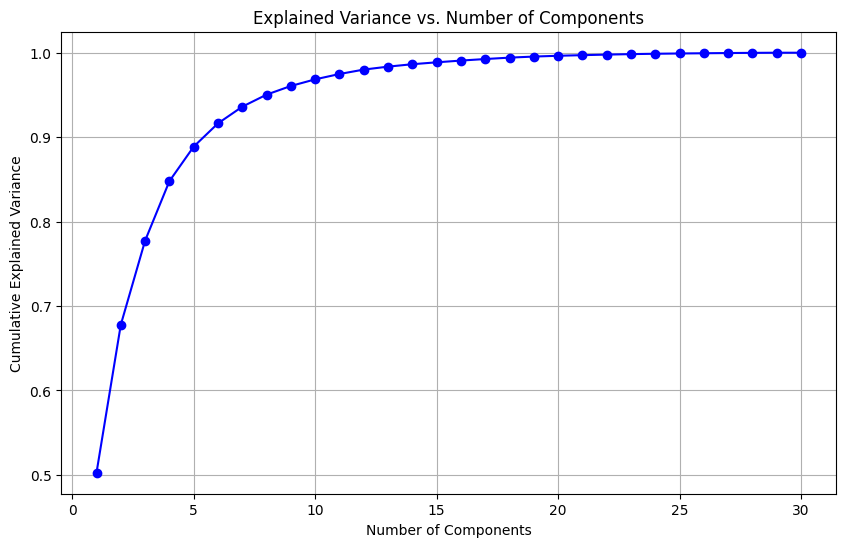

Cumulative explained variance: [0.5024924  0.6777538  0.777328   0.84781639 0.88874987 0.9163067
 0.936058   0.95035247 0.96060035 0.96846151 0.97478957 0.98001999
 0.98351151 0.98638124 0.9886304  0.99069623 0.9925322  0.99418026
 0.99544644 0.99638452 0.9971159  0.99775707 0.99833955 0.99877305
 0.99909911 0.99937117 0.99963165 0.99984375 1.         1.        ]


In [457]:
# Apply PCA with a large number of components to see variance explained by each component
# Plot the cumulative explained variance ratio
pca_model, cumulative_variance = plot_pca_variance_explained(feature_vector)

# Calculate the cumulative explained variance ratio
print("Cumulative explained variance:", cumulative_variance)

In [458]:
# Apply PCA for dimensionality reduction
n_components = 15
pca = PCA(n_components=n_components)
reduced_features = pca.fit_transform(feature_vector)

##### K-Means Clustering

The Elbow Method is used to determine the optimal number of clusters (n_clusters) in K-Means clustering. It involves fitting the K-Means algorithm with different values for n_clusters and plotting the Within-Cluster Sum of Squares (WCSS) to observe the point where the WCSS starts to diminish at a reduced rate (forming an "elbow").

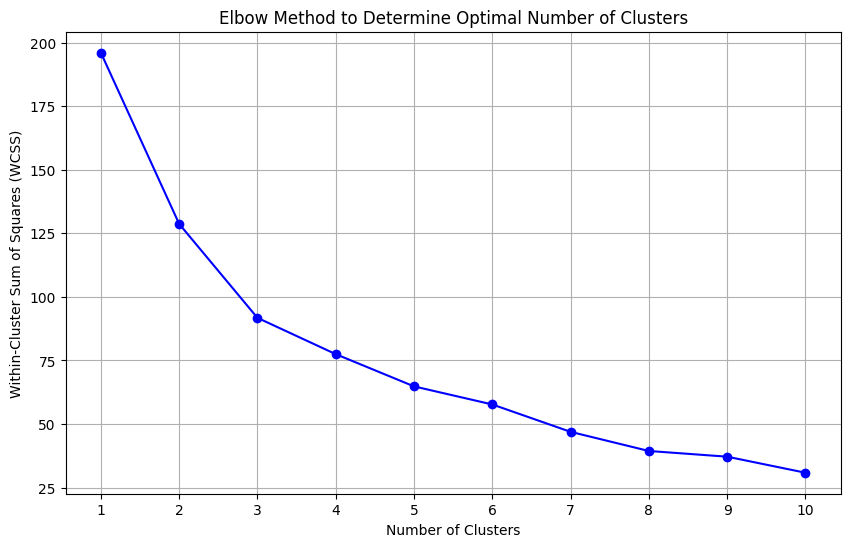

WCSS for each number of clusters: [196.01574299727346, 128.67973871490733, 91.73842903985044, 77.46573537422697, 64.78554798625751, 57.674876580849116, 46.9027905317941, 39.37581562145285, 37.134767345398714, 30.824376152119353]


In [459]:
# Calculate WCSS for different values of n_clusters
wcss = plot_elbow_method(reduced_features, cluster_range=range(1, 11))
print("WCSS for each number of clusters:", wcss)

In [460]:
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(reduced_features)

# Add the cluster labels to the original dataframe
df['cluster'] = kmeans.labels_

# Display the first few rows of the dataframe with the cluster assignments
print(df.head())

year_month    2000_02   2000_03   2000_04   2000_05   2001_02   2001_03  \
admin2_name                                                               
Bugesera     0.048663  0.287824  0.029717  0.047533  0.198612  0.511765   
Burera       0.223744  0.057659  0.515701  0.297788  0.470924  0.284068   
Gakenke      0.288386  0.044518  0.276182  0.503161  0.549409  0.524663   
Gasabo       0.136357  0.153792  0.137895  0.423600  0.286986  0.929500   
Gatsibo      0.090556  0.152024  0.009926  0.554050  0.188386  0.480626   

year_month    2001_04   2001_05   2002_02   2002_03  ...   2021_05   2022_02  \
admin2_name                                          ...                       
Bugesera     0.099550  0.118653  0.147781  0.738127  ...  0.372027  0.082231   
Burera       0.676074  0.218300  0.470325  0.000000  ...  0.063199  0.821926   
Gakenke      0.613534  0.277651  0.330135  0.141517  ...  0.343966  0.863964   
Gasabo       0.062511  0.164133  0.225793  0.567237  ...  0.627851  0.3127

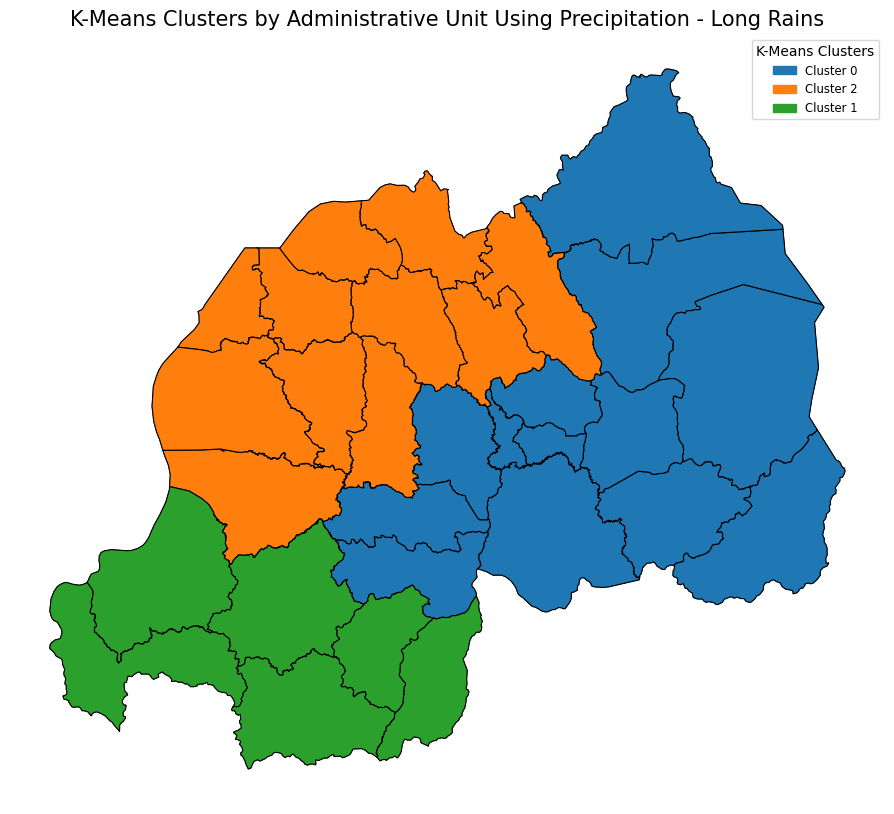

In [461]:
# Create the GeoDataFrame by merging the drought events DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all K-Means clusters with a legend
plot_all_geospatial_kmeans_clusters_with_legend("Long Rains")

##### Hierarchical Clustering

Ward’s method minimizes variance and helps in identifying clusters of similar rainfall amounts. It provides a dendrogram, which can help determine different levels of clustering.

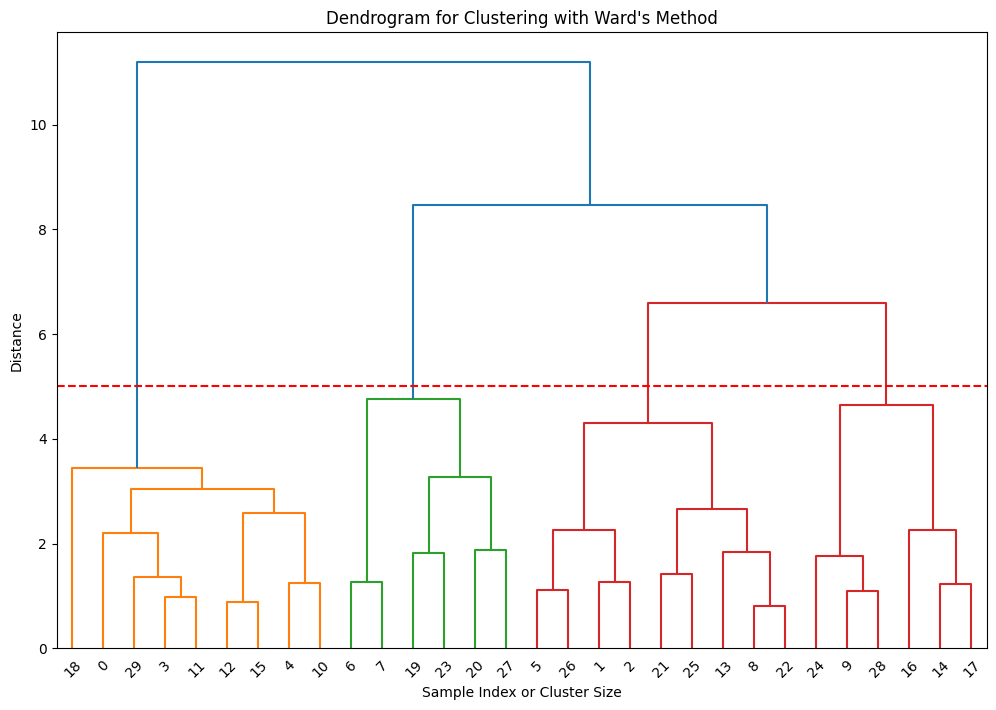

In [465]:
# Perform hierarchical clustering using Ward's method and plot the dendrogram to visualize cluster relationships
linkage_matrix = plot_hierarchical_dendrogram(reduced_features, cut_off=5, title='Dendrogram for Clustering with Ward\'s Method')

In [466]:
# Perform hierarchical clustering using Ward's method
linkage_matrix = linkage(reduced_features, method='ward')

# Assign clusters
n_clusters = 3
hierarchical_labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')

# Add the hierarchical cluster labels to the original dataframe
df['hierarchical_cluster'] = hierarchical_labels

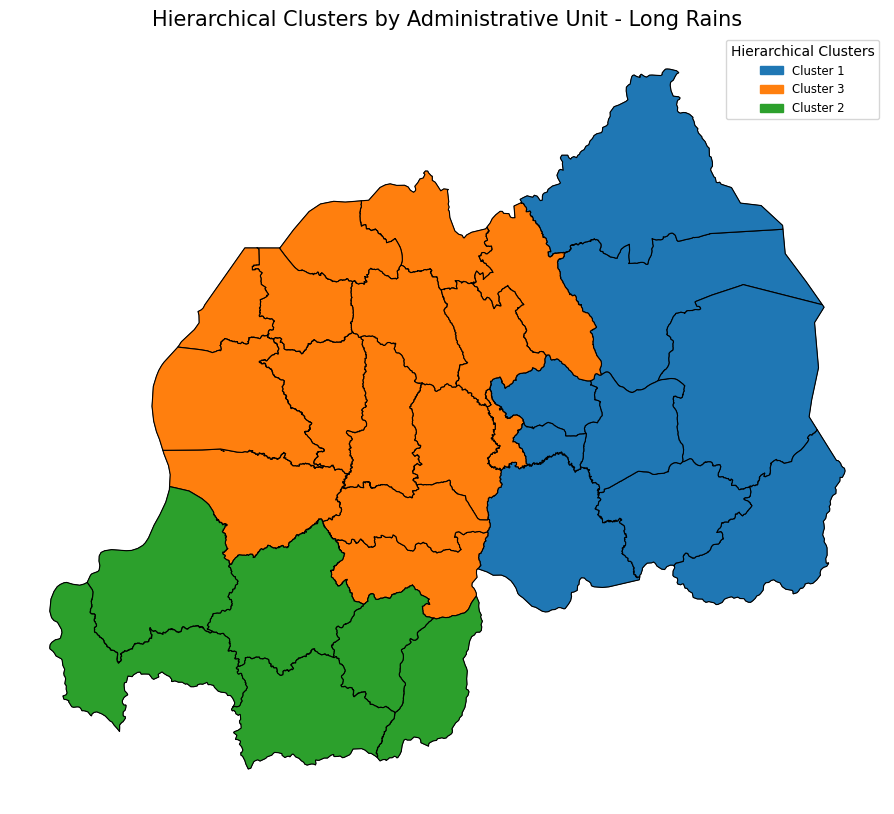

In [467]:
# Create the GeoDataFrame by merging the drought events DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all hierarchical clusters with a legend
plot_all_hierarchical_clusters_with_legend("Long Rains")

Notice that there are four regions in the center of Rwanda that are not consistent between the two clustering methods. I will proceed to treat these four regions as its own cluster, and then compare that cluster's statistics with that of the original clusters.

In [471]:
dfpreciplong = df

In [485]:
conditions = [
    (df['cluster'] == 0) & (df['hierarchical_cluster'] == 1),
    (df['cluster'] == 1) & (df['hierarchical_cluster'] == 2),
    (df['cluster'] == 2) & (df['hierarchical_cluster'] == 3)
]

new_clusters = ['0', '1', '2']

dfpreciplong['newcluster'] = np.select(conditions, new_clusters, default='3')

In [488]:
dfpreciplong

year_month,2000_02,2000_03,2000_04,2000_05,2001_02,2001_03,2001_04,2001_05,2002_02,2002_03,...,2022_03,2022_04,2022_05,2023_02,2023_03,2023_04,2023_05,cluster,hierarchical_cluster,newcluster
admin2_name,,,,,,,,,,,,,,,,,,,,,
Bugesera,0.048663,0.287824,0.029717,0.047533,0.198612,0.511765,0.099550,0.118653,0.147781,0.738127,...,0.111156,0.449415,0.007544,0.097327,0.197539,0.190347,0.028294,0,1,0
Burera,0.223744,0.057659,0.515701,0.297788,0.470924,0.284068,0.676074,0.218300,0.470325,0.000000,...,0.316826,0.248611,0.899393,0.144855,0.615073,0.453777,0.705212,2,3,2
Gakenke,0.288386,0.044518,0.276182,0.503161,0.549409,0.524663,0.613534,0.277651,0.330135,0.141517,...,0.417018,0.215322,0.815425,0.116534,0.780127,0.520490,0.730416,2,3,2
Gasabo,0.136357,0.153792,0.137895,0.423600,0.286986,0.929500,0.062511,0.164133,0.225793,0.567237,...,0.312392,0.525696,0.194587,0.040558,0.397013,0.185058,0.136097,0,1,0
Gatsibo,0.090556,0.152024,0.009926,0.554050,0.188386,0.480626,0.120414,0.095466,0.036685,0.402983,...,0.156965,0.787690,0.142083,0.012406,0.257553,0.185319,0.140021,0,1,0
Gicumbi,0.187951,0.143517,0.264528,0.670193,0.343712,0.569429,0.395208,0.226641,0.210491,0.358235,...,0.383873,0.370969,0.562634,0.039740,0.565783,0.572787,0.479711,2,3,2
Gisagara,0.678019,0.754171,0.230116,0.075340,0.596358,0.000000,0.610804,0.428805,0.481159,0.961244,...,0.641614,0.750593,0.455653,0.466754,0.620232,0.636961,0.119253,1,2,1
Huye,0.620259,0.523321,0.313828,0.311998,0.443345,0.073924,0.563830,0.621143,0.459813,0.598204,...,0.672285,0.714388,0.693789,0.391803,0.521642,0.557203,0.229777,1,2,1
Kamonyi,0.213995,0.017586,0.157260,0.437880,0.367627,0.816024,0.001549,0.106713,0.200175,0.275103,...,0.294519,0.343105,0.384835,0.099381,0.307739,0.317841,0.287727,0,3,3


In [497]:
# Load the FAO GAUL dataset for Kenya at administrative level 2
admin_level = 'level2'
country_name = 'Rwanda'
roi = ee.FeatureCollection(f"FAO/GAUL/2015/{admin_level}")
roi = roi.filter(ee.Filter.eq('ADM0_NAME', country_name))

# Print the available counties (ADM1_NAME) for verification
counties_list = roi.aggregate_array('ADM2_NAME').getInfo()
print(counties_list)

# Define the country and administrative level
country_name = 'Rwanda'
admin_level = 'level2'
roi = ee.FeatureCollection(f"FAO/GAUL/2015/{admin_level}").filter(ee.Filter.eq('ADM0_NAME', country_name))

# Export to GeoJSON
geojson = roi.getInfo()
with open('rwanda_admin2_boundaries.geojson', 'w') as f:
    json.dump(geojson, f)

# Define the new clusters
cluster0 = [
    'Bugesera', 'Gatsibo', 'Gasabo', 'Kayonza', 'Kicukiro', 'Kirehe', 'Ngoma', 'Nyagatare', 'Ruhango', 'Rwamagana'
]

cluster1 = [
    'Gisagara', 'Huye', 'Nyamagabe', 'Myamasheke', 'Myaruguru', 'Rusizi'
]

cluster2 = [
    'Burera', 'Gakenke', 'Gicumbi', 'Karongi', 'Muahnga', 'Musanze', 'Ngororero', 'Nyabihu', 'Rubayu', 'Rulindo', 'Rutsiro'
]

cluster3 = [
    'Kamonyi', 'Nyanza', 'Nyarugenge', 'Ruhango'
]

# Filter the regions based on Admin 2 names

cluster_0 = roi.filter(ee.Filter.inList('ADM2_NAME', cluster0))
cluster_1 = roi.filter(ee.Filter.inList('ADM2_NAME', cluster1))
cluster_2 = roi.filter(ee.Filter.inList('ADM2_NAME', cluster2))
cluster_3 = roi.filter(ee.Filter.inList('ADM2_NAME', cluster3))

['Bugesera', 'Gatsibo', 'Kayonza', 'Kirehe', 'Ngoma', 'Nyagatare', 'Rwamagana', 'Gasabo', 'Kicukiro', 'Nyarugenge', 'Burera', 'Gakenke', 'Gicumbi', 'Musanze', 'Rulindo', 'Gisagara', 'Huye', 'Kamonyi', 'Muhanga', 'Nyamagabe', 'Nyanza', 'Nyaruguru', 'Ruhango', 'Karongi', 'Ngororero', 'Nyabihu', 'Nyamasheke', 'Rubavu', 'Rusizi', 'Rutsiro']


In [ ]:
ef monthly_sum_from_pentads(clipped_pentads, region_name, region, year, start_month, end_month):
    """
    Calculate monthly precipitation sums from CHIRPS pentads (5-day intervals) for a specified region (at Admin 2 level) and time period.

    Parameters:
    clipped_pentads (ee.ImageCollection): The CHIRPS pentad data clipped to the region of interest.
    region_name (str): Name of the broader region.
    region (ee.FeatureCollection): FeatureCollection of the region containing individual Admin 2 geometries.
    year (int): The year for which monthly totals are to be created.
    start_month (int): The starting month of the period (1 to 12).
    end_month (int): The ending month of the period (1 to 12).

    Returns:
    list: A list of dictionaries containing monthly precipitation data for each Admin 2 region within the specified range.
    """
    monthly_precip_data = []

    # Loop through each Admin 2 feature in the region
    admin2_features = region.toList(region.size())

    for i in range(region.size().getInfo()):
        admin2_feature = ee.Feature(admin2_features.get(i))
        admin2_name = admin2_feature.get('newcluster').getInfo()

        # Loop through the specified months to calculate monthly precipitation totals
        for month in range(start_month, end_month + 1):
            start_month_date = ee.Date.fromYMD(year, month, 1)
            end_month_date = start_month_date.advance(1, 'month')

            # Filter pentad data for the current month
            pentad_filtered = clipped_pentads.filterDate(start_month_date, end_month_date)

            # Sum all pentads to form the monthly total
            monthly_sum = pentad_filtered.sum() \
                                         .reduceRegion(
                                             reducer=ee.Reducer.mean(),
                                             geometry=admin2_feature.geometry(),
                                             scale=5000,
                                             maxPixels=1e8
                                         )

            # Extract the value and add additional information
            precipitation_value = monthly_sum.get('precipitation').getInfo() if monthly_sum.get('precipitation') else None

            monthly_precip_data.append({
                'year': year,
                'month': month,
                'date': start_month_date.format().getInfo(),
                'region': region_name,
                'newcluster': newcluster,
                'precipitation': precipitation_value
            })

    return monthly_precip_data

##### DBSCAN Clustering

In [379]:
# Assuming 'df' is your original DataFrame and 'reduced_features' contains the PCA-reduced data
df_with_clusters, best_eps, best_min_samples, best_score = optimize_dbscan(df, reduced_features)

# You can check the optimized results
print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples}, Best Silhouette Score: {best_score}")

No valid clusters were found with the given parameters.
Best eps: None, Best min_samples: None, Best Silhouette Score: None


#### Clustering Short Rains

In [380]:
# Normalize the precipitation data
scaler = MinMaxScaler()
df = pd.DataFrame(scaler.fit_transform(df_pivot_short_rains),
                         index=df_pivot_short_rains.index,  # Retain the index (admin2_name)
                         columns=df_pivot_short_rains.columns)

# Resulting dataframe after preprocessing
print(df.head())

year_month    2000_09   2000_10   2000_11   2001_09   2001_10   2001_11  \
admin2_name                                                               
Bugesera     0.045605  0.191460  0.000000  0.055662  0.499421  0.274577   
Burera       0.492747  0.811768  0.377001  0.508947  0.221614  0.402165   
Gakenke      0.289104  0.549384  0.300728  0.215794  0.265927  0.404721   
Gasabo       0.073069  0.307000  0.208869  0.143420  0.991727  0.290056   
Gatsibo      0.196830  0.483348  0.243542  0.266923  1.000000  0.000928   

year_month    2002_09   2002_10   2002_11   2003_09  ...   2020_11   2021_09  \
admin2_name                                          ...                       
Bugesera     0.010483  0.000000  0.218893  0.186025  ...  0.269272  0.186458   
Burera       0.944345  0.765092  0.452122  0.919183  ...  0.690942  0.919125   
Gakenke      0.541954  0.408348  0.411298  0.571169  ...  0.632661  0.726036   
Gasabo       0.128336  0.208839  0.143952  0.405076  ...  0.386541  0.5496

##### Feature Vector Construction

In [381]:
# Construct the feature vector using only the precipitation columns (2000_03, 2000_04, etc.)
feature_vector = df

# Display the first few rows of the feature vector
print(feature_vector.head())

year_month    2000_09   2000_10   2000_11   2001_09   2001_10   2001_11  \
admin2_name                                                               
Bugesera     0.045605  0.191460  0.000000  0.055662  0.499421  0.274577   
Burera       0.492747  0.811768  0.377001  0.508947  0.221614  0.402165   
Gakenke      0.289104  0.549384  0.300728  0.215794  0.265927  0.404721   
Gasabo       0.073069  0.307000  0.208869  0.143420  0.991727  0.290056   
Gatsibo      0.196830  0.483348  0.243542  0.266923  1.000000  0.000928   

year_month    2002_09   2002_10   2002_11   2003_09  ...   2020_11   2021_09  \
admin2_name                                          ...                       
Bugesera     0.010483  0.000000  0.218893  0.186025  ...  0.269272  0.186458   
Burera       0.944345  0.765092  0.452122  0.919183  ...  0.690942  0.919125   
Gakenke      0.541954  0.408348  0.411298  0.571169  ...  0.632661  0.726036   
Gasabo       0.128336  0.208839  0.143952  0.405076  ...  0.386541  0.5496

To optimize the number of components (n_components) for Principal Component Analysis (PCA), we need to determine how many components are sufficient to retain the majority of the variance in the data. This can be done by plotting the explained variance ratio and observing when additional components contribute diminishing returns.

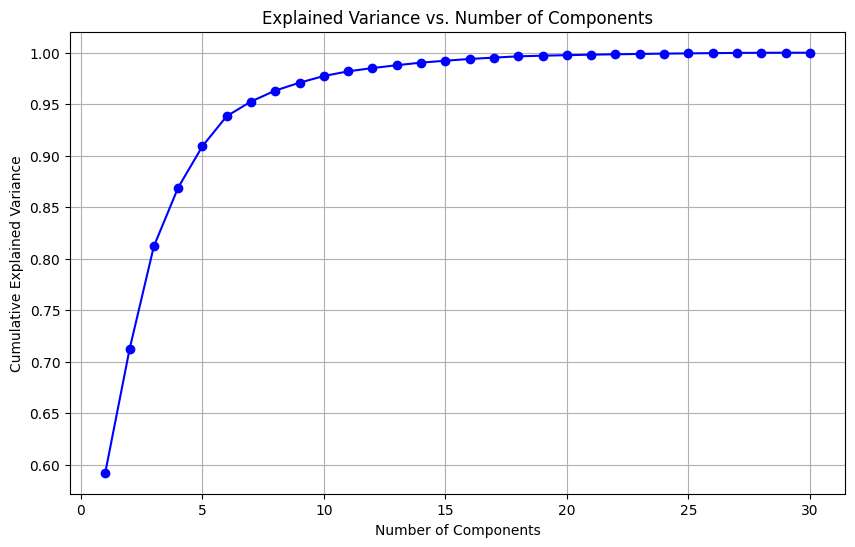

Cumulative explained variance: [0.5921127  0.71202195 0.81197828 0.86899387 0.90923223 0.93838719
 0.95260584 0.96326619 0.97092136 0.97738407 0.98192446 0.98511284
 0.98786156 0.99039189 0.99223154 0.99393898 0.99525458 0.99648711
 0.99710476 0.99761693 0.99810915 0.99847106 0.9988277  0.99912768
 0.99937397 0.99961143 0.99980431 0.99993076 1.         1.        ]


In [382]:
# Apply PCA with a large number of components to see variance explained by each component
# Plot the cumulative explained variance ratio
pca_model, cumulative_variance = plot_pca_variance_explained(feature_vector)

# Calculate the cumulative explained variance ratio
print("Cumulative explained variance:", cumulative_variance)

In [383]:
# Apply PCA for dimensionality reduction
n_components = 10
pca = PCA(n_components=n_components)
reduced_features = pca.fit_transform(feature_vector)

##### K-Means Clustering

The Elbow Method is used to determine the optimal number of clusters (n_clusters) in K-Means clustering. It involves fitting the K-Means algorithm with different values for n_clusters and plotting the Within-Cluster Sum of Squares (WCSS) to observe the point where the WCSS starts to diminish at a reduced rate (forming an "elbow").

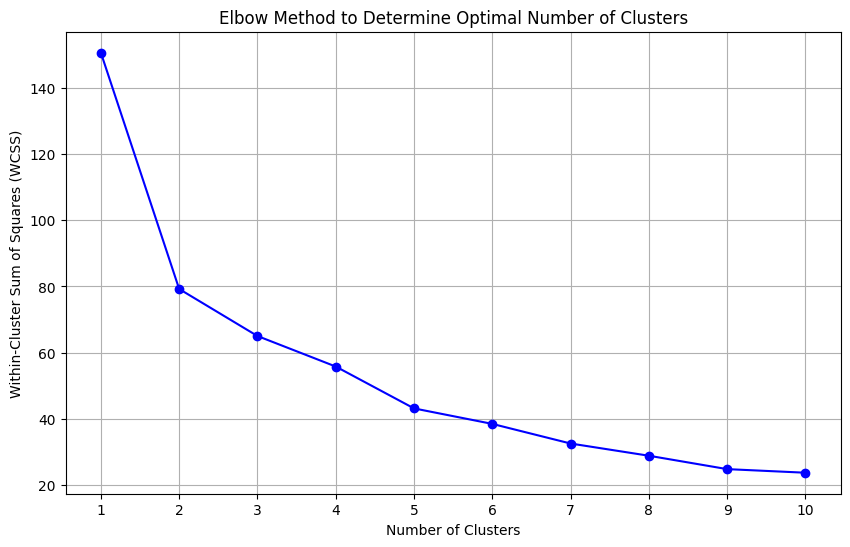

WCSS for each number of clusters: [150.55528953845658, 79.2432801199073, 65.054169535655, 55.83894184218521, 43.201155797374426, 38.52460082226454, 32.60262611661731, 28.915125939815066, 24.874466620100556, 23.787880947457275]


In [384]:
# Calculate WCSS for different values of n_clusters
wcss = plot_elbow_method(reduced_features, cluster_range=range(1, 11))
print("WCSS for each number of clusters:", wcss)

In [385]:
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(reduced_features)

# Add the cluster labels to the original dataframe
df['cluster'] = kmeans.labels_

# Display the first few rows of the dataframe with the cluster assignments
print(df.head())

year_month    2000_09   2000_10   2000_11   2001_09   2001_10   2001_11  \
admin2_name                                                               
Bugesera     0.045605  0.191460  0.000000  0.055662  0.499421  0.274577   
Burera       0.492747  0.811768  0.377001  0.508947  0.221614  0.402165   
Gakenke      0.289104  0.549384  0.300728  0.215794  0.265927  0.404721   
Gasabo       0.073069  0.307000  0.208869  0.143420  0.991727  0.290056   
Gatsibo      0.196830  0.483348  0.243542  0.266923  1.000000  0.000928   

year_month    2002_09   2002_10   2002_11   2003_09  ...   2021_09   2021_10  \
admin2_name                                          ...                       
Bugesera     0.010483  0.000000  0.218893  0.186025  ...  0.186458  0.319663   
Burera       0.944345  0.765092  0.452122  0.919183  ...  0.919125  0.329769   
Gakenke      0.541954  0.408348  0.411298  0.571169  ...  0.726036  0.362120   
Gasabo       0.128336  0.208839  0.143952  0.405076  ...  0.549683  0.5604

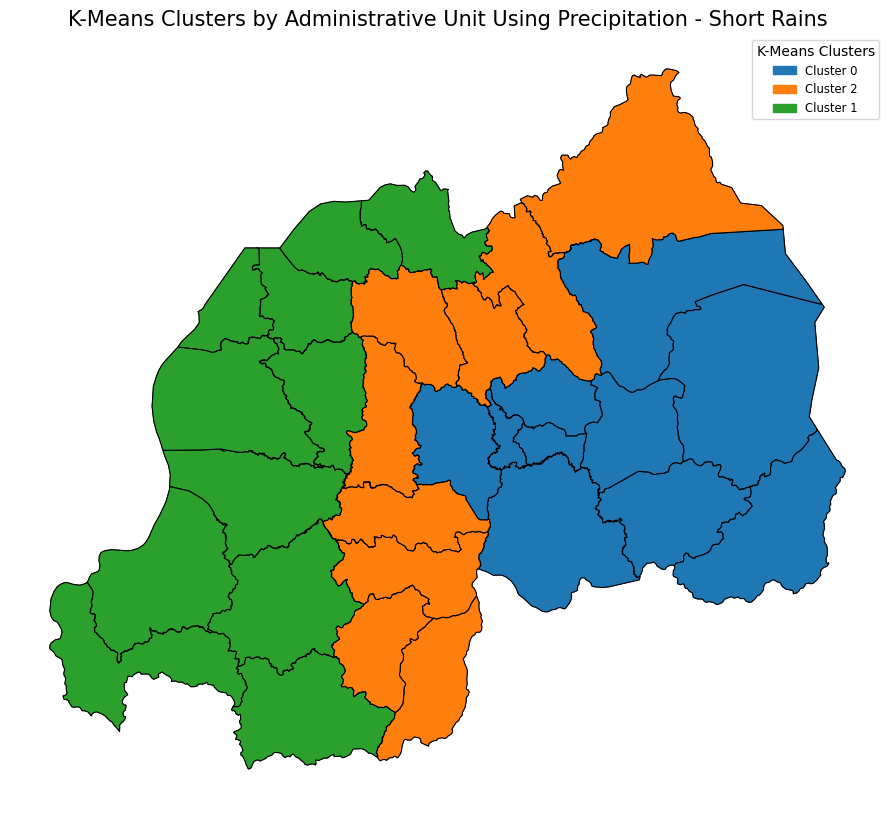

In [386]:
# Create the GeoDataFrame by merging the drought events DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all K-Means clusters with a legend
plot_all_geospatial_kmeans_clusters_with_legend("Short Rains")

##### Hierarchical Clustering

Ward’s method minimizes variance and helps in identifying clusters of similar rainfall amounts. It provides a dendrogram, which can help determine different levels of clustering.

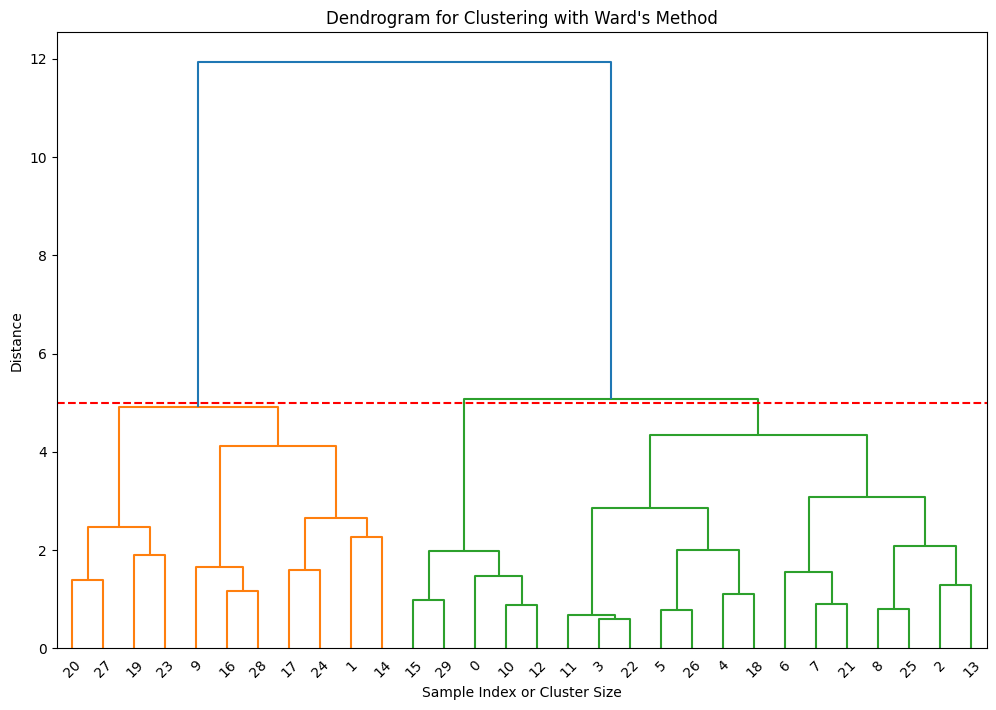

In [387]:
# Perform hierarchical clustering using Ward's method and plot the dendrogram to visualize cluster relationships
linkage_matrix = plot_hierarchical_dendrogram(reduced_features, cut_off=5, title='Dendrogram for Clustering with Ward\'s Method')

In [388]:
# Perform hierarchical clustering using Ward's method
linkage_matrix = linkage(reduced_features, method='ward')

# Assign clusters
n_clusters = 3
hierarchical_labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')

# Add the hierarchical cluster labels to the original dataframe
df['hierarchical_cluster'] = hierarchical_labels

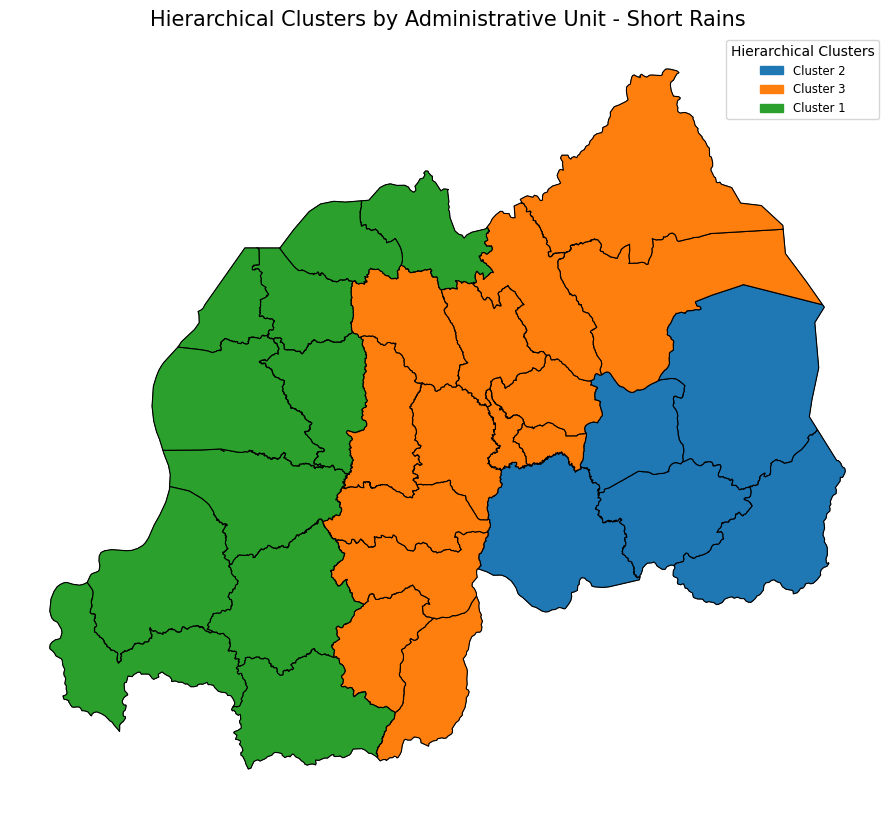

In [389]:
# Create the GeoDataFrame by merging the drought events DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all hierarchical clusters with a legend
plot_all_hierarchical_clusters_with_legend("Short Rains")

##### DBSCAN Clustering

In [390]:
# Assuming 'df' is your original DataFrame and 'reduced_features' contains the PCA-reduced data
df_with_clusters, best_eps, best_min_samples, best_score = optimize_dbscan(df, reduced_features)

# You can check the optimized results
print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples}, Best Silhouette Score: {best_score}")

No valid clusters were found with the given parameters.
Best eps: None, Best min_samples: None, Best Silhouette Score: None


## Clustering Using Drought Identification

In [391]:
# Create a copy of the dataset to avoid modifying the original data
df = drought_events_df.copy()

# Drop the 'Drought Event' and 'region' columns
df.drop(columns=['Drought Event', 'region'], inplace=True)

# Check the result
print(df.head())

  admin2_name      season spi_scale  Drought Duration  Drought Severity  \
0      Gasabo  Long Rains         1                 0         -1.667118   
1      Gasabo  Long Rains         1                 0         -1.230800   
2      Gasabo  Long Rains         1                 0         -1.373133   
3      Gasabo  Long Rains         1                 9         -1.457783   
4      Gasabo  Long Rains         1                 0         -1.079836   

   Drought Intensity Drought Event_start Drought Event_end  
0           0.000000             2000-02           2000-03  
1           0.000000             2001-02           2001-03  
2           0.000000             2003-02           2003-03  
3          -0.161976             2004-05           2005-02  
4           0.000000             2008-02           2008-03  


In [392]:
# Define the unique values for 'spi_scale' and 'season'
spi_scales = df['spi_scale'].unique()
seasons = df['season'].unique()

In [393]:
# Initialize an empty dictionary to store the datasets
datasets = {}

# Loop through each combination of 'spi_scale' and 'season'
for spi_scale in spi_scales:
    for season in seasons:
        # Create a filtered dataset for the specific combination of 'spi_scale' and 'season'
        dataset_name = f"{spi_scale}_{season}".replace(" ", "_").lower()

        # Filter the DataFrame for the current 'spi_scale' and 'season'
        df_filtered = df[(df['spi_scale'] == spi_scale) & (df['season'] == season)].copy()

        # Drop the 'spi_scale' and 'season' columns in the resulting dataset
        df_filtered.drop(columns=['spi_scale', 'season'], inplace=True)

        # Add the resulting DataFrame to the dictionary
        datasets[dataset_name] = df_filtered

In [394]:
# Loop through the dictionary to view the index (keys) and key-value pairs
for idx, (key, value) in enumerate(datasets.items()):
    print(f"Index {idx}: Key = {key}, Dataset Shape = {value.shape}")
    print("-" * 40)

Index 0: Key = 1_long_rains, Dataset Shape = (440, 6)
----------------------------------------
Index 1: Key = 1_short_rains, Dataset Shape = (282, 6)
----------------------------------------
Index 2: Key = 3_long_rains, Dataset Shape = (276, 6)
----------------------------------------
Index 3: Key = 3_short_rains, Dataset Shape = (156, 6)
----------------------------------------


### Clustering Long Rains with SPI1

In [395]:
# Access the first dataset
df = process_drought_dataset_by_index(datasets=datasets, index=0)

# Check the result
print(df.head())

  admin2_name  Drought Duration  Drought Severity  Drought Intensity  \
0      Gasabo                 0         -1.667118           0.000000   
1      Gasabo                 0         -1.230800           0.000000   
2      Gasabo                 0         -1.373133           0.000000   
3      Gasabo                 9         -1.457783          -0.161976   
4      Gasabo                 0         -1.079836           0.000000   

  Drought Event_start Drought Event_end  start_year  end_year  
0          2000-02-01        2000-03-01        2000      2000  
1          2001-02-01        2001-03-01        2001      2001  
2          2003-02-01        2003-03-01        2003      2003  
3          2004-05-01        2005-02-01        2004      2005  
4          2008-02-01        2008-03-01        2008      2008  


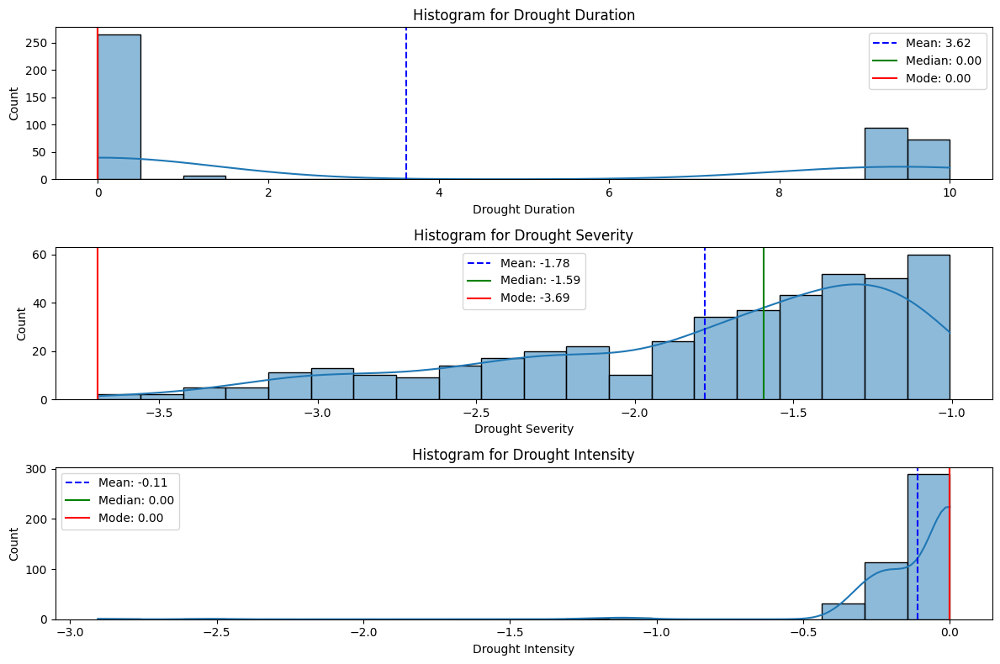

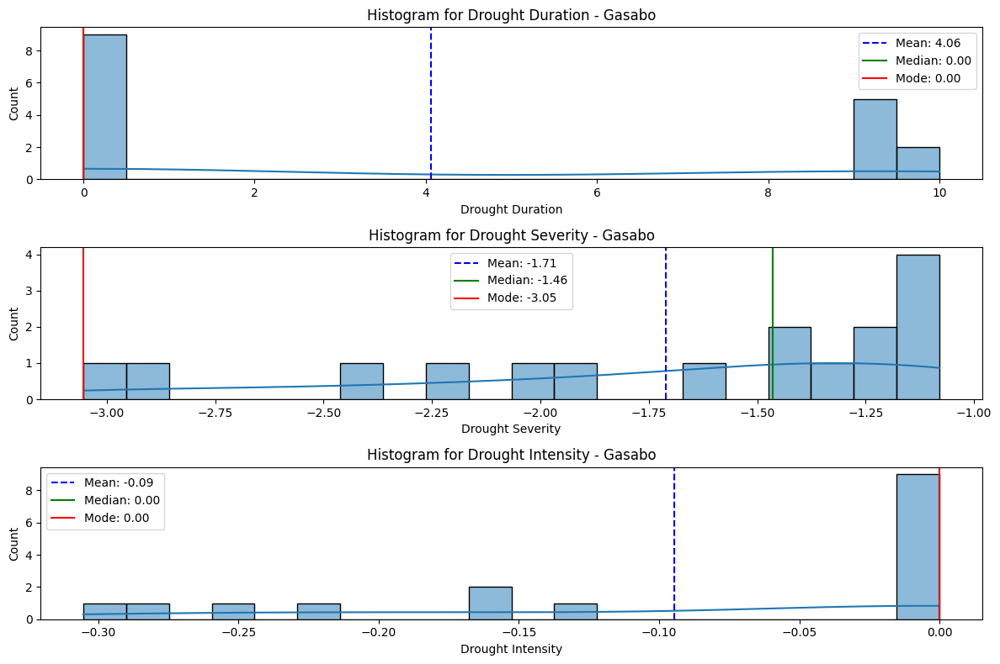

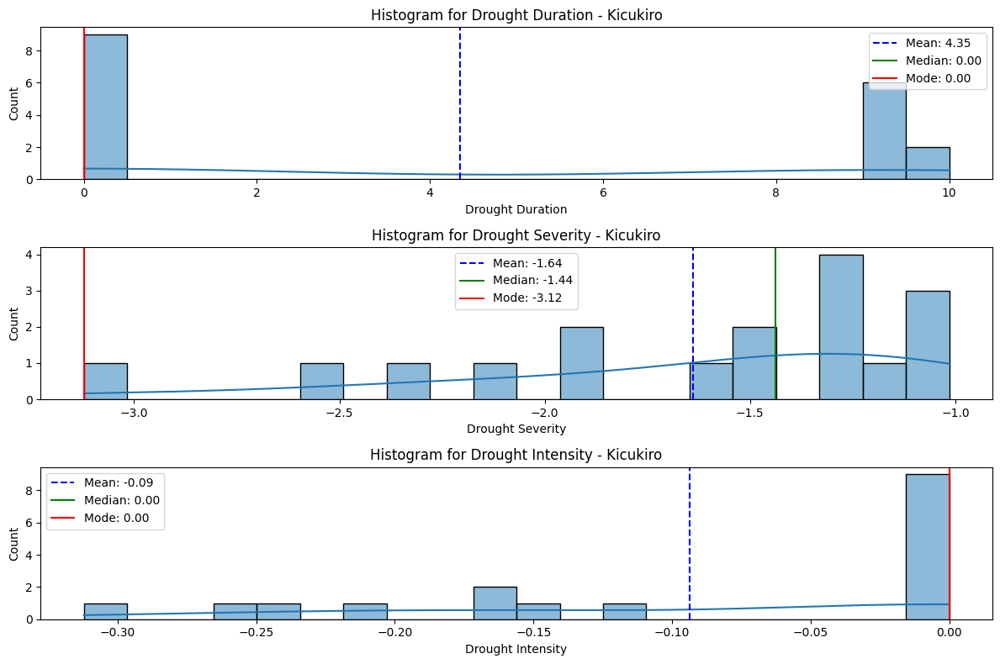

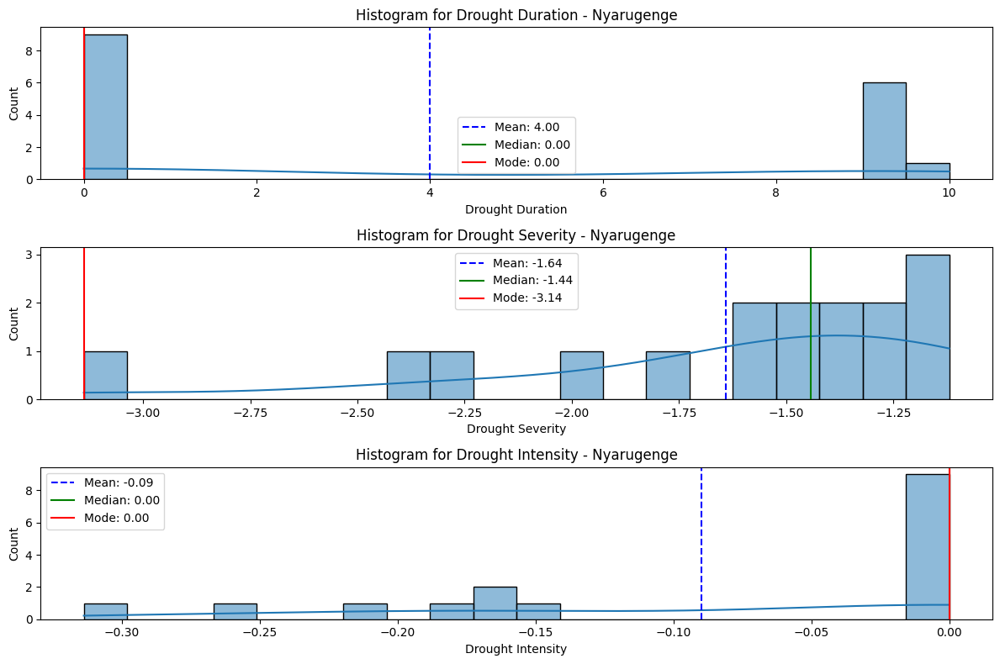

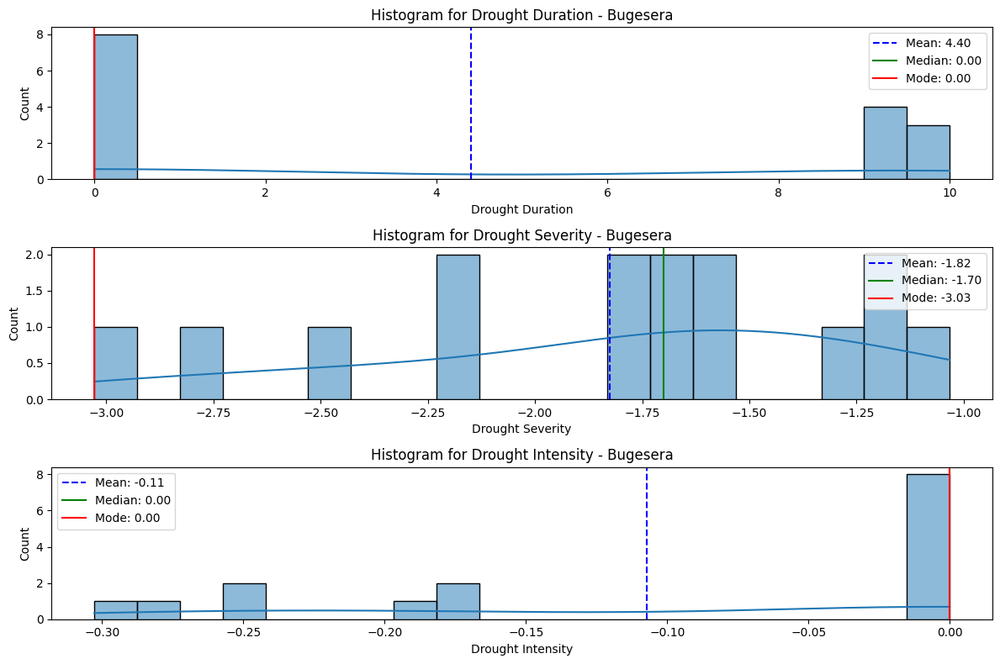

...

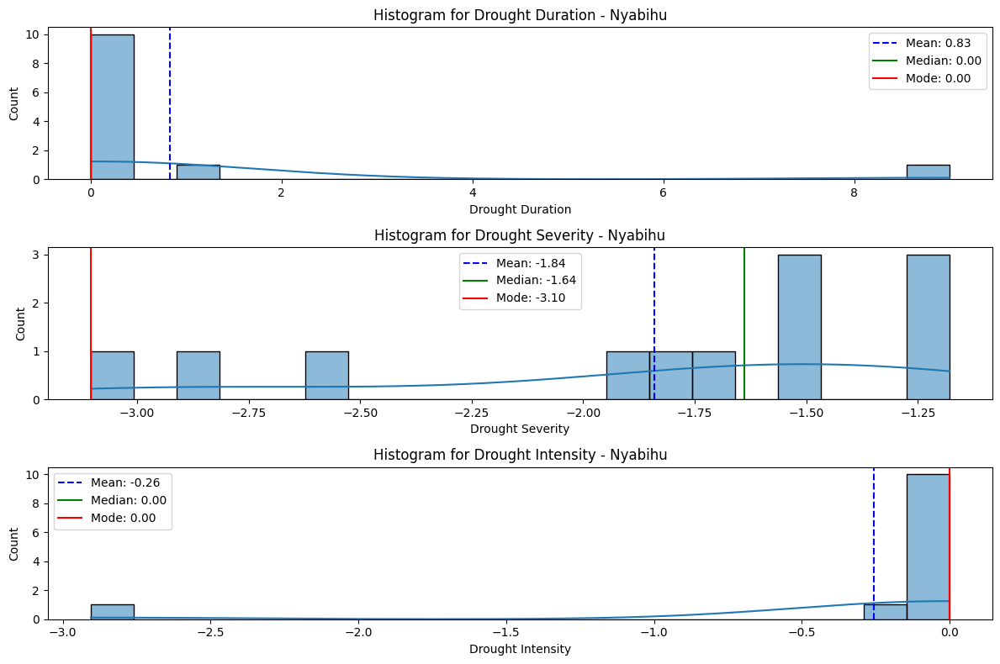

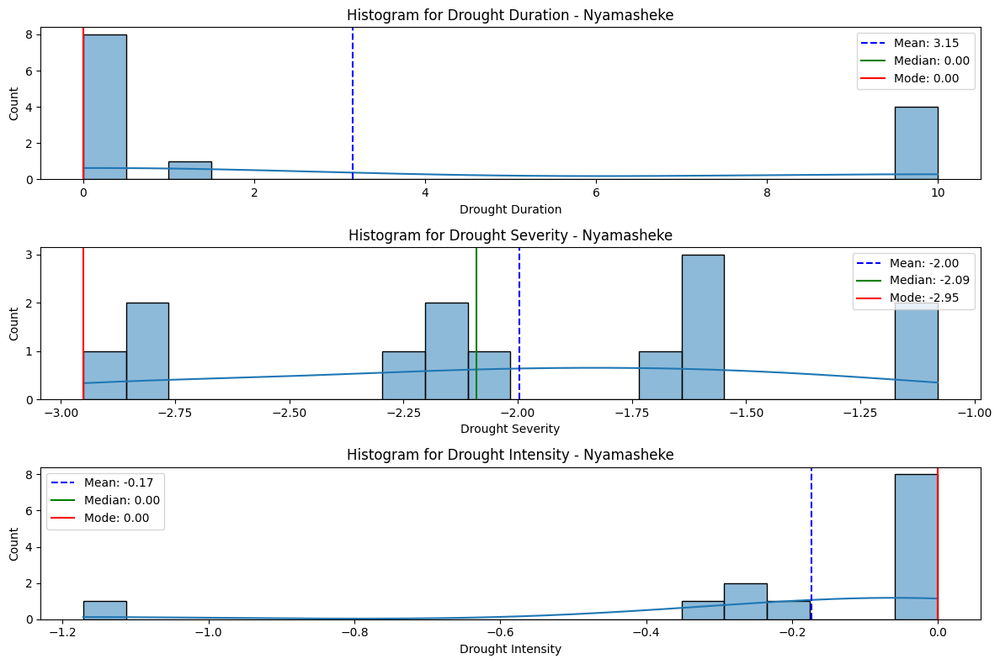

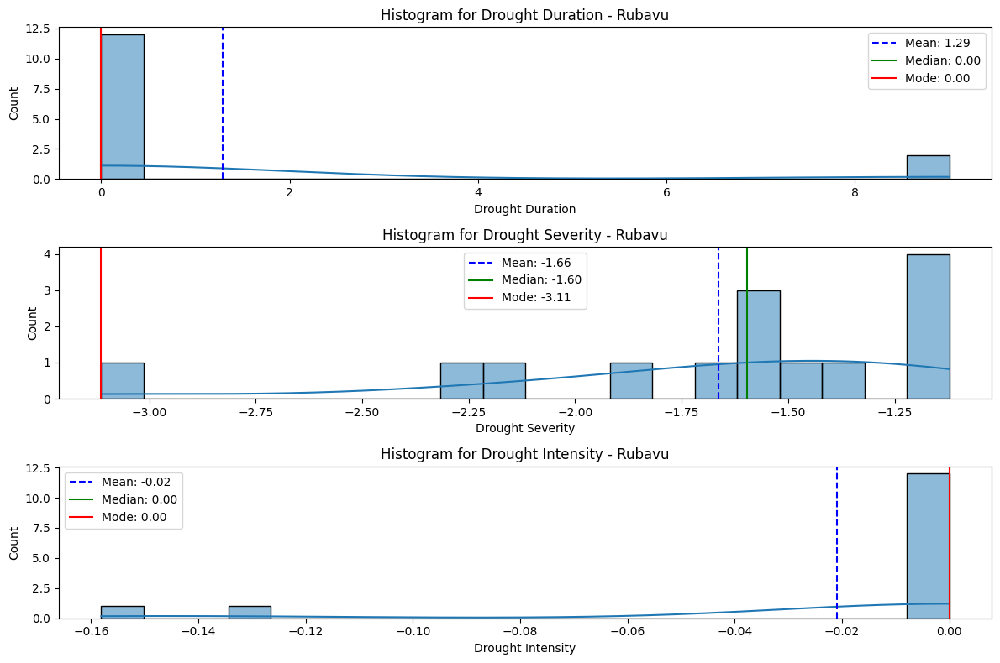

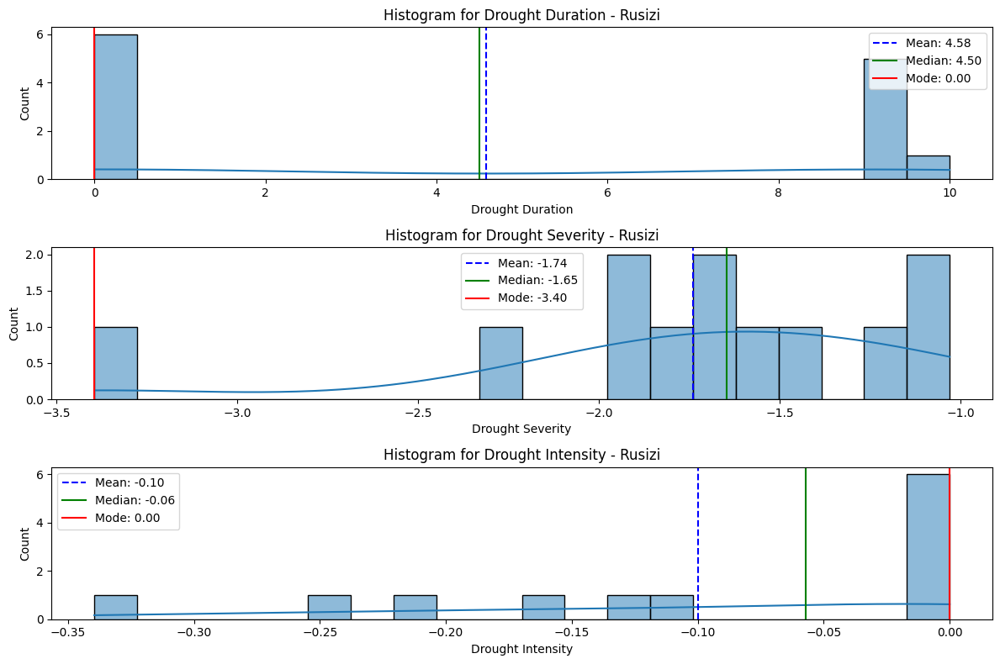

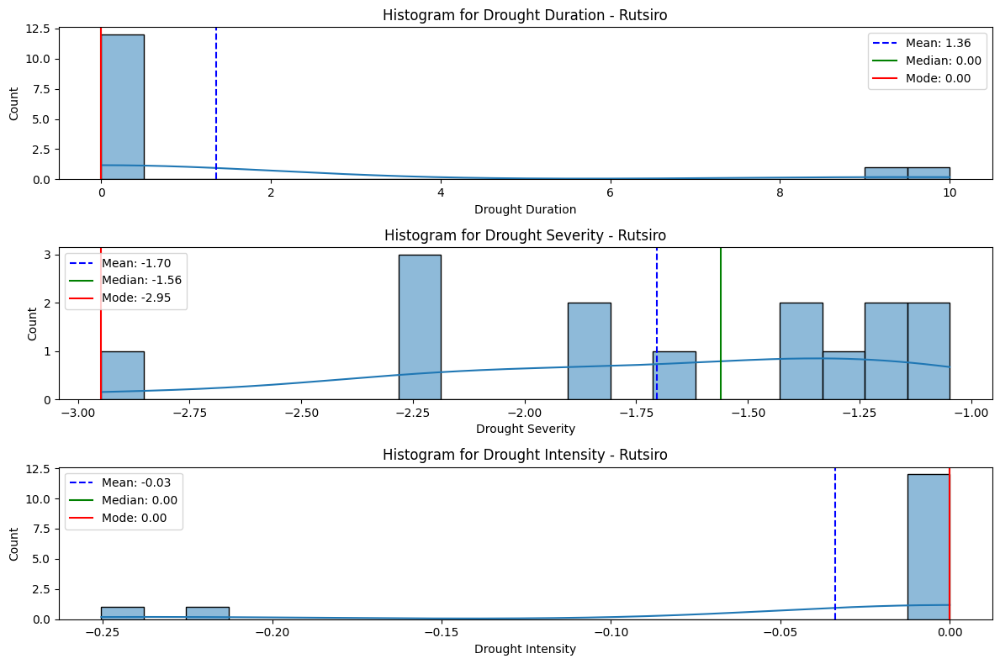

In [396]:
# Plots histograms for Drought Duration, Drought Severity, and Drought Intensity
plot_drought_metrics_histograms_with_stats(df)

In [397]:
# Drought Duration - bimodal with two peaks
# Drought Severity - left-skewed (negatively skewed) distribution
# Drought Intensity -  somewhat bimodal but left skewed
df_combined = process_drought_data(df, duration_stat='median', severity_stat='median', intensity_stat='mean')

# Display the result
print(df_combined.head())

  admin2_name  Drought Duration  Drought Severity  Drought Intensity  2000  \
0    Bugesera               0.0         -1.700720          -0.107088     1   
1      Burera               0.0         -1.699446          -0.088053     1   
2     Gakenke               0.0         -2.060760          -0.099586     1   
3      Gasabo               0.0         -1.463588          -0.094683     1   
4     Gatsibo               0.0         -1.594760          -0.108538     1   

   2001  2002  2003  2004  2005  ...  2014  2015  2016  2017  2018  2019  \
0     1     0     1     1     1  ...     1     1     1     1     1     1   
1     1     1     1     1     1  ...     1     1     1     1     0     1   
2     1     1     1     1     1  ...     1     1     1     1     1     1   
3     1     0     1     1     1  ...     1     1     1     1     1     1   
4     1     1     1     1     1  ...     1     1     1     1     1     0   

   2020  2021  2022  2023  
0     1     1     0     1  
1     1     1     

#### Data Preprocessing

In [398]:
# Normalize the combined dataset
scaler = MinMaxScaler()

# Keep 'admin2_name' aside
admin2_names = df_combined['admin2_name']

# Exclude 'admin2_name' from the features to be scaled
df_combined_for_clustering = df_combined.drop(columns=['admin2_name'])

# Convert column names to strings
df_combined_for_clustering.columns = df_combined_for_clustering.columns.astype(str)

# Apply MinMaxScaler to the remaining features (excluding 'admin2_name')
df = pd.DataFrame(scaler.fit_transform(df_combined_for_clustering),
                         columns=df_combined_for_clustering.columns)

#### Feature Vector Construction

To optimize the number of components (n_components) for Principal Component Analysis (PCA), we need to determine how many components are sufficient to retain the majority of the variance in the data. This can be done by plotting the explained variance ratio and observing when additional components contribute diminishing returns.

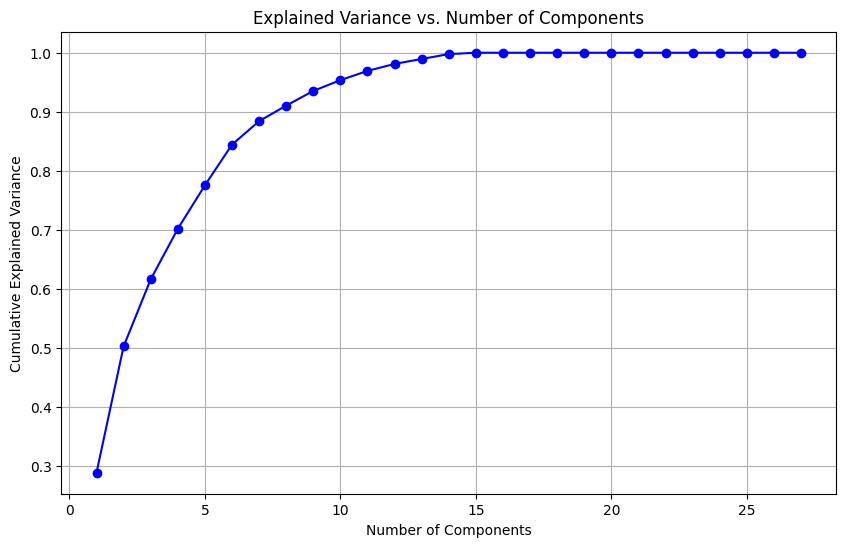

Cumulative explained variance: [0.28816184 0.50222    0.61583934 0.70158957 0.77523138 0.84420177
 0.88398661 0.91033756 0.93525283 0.95351443 0.96919827 0.98100279
 0.98943572 0.99764926 1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]


In [399]:
# Apply PCA with a large number of components to see variance explained by each component
# Plot the cumulative explained variance ratio
pca_model, cumulative_variance = plot_pca_variance_explained(df)

# Calculate the cumulative explained variance ratio
print("Cumulative explained variance:", cumulative_variance)

In [400]:
# Choose the optimal number of components based on the plot
optimal_n_components = 17  # This value should be adjusted based on the plot

# Apply PCA with the optimal number of components
pca_optimized = PCA(n_components=optimal_n_components)
reduced_features = pca_optimized.fit_transform(df)

# Print the shape of the reduced feature set
print(f"Reduced Feature Set Shape: {reduced_features.shape}")
print("Explained Variance by Optimal Components:")
print(np.sum(pca_optimized.explained_variance_ratio_))

Reduced Feature Set Shape: (30, 17)
Explained Variance by Optimal Components:
1.0


#### K-Means Clustering

The Elbow Method is used to determine the optimal number of clusters (n_clusters) in K-Means clustering. It involves fitting the K-Means algorithm with different values for n_clusters and plotting the Within-Cluster Sum of Squares (WCSS) to observe the point where the WCSS starts to diminish at a reduced rate (forming an "elbow").

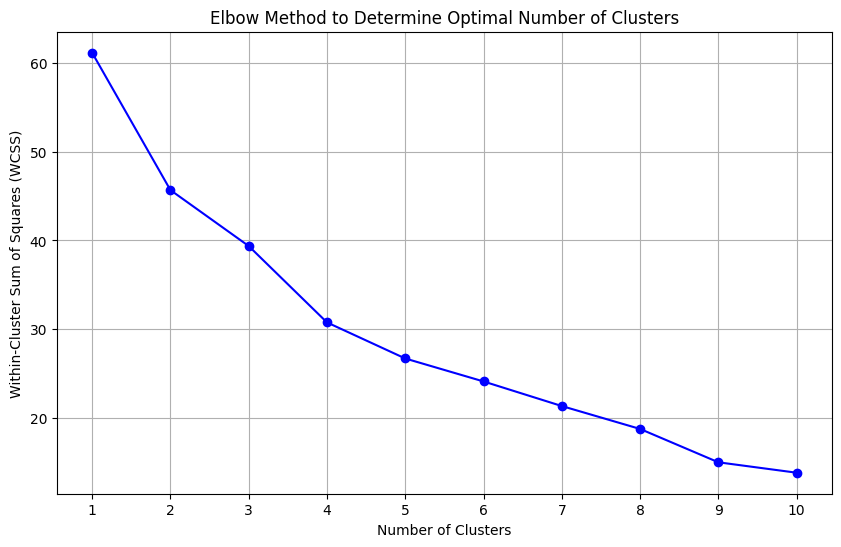

WCSS for each number of clusters: [61.16172012220607, 45.676237359091225, 39.36863884452195, 30.756788843154283, 26.68902469217154, 24.100212523883723, 21.327514494286223, 18.74480328397577, 14.98588637755624, 13.811040672716356]


In [401]:
# Calculate WCSS for different values of n_clusters
wcss = plot_elbow_method(reduced_features, cluster_range=range(1, 11))
print("WCSS for each number of clusters:", wcss)

In [402]:
# Define the number of clusters (determined using the Elbow Method or chosen directly)
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(reduced_features)

# Add the cluster labels to the original DataFrame
df['cluster'] = kmeans.labels_

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with K-Means cluster assignments:")
print(df.head())

DataFrame with K-Means cluster assignments:
   Drought Duration  Drought Severity  Drought Intensity  2000  2001  2002  \
0               0.0          0.567310           0.633335   0.0   0.0   0.0   
1               0.0          0.569164           0.713340   0.0   0.0   1.0   
2               0.0          0.043295           0.664865   0.0   0.0   1.0   
3               0.0          0.912441           0.685474   0.0   0.0   0.0   
4               0.0          0.721528           0.627241   0.0   0.0   1.0   

   2003  2004  2005  2006  ...  2015  2016  2017  2018  2019  2020  2021  \
0   1.0   1.0   0.0   0.0  ...   0.0   0.0   1.0   1.0   1.0   1.0   1.0   
1   1.0   1.0   0.0   0.0  ...   0.0   0.0   1.0   0.0   1.0   1.0   1.0   
2   1.0   1.0   0.0   0.0  ...   0.0   0.0   1.0   1.0   1.0   1.0   1.0   
3   1.0   1.0   0.0   0.0  ...   0.0   0.0   1.0   1.0   1.0   1.0   1.0   
4   1.0   1.0   0.0   0.0  ...   0.0   0.0   1.0   1.0   0.0   1.0   1.0   

   2022  2023  cluster  
0   0

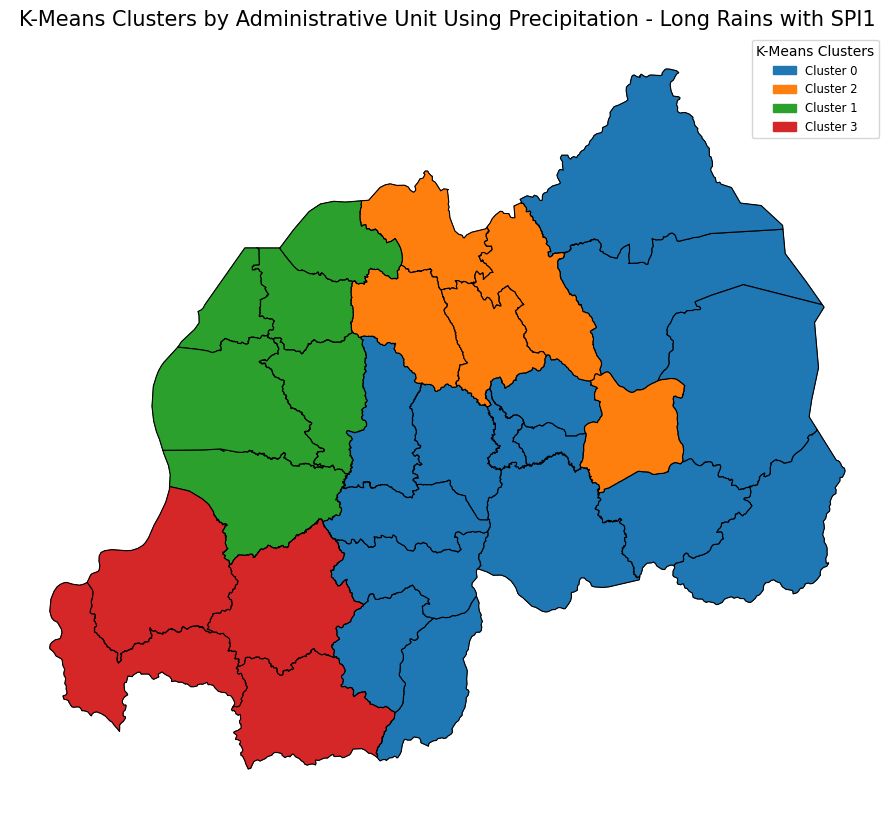

In [403]:
# Visualization of K-Means Clustering Results

# Reattach 'admin2_name' to the PCA-transformed DataFrame
df['admin2_name'] = admin2_names.values

# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all K-Means clusters with a legend
plot_all_geospatial_kmeans_clusters_with_legend("Long Rains with SPI1")

#### Hierarchical Clustering

Ward’s method minimizes variance and helps in identifying clusters of similar rainfall amounts. It provides a dendrogram, which can help determine different levels of clustering.

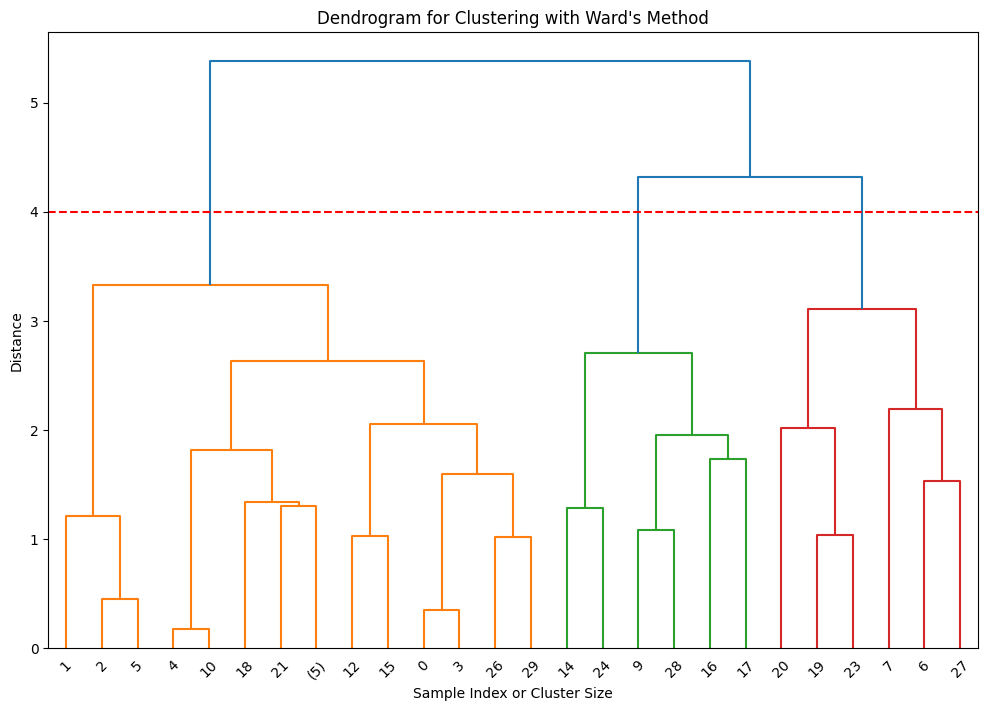

In [404]:
# Perform hierarchical clustering using Ward's method and plot the dendrogram to visualize cluster relationships
linkage_matrix = plot_hierarchical_dendrogram(reduced_features, cut_off=4, title='Dendrogram for Clustering with Ward\'s Method')

In [405]:
# Choose the Optimal Number of Clusters and Assign Labels
n_clusters = 4
hierarchical_labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')

# 4. Add the Hierarchical Cluster Labels to the Original DataFrame

df['hierarchical_cluster'] = hierarchical_labels

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with Hierarchical cluster assignments:")
print(df[['admin2_name', 'hierarchical_cluster']].head())

DataFrame with Hierarchical cluster assignments:
  admin2_name  hierarchical_cluster
0    Bugesera                     2
1      Burera                     1
2     Gakenke                     1
3      Gasabo                     2
4     Gatsibo                     2


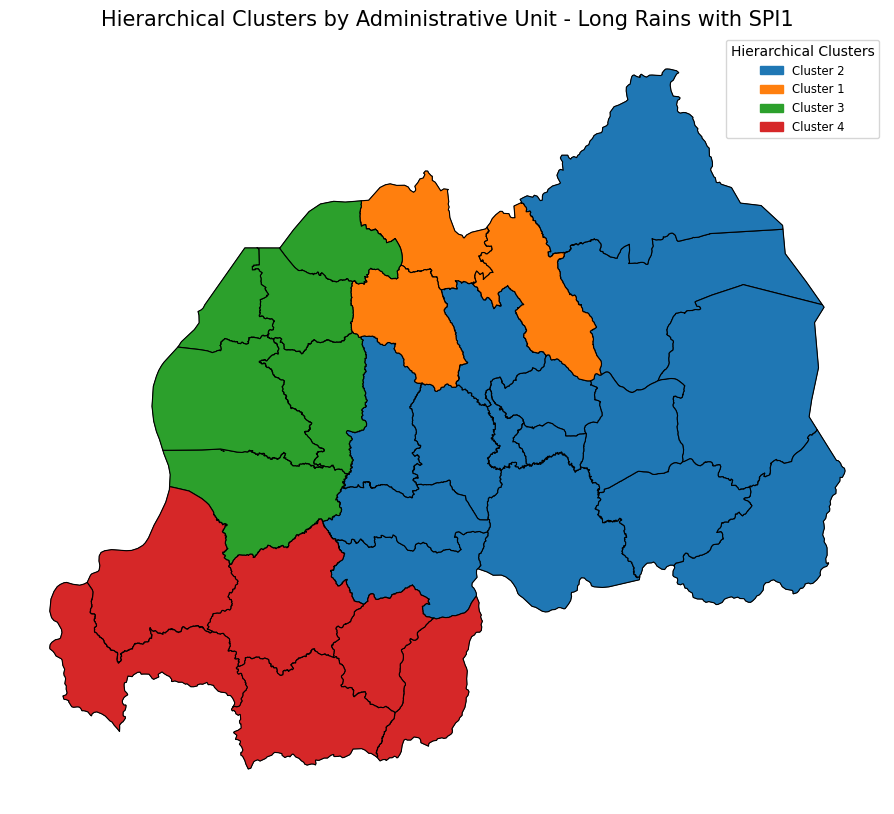

In [406]:
# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all hierarchical clusters with a legend
plot_all_hierarchical_clusters_with_legend("Long Rains with SPI1")

#### DBSCAN Clustering

In [407]:
# Assuming 'df' is your original DataFrame and 'reduced_features' contains the PCA-reduced data
df_with_clusters, best_eps, best_min_samples, best_score = optimize_dbscan(df, reduced_features)

# You can check the optimized results
print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples}, Best Silhouette Score: {best_score}")

No valid clusters were found with the given parameters.
Best eps: None, Best min_samples: None, Best Silhouette Score: None


In [408]:
#print(f'Number of clusters - {len(df["dbscan_cluster"].unique())}')

### Clustering Short Rains with SPI1

In [409]:
# Access the first dataset
df = process_drought_dataset_by_index(datasets=datasets, index=1)

# Check the result
print(df.head())

   admin2_name  Drought Duration  Drought Severity  Drought Intensity  \
27      Gasabo                 1         -2.704704          -2.704704   
28      Gasabo                 1         -2.393072          -2.393072   
29      Gasabo                 1         -1.797248          -1.797248   
30      Gasabo                 1         -2.765349          -2.765349   
31      Gasabo                 1         -1.242117          -1.242117   

   Drought Event_start Drought Event_end  start_year  end_year  
27          2000-09-01        2000-10-01        2000      2000  
28          2002-09-01        2002-10-01        2002      2002  
29          2006-09-01        2006-10-01        2006      2006  
30          2009-09-01        2009-10-01        2009      2009  
31          2014-09-01        2014-10-01        2014      2014  


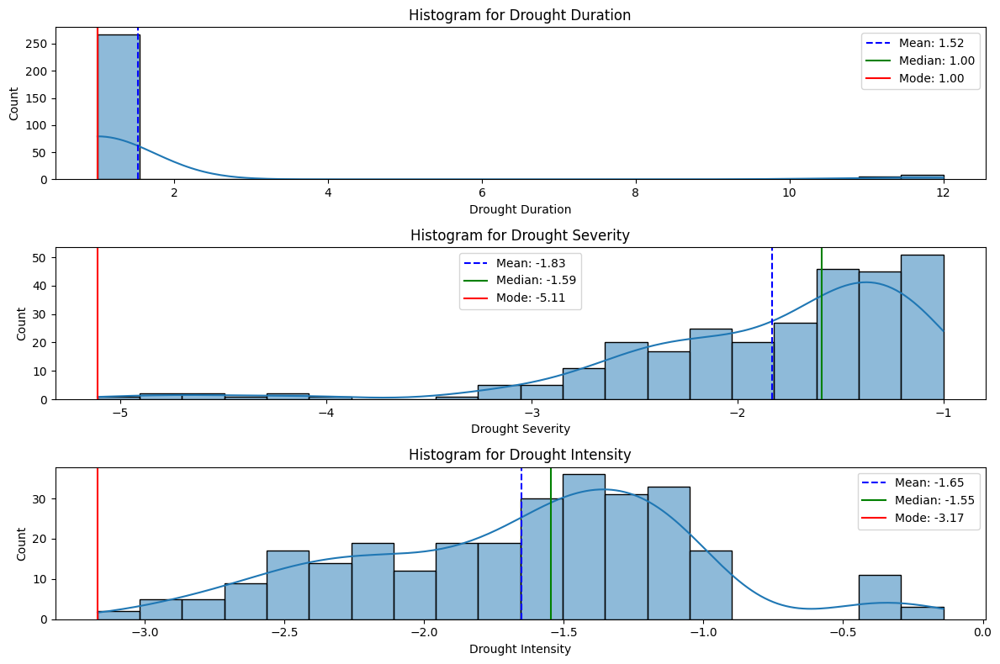

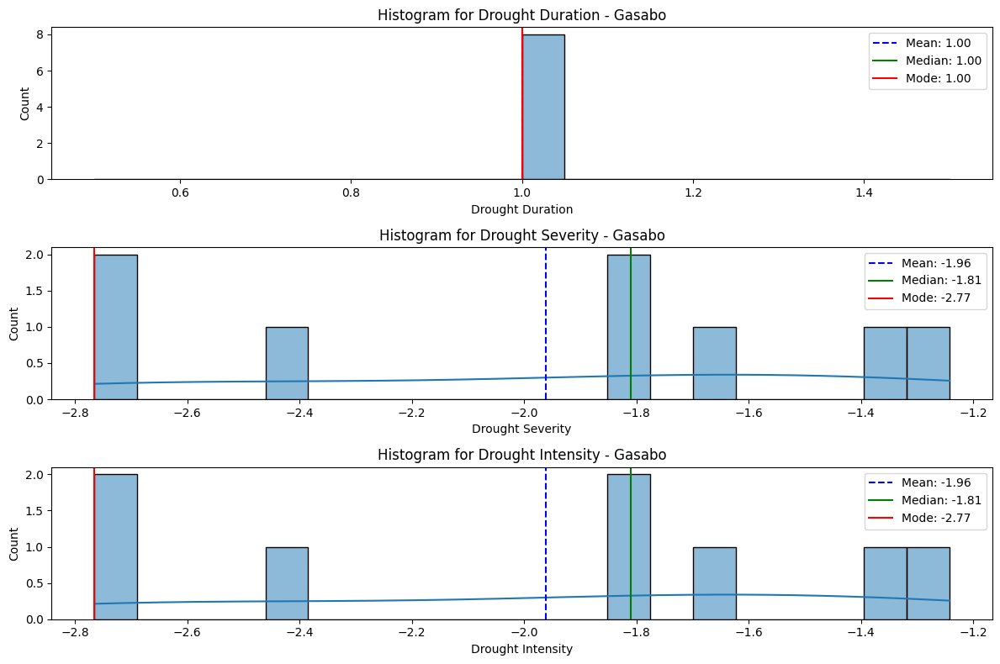

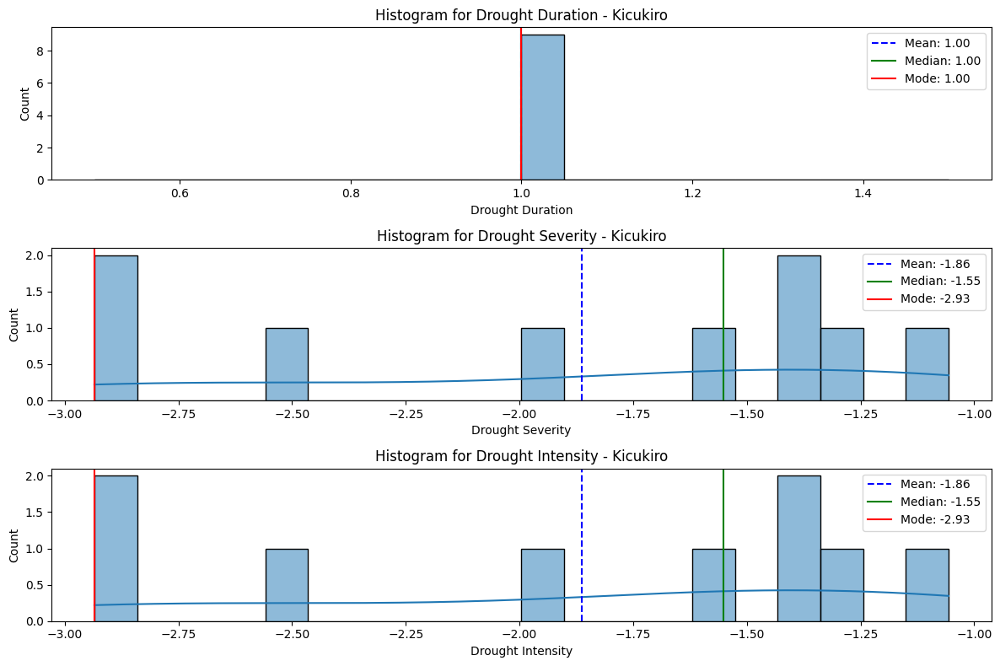

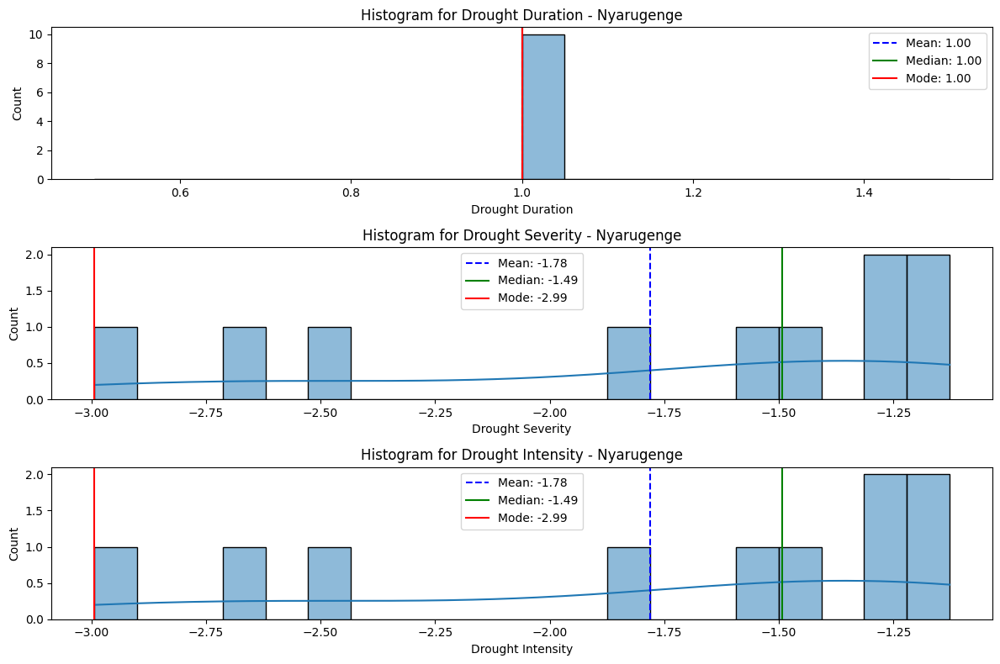

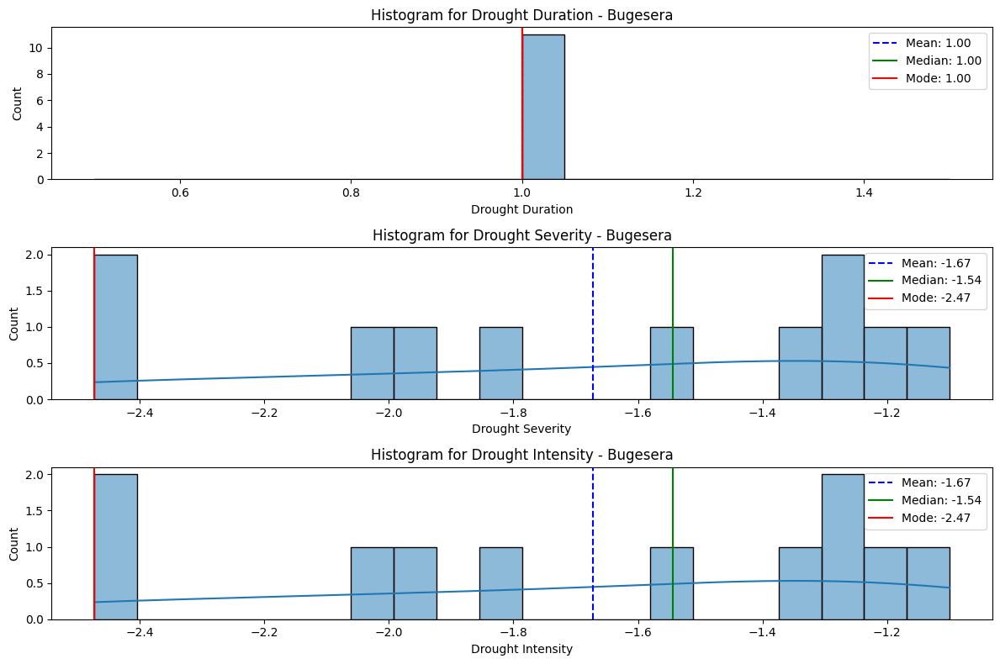

...

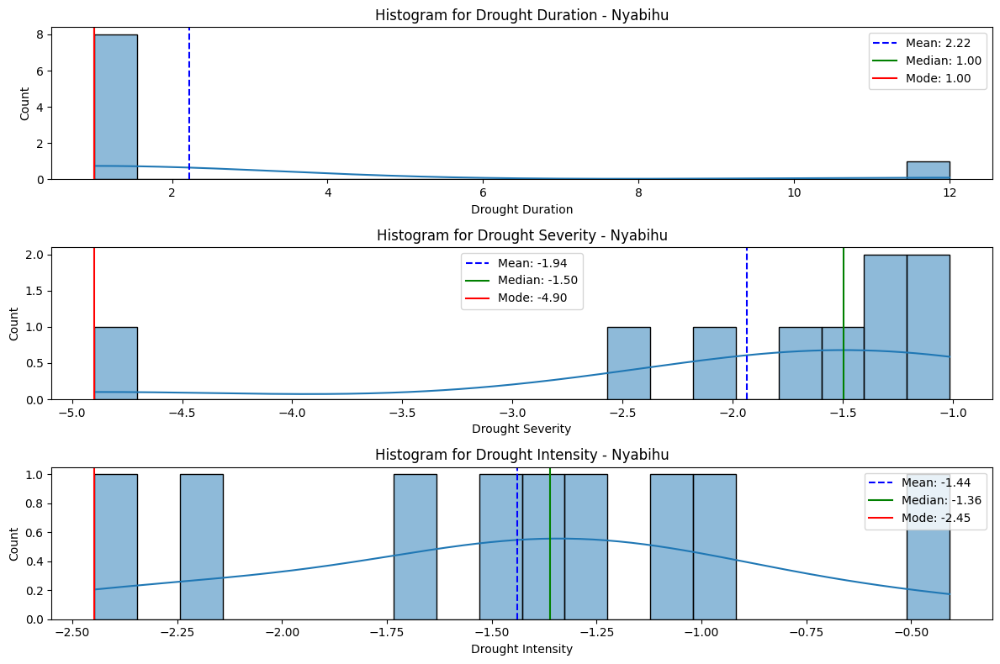

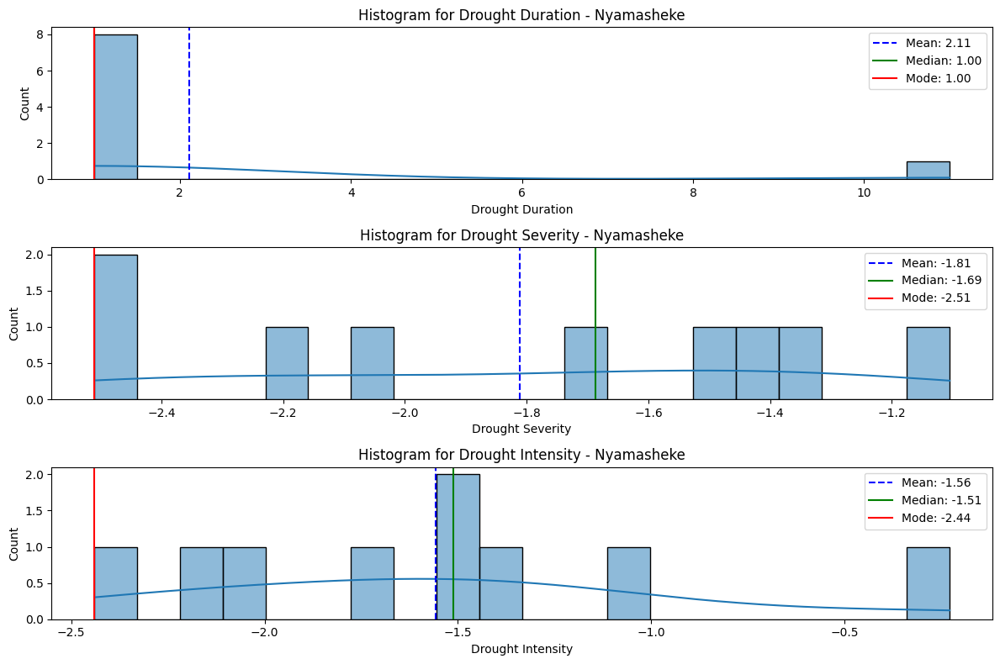

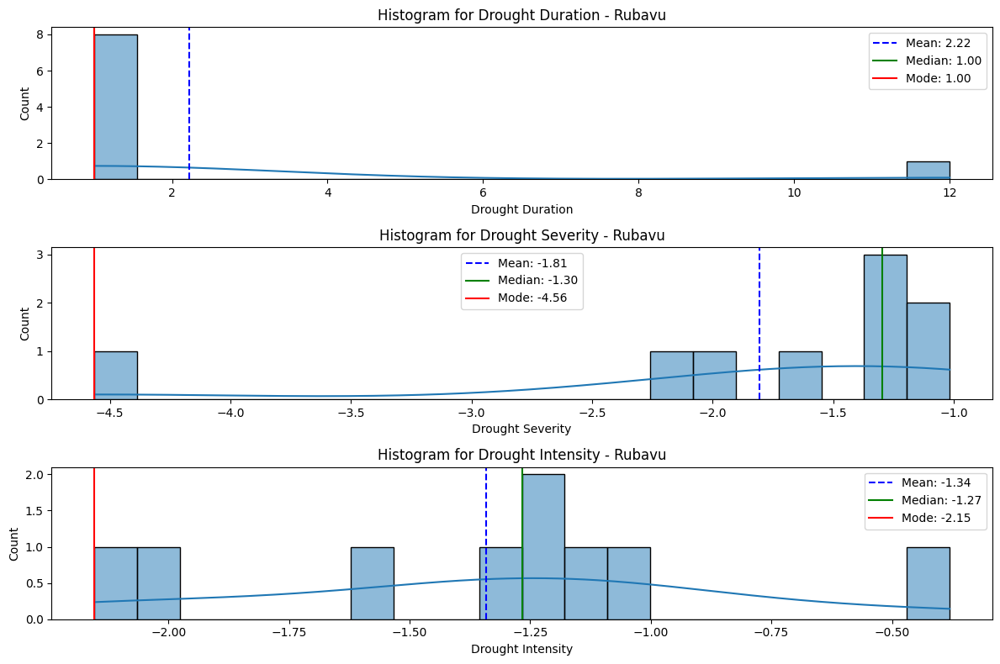

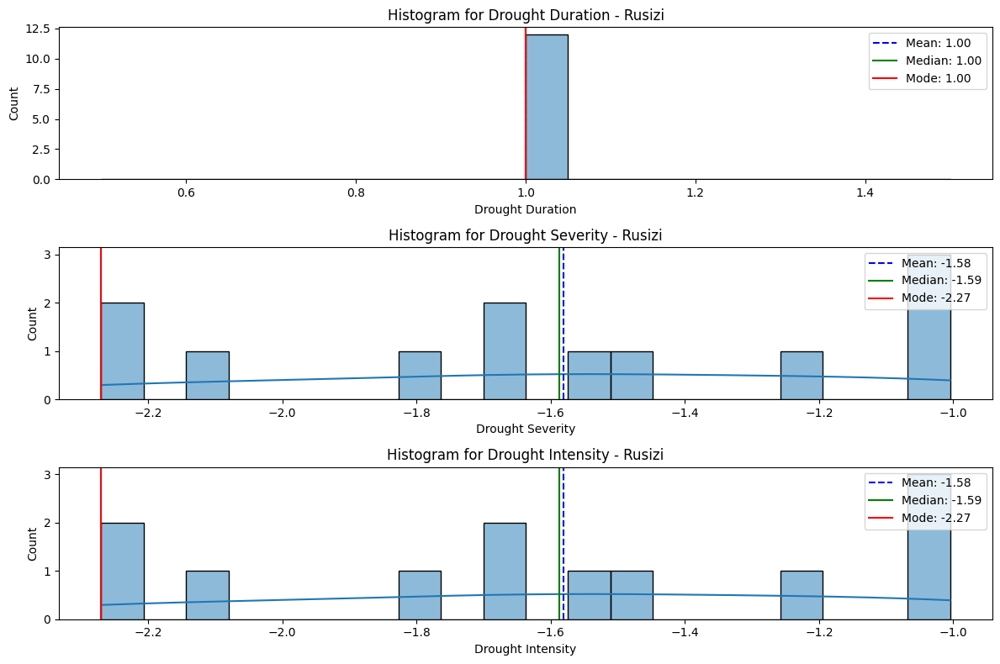

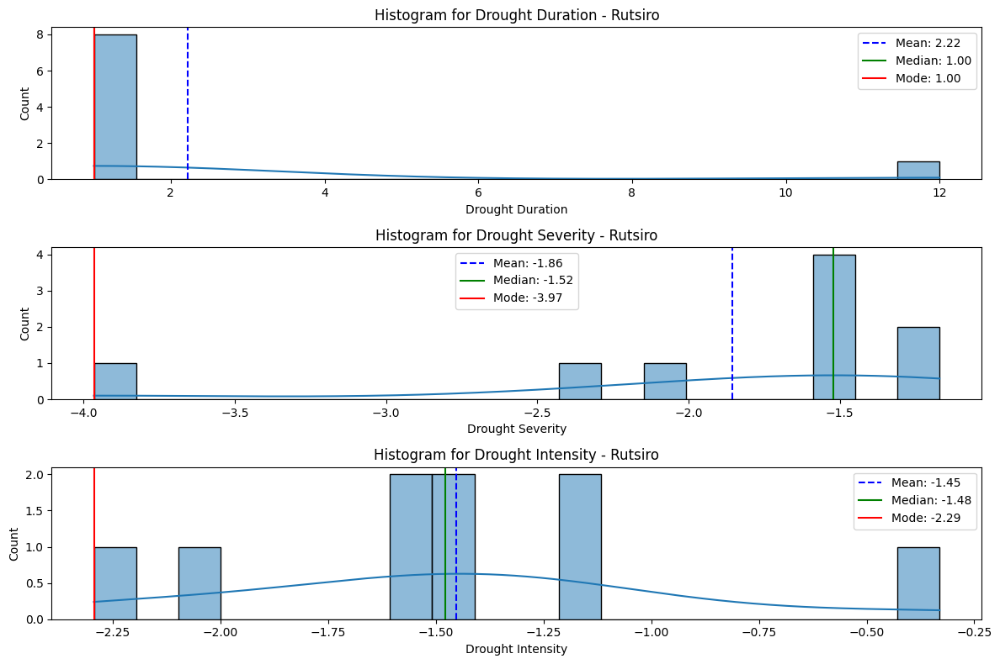

In [410]:
# Plots histograms for Drought Duration, Drought Severity, and Drought Intensity
plot_drought_metrics_histograms_with_stats(df)

In [411]:
# Drought Duration - bimodal distribution
# Drought Severity - left-skewed (negatively skewed) distribution
# Drought Intensity -  fairly normal distribution with a small amount of skewness
df_combined = process_drought_data(df, duration_stat='mode', severity_stat='median', intensity_stat='mean')

# Display the result
print(df_combined.head())

  admin2_name  Drought Duration  Drought Severity  Drought Intensity  2000  \
0    Bugesera               1.0         -1.544550          -1.671875     1   
1      Burera               1.0         -1.861092          -1.685207     1   
2     Gakenke               1.0         -2.206563          -1.837325     1   
3      Gasabo               1.0         -1.809369          -1.961756     1   
4     Gatsibo               1.0         -1.707944          -1.881311     1   

   2001  2002  2003  2004  2005  ...  2014  2015  2016  2017  2018  2019  \
0     0     1     0     0     0  ...     1     1     0     0     1     0   
1     0     1     0     0     1  ...     0     0     0     0     0     0   
2     0     1     0     0     1  ...     0     0     0     0     0     0   
3     0     1     0     0     0  ...     1     0     0     0     1     0   
4     0     1     0     0     0  ...     0     1     0     0     1     0   

   2020  2021  2022  2023  
0     1     0     1     0  
1     0     0     

#### Data Preprocessing

In [412]:
# Normalize the combined dataset
scaler = MinMaxScaler()

# Keep 'admin2_name' aside
admin2_names = df_combined['admin2_name']

# Exclude 'admin2_name' from the features to be scaled
df_combined_for_clustering = df_combined.drop(columns=['admin2_name'])

# Convert column names to strings
df_combined_for_clustering.columns = df_combined_for_clustering.columns.astype(str)

# Apply MinMaxScaler to the remaining features (excluding 'admin2_name')
df = pd.DataFrame(scaler.fit_transform(df_combined_for_clustering),
                         columns=df_combined_for_clustering.columns)

#### Feature Vector Construction

To optimize the number of components (n_components) for Principal Component Analysis (PCA), we need to determine how many components are sufficient to retain the majority of the variance in the data. This can be done by plotting the explained variance ratio and observing when additional components contribute diminishing returns.

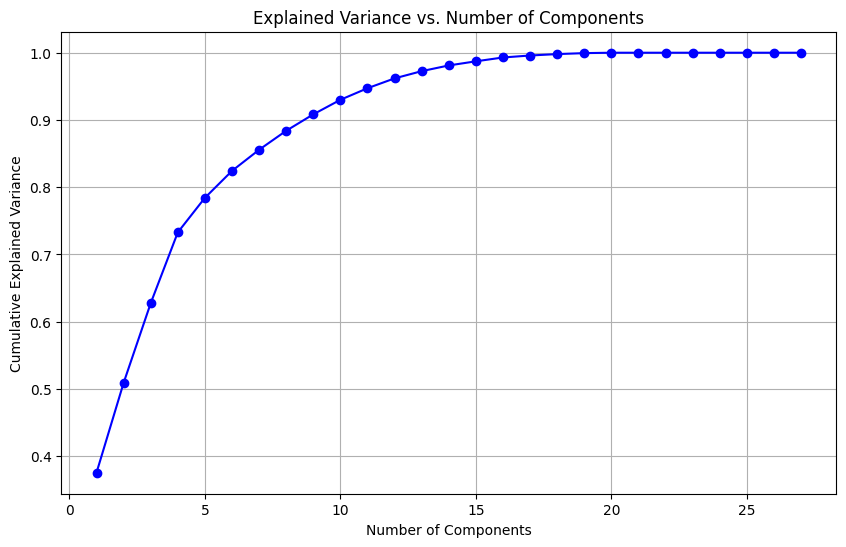

Cumulative explained variance: [0.37538129 0.50894557 0.62746689 0.73281791 0.78419515 0.82425715
 0.85566497 0.88393117 0.90835949 0.92999388 0.94719955 0.96185593
 0.97260043 0.98107863 0.98722235 0.99292312 0.99586054 0.99795642
 0.99941038 1.         1.         1.         1.         1.
 1.         1.         1.        ]


In [413]:
# Apply PCA with a large number of components to see variance explained by each component
# Plot the cumulative explained variance ratio
pca_model, cumulative_variance = plot_pca_variance_explained(df)

# Calculate the cumulative explained variance ratio
print("Cumulative explained variance:", cumulative_variance)

In [414]:
# Choose the optimal number of components based on the plot
optimal_n_components = 11  # This value should be adjusted based on the plot

# Apply PCA with the optimal number of components
pca_optimized = PCA(n_components=optimal_n_components)
reduced_features = pca_optimized.fit_transform(df)

# Print the shape of the reduced feature set
print(f"Reduced Feature Set Shape: {reduced_features.shape}")
print("Explained Variance by Optimal Components:")
print(np.sum(pca_optimized.explained_variance_ratio_))

Reduced Feature Set Shape: (30, 11)
Explained Variance by Optimal Components:
0.9471995507280688


#### K-Means Clustering

The Elbow Method is used to determine the optimal number of clusters (n_clusters) in K-Means clustering. It involves fitting the K-Means algorithm with different values for n_clusters and plotting the Within-Cluster Sum of Squares (WCSS) to observe the point where the WCSS starts to diminish at a reduced rate (forming an "elbow").

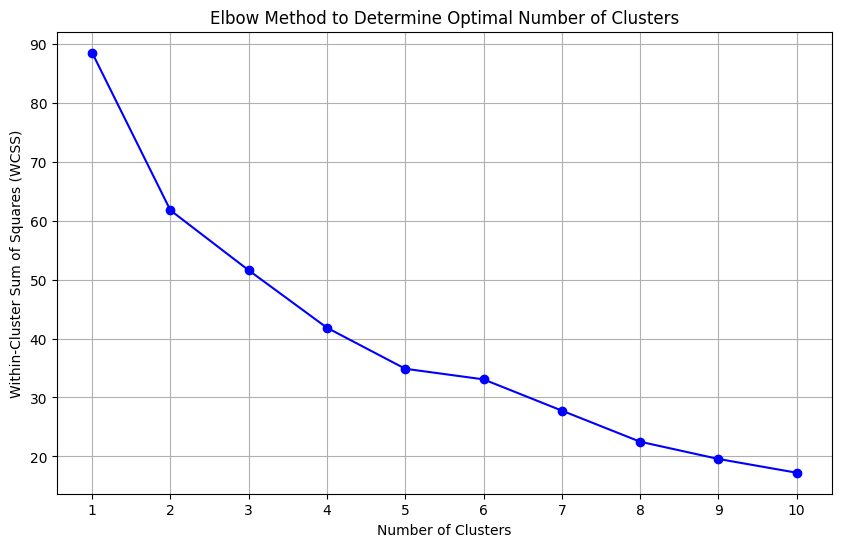

WCSS for each number of clusters: [88.46890152120454, 61.745307741276456, 51.57007950231561, 41.82303525916886, 34.86908602888674, 33.070348223582144, 27.770639661997528, 22.49779098755954, 19.572682397788707, 17.238198715116397]


In [415]:
# Calculate WCSS for different values of n_clusters
wcss = plot_elbow_method(reduced_features, cluster_range=range(1, 11))
print("WCSS for each number of clusters:", wcss)

In [416]:
# Define the number of clusters (determined using the Elbow Method or chosen directly)
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(reduced_features)

# Add the cluster labels to the original DataFrame
df['cluster'] = kmeans.labels_

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with K-Means cluster assignments:")
print(df.head())

DataFrame with K-Means cluster assignments:
   Drought Duration  Drought Severity  Drought Intensity  2000  2001  2002  \
0               0.0          0.735252           0.467014   0.0   0.0   0.0   
1               0.0          0.397627           0.445535   0.0   0.0   0.0   
2               0.0          0.029145           0.200466   0.0   0.0   0.0   
3               0.0          0.452795           0.000000   0.0   0.0   0.0   
4               0.0          0.560976           0.129601   0.0   0.0   0.0   

   2003  2004  2005  2006  ...  2015  2016  2017  2018  2019  2020  2021  \
0   0.0   0.0   0.0   0.0  ...   1.0   0.0   0.0   1.0   0.0   1.0   0.0   
1   0.0   0.0   1.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   1.0   0.0  ...   0.0   0.0   0.0   0.0   0.0   1.0   0.0   
3   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   1.0   0.0   1.0   0.0   
4   0.0   0.0   0.0   0.0  ...   1.0   0.0   0.0   1.0   0.0   1.0   0.0   

   2022  2023  cluster  
0   1

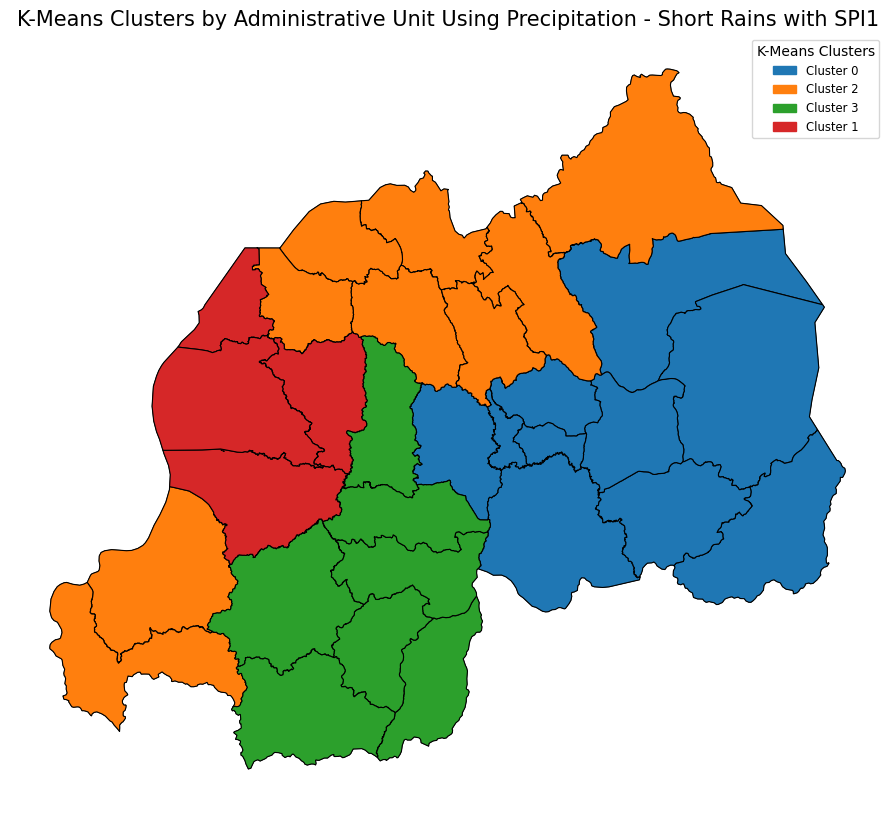

In [417]:
# Visualization of K-Means Clustering Results

# Reattach 'admin2_name' to the PCA-transformed DataFrame
df['admin2_name'] = admin2_names.values

# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all K-Means clusters with a legend
plot_all_geospatial_kmeans_clusters_with_legend("Short Rains with SPI1")

#### Hierarchical Clustering

Ward’s method minimizes variance and helps in identifying clusters of similar rainfall amounts. It provides a dendrogram, which can help determine different levels of clustering.

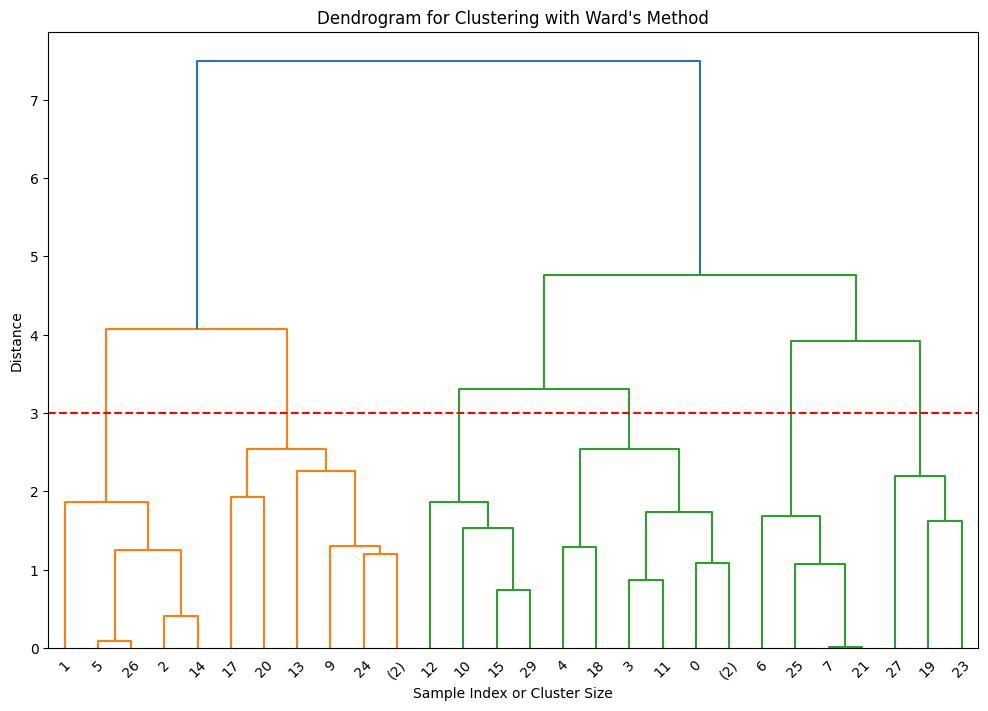

In [418]:
# Perform hierarchical clustering using Ward's method and plot the dendrogram to visualize cluster relationships
linkage_matrix = plot_hierarchical_dendrogram(reduced_features, cut_off=3, title='Dendrogram for Clustering with Ward\'s Method')

In [419]:
# Choose the Optimal Number of Clusters and Assign Labels
n_clusters = 4
hierarchical_labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')

# 4. Add the Hierarchical Cluster Labels to the Original DataFrame

df['hierarchical_cluster'] = hierarchical_labels

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with Hierarchical cluster assignments:")
print(df[['admin2_name', 'hierarchical_cluster']].head())

DataFrame with Hierarchical cluster assignments:
  admin2_name  hierarchical_cluster
0    Bugesera                     3
1      Burera                     1
2     Gakenke                     1
3      Gasabo                     3
4     Gatsibo                     3


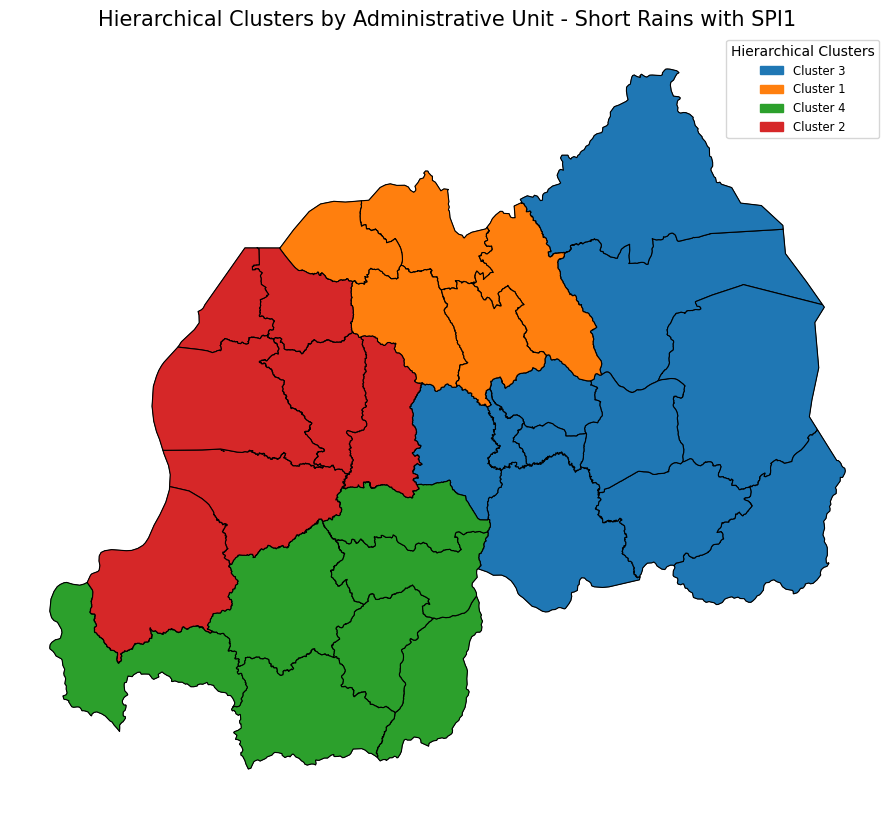

In [420]:
# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all hierarchical clusters with a legend
plot_all_hierarchical_clusters_with_legend("Short Rains with SPI1")

#### DBSCAN Clustering

In [421]:
# Assuming 'df' is your original DataFrame and 'reduced_features' contains the PCA-reduced data
df_with_clusters, best_eps, best_min_samples, best_score = optimize_dbscan(df, reduced_features)

# You can check the optimized results
print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples}, Best Silhouette Score: {best_score}")

No valid clusters were found with the given parameters.
Best eps: None, Best min_samples: None, Best Silhouette Score: None


In [422]:
#print(f'Number of clusters - {len(df["dbscan_cluster"].unique())}')

### Clustering Long Rains with SPI3

In [423]:
# Access the first dataset
df = process_drought_dataset_by_index(datasets=datasets, index=2)

# Check the result
print(df.head())

   admin2_name  Drought Duration  Drought Severity  Drought Intensity  \
16      Gasabo                11         -4.807904          -0.437082   
17      Gasabo                 0         -1.680088           0.000000   
18      Gasabo                 1         -1.024796          -1.024796   
19      Gasabo                 1         -1.118069          -1.118069   
20      Gasabo                 1         -2.244443          -2.244443   

   Drought Event_start Drought Event_end  start_year  end_year  
16          2000-04-01        2001-03-01        2000      2001  
17          2002-02-01        2002-03-01        2002      2002  
18          2005-03-01        2005-04-01        2005      2005  
19          2012-03-01        2012-04-01        2012      2012  
20          2014-02-01        2014-04-01        2014      2014  


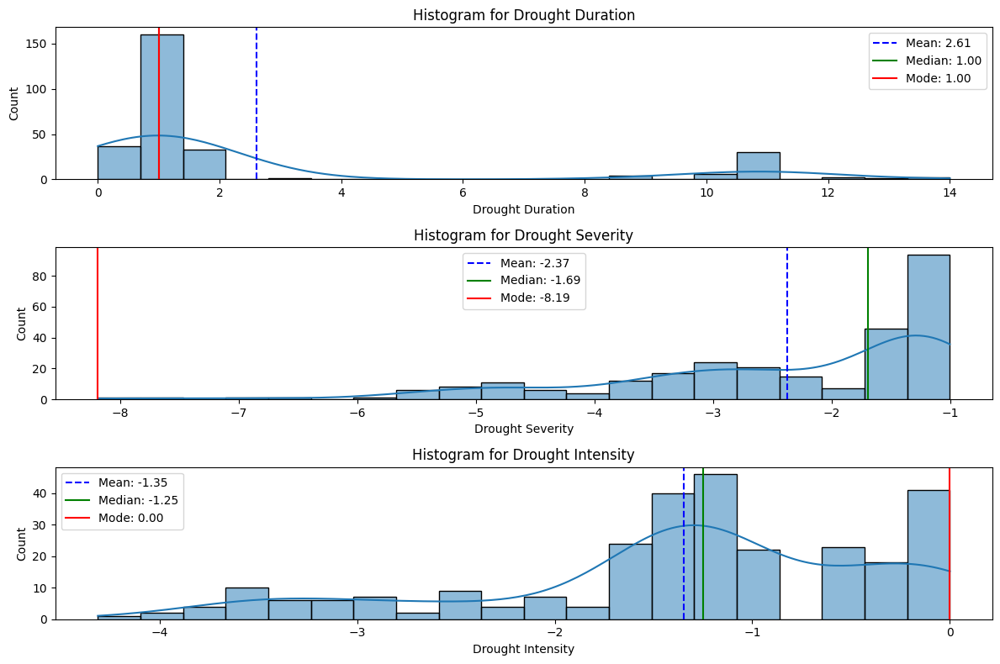

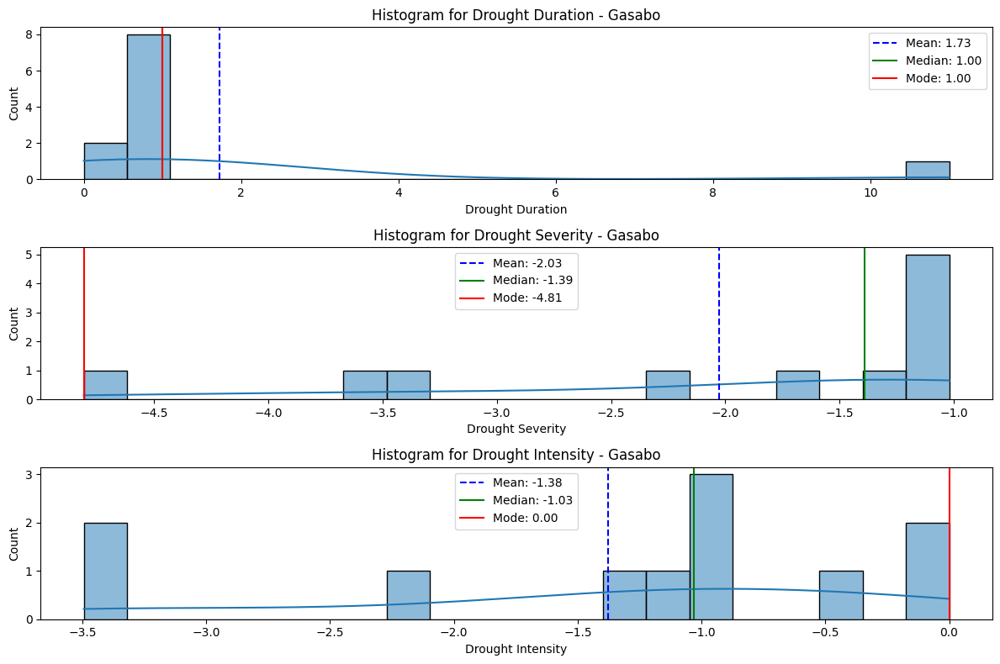

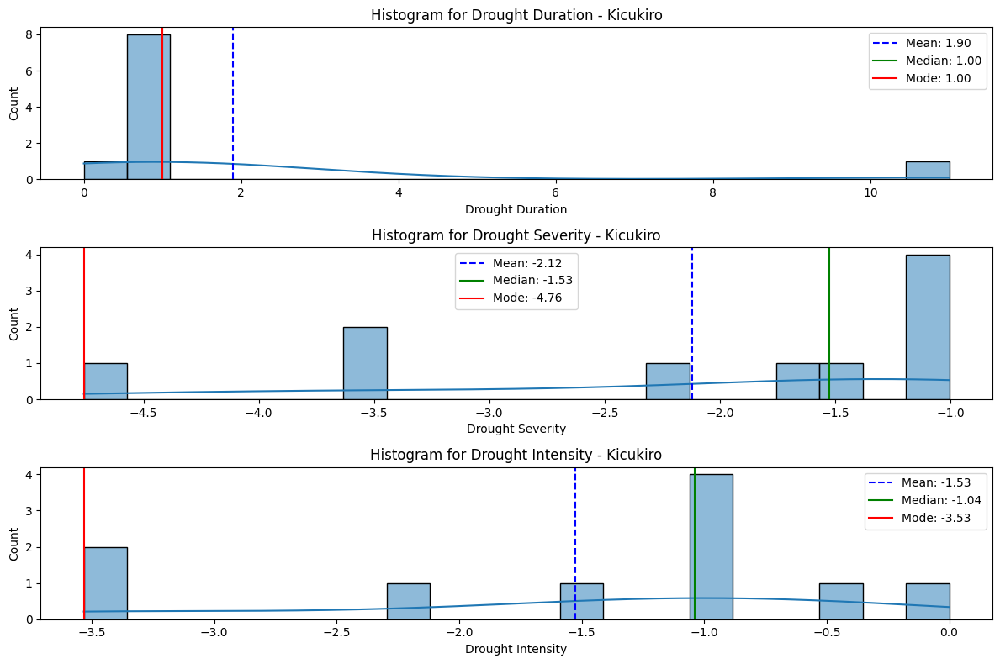

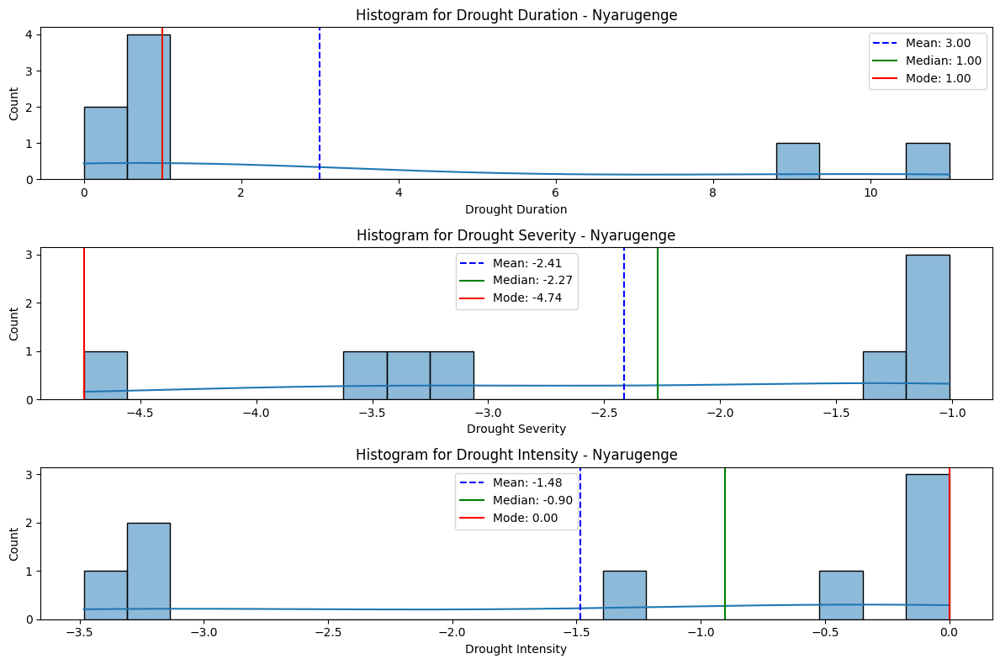

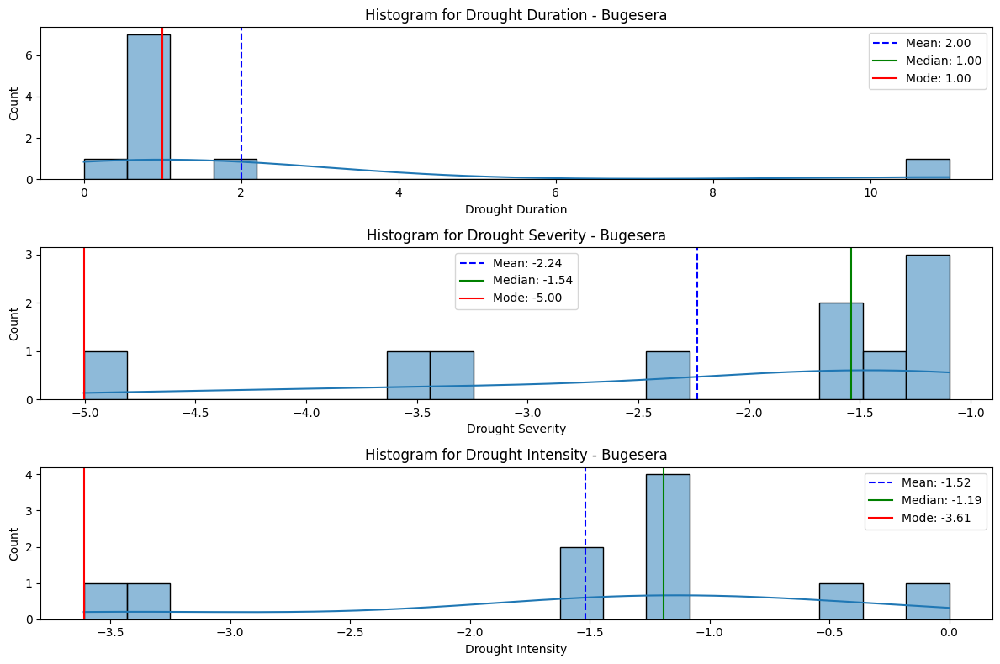

...

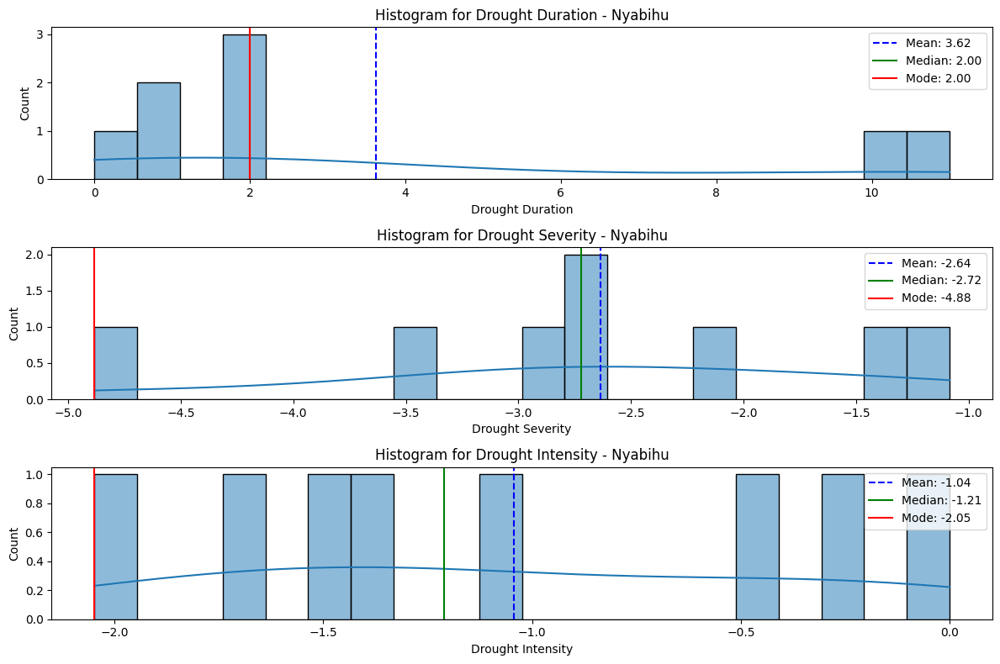

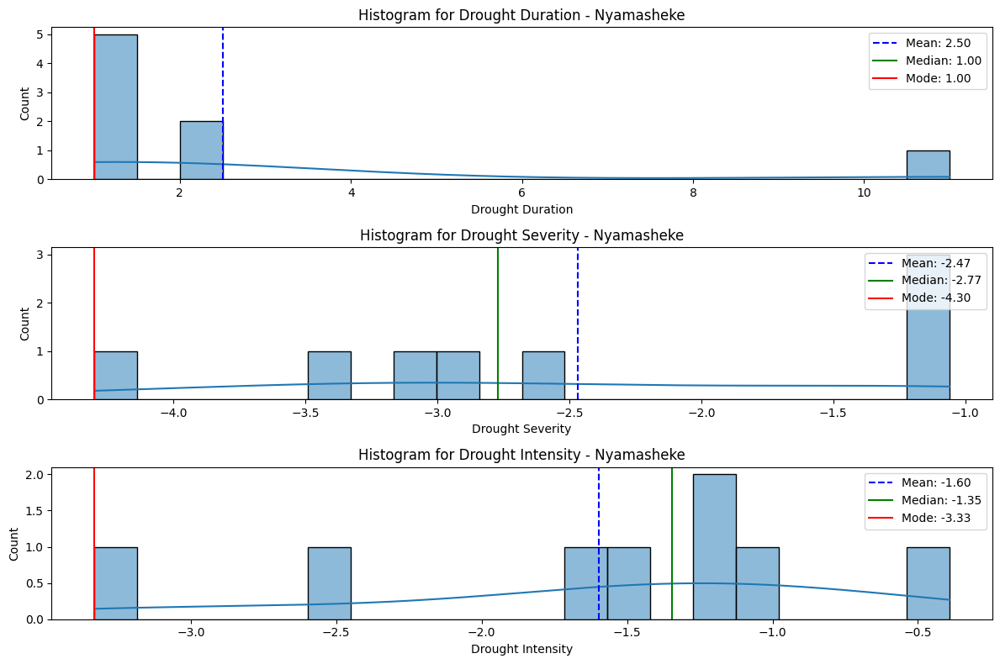

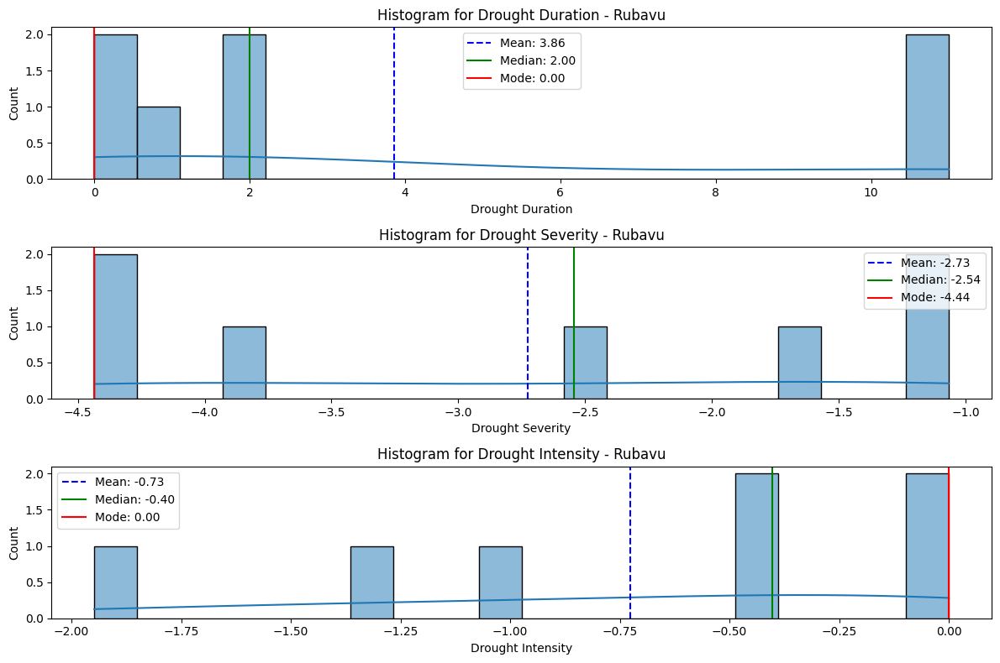

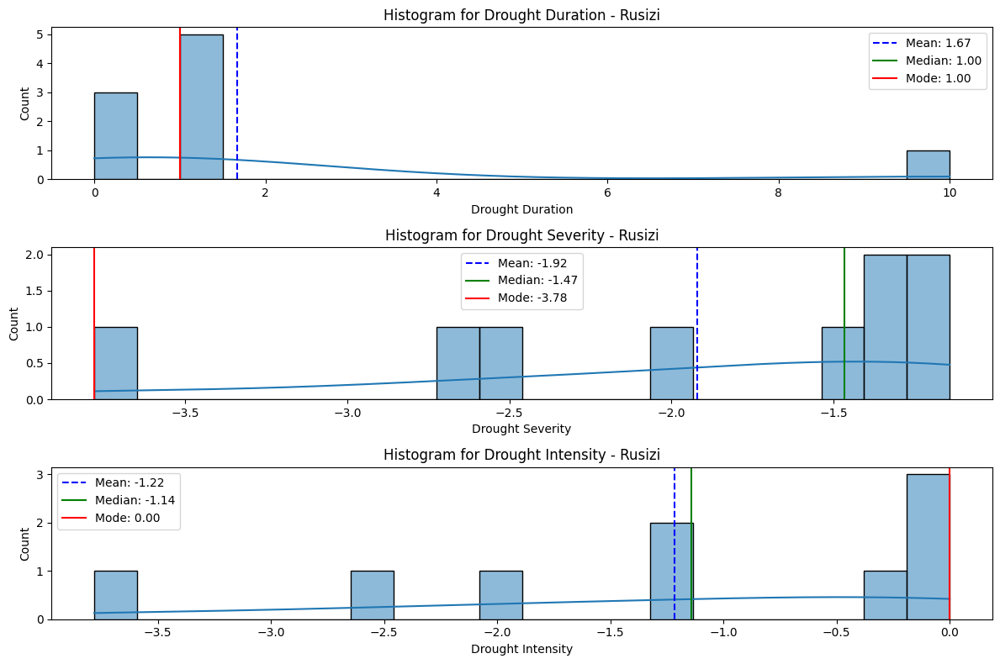

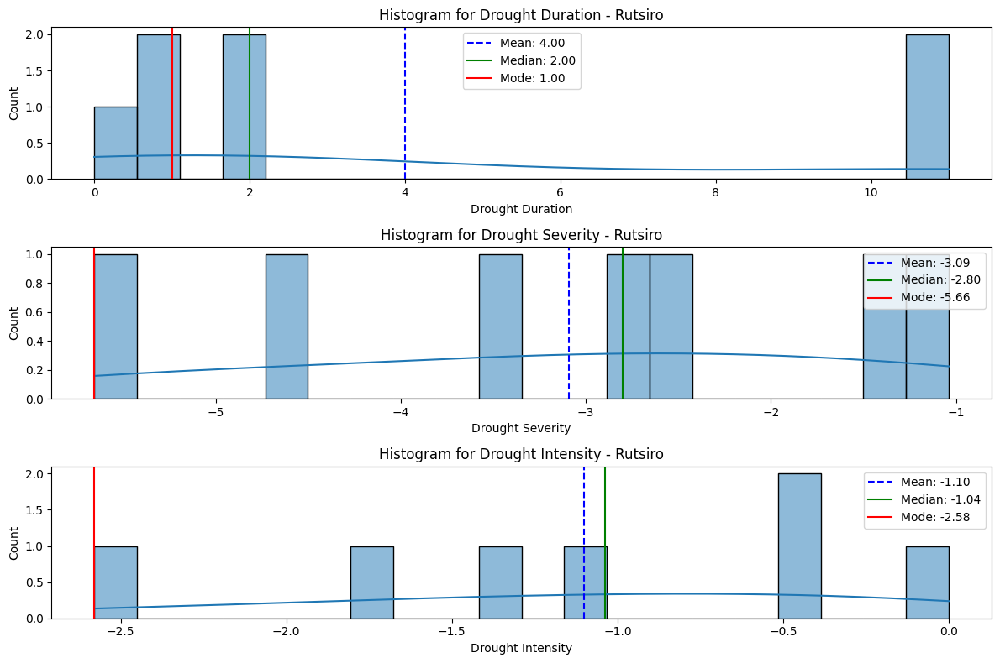

In [424]:
# Plots histograms for Drought Duration, Drought Severity, and Drought Intensity
plot_drought_metrics_histograms_with_stats(df)

In [425]:
# Drought Duration - right-skewed distribution
# Drought Severity - left-skewed (negatively skewed) distribution
# Drought Intensity -  somewhat bimodal, with peaks
df_combined = process_drought_data(df, duration_stat='median', severity_stat='median', intensity_stat='mean')

# Display the result
print(df_combined.head())

  admin2_name  Drought Duration  Drought Severity  Drought Intensity  2000  \
0    Bugesera               1.0         -1.539157          -1.518249     1   
1      Burera               1.0         -1.651055          -1.198084     1   
2     Gakenke               1.0         -1.567789          -1.374436     1   
3      Gasabo               1.0         -1.389776          -1.376601     1   
4     Gatsibo               1.0         -1.713879          -1.839386     1   

   2001  2002  2003  2004  2005  ...  2014  2015  2016  2017  2018  2019  \
0     1     1     1     0     1  ...     0     1     0     1     0     1   
1     1     1     0     0     1  ...     0     1     1     1     1     1   
2     1     1     0     0     1  ...     0     1     1     1     0     1   
3     1     1     0     0     1  ...     1     1     0     1     1     1   
4     1     1     1     0     0  ...     0     1     1     1     0     0   

   2020  2021  2022  2023  
0     0     1     0     1  
1     0     1     

#### Data Preprocessing

In [426]:
# Normalize the combined dataset
scaler = MinMaxScaler()

# Keep 'admin2_name' aside
admin2_names = df_combined['admin2_name']

# Exclude 'admin2_name' from the features to be scaled
df_combined_for_clustering = df_combined.drop(columns=['admin2_name'])

# Convert column names to strings
df_combined_for_clustering.columns = df_combined_for_clustering.columns.astype(str)

# Apply MinMaxScaler to the remaining features (excluding 'admin2_name')
df = pd.DataFrame(scaler.fit_transform(df_combined_for_clustering),
                         columns=df_combined_for_clustering.columns)

#### Feature Vector Construction

To optimize the number of components (n_components) for Principal Component Analysis (PCA), we need to determine how many components are sufficient to retain the majority of the variance in the data. This can be done by plotting the explained variance ratio and observing when additional components contribute diminishing returns.

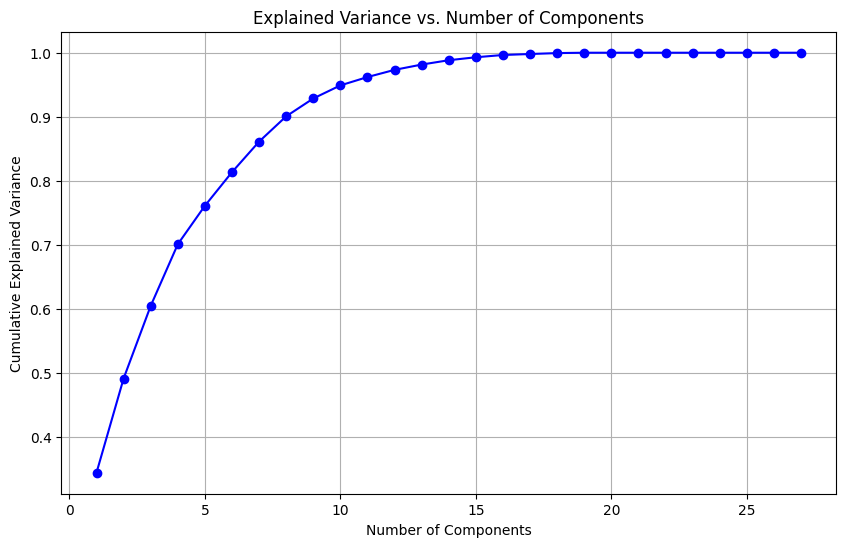

Cumulative explained variance: [0.3440854  0.49121121 0.60465437 0.70090447 0.76099479 0.81347587
 0.86119911 0.90067744 0.92856317 0.94897355 0.9620172  0.97323941
 0.98151197 0.98828806 0.99292735 0.99643331 0.99798647 0.99943376
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]


In [427]:
# Apply PCA with a large number of components to see variance explained by each component
# Plot the cumulative explained variance ratio
pca_model, cumulative_variance = plot_pca_variance_explained(df)

# Calculate the cumulative explained variance ratio
print("Cumulative explained variance:", cumulative_variance)

In [428]:
# Choose the optimal number of components based on the plot
optimal_n_components = 20  # This value should be adjusted based on the plot

# Apply PCA with the optimal number of components
pca_optimized = PCA(n_components=optimal_n_components)
reduced_features = pca_optimized.fit_transform(df)

# Print the shape of the reduced feature set
print(f"Reduced Feature Set Shape: {reduced_features.shape}")
print("Explained Variance by Optimal Components:")
print(np.sum(pca_optimized.explained_variance_ratio_))

Reduced Feature Set Shape: (30, 20)
Explained Variance by Optimal Components:
0.9999999999999999


#### K-Means Clustering

The Elbow Method is used to determine the optimal number of clusters (n_clusters) in K-Means clustering. It involves fitting the K-Means algorithm with different values for n_clusters and plotting the Within-Cluster Sum of Squares (WCSS) to observe the point where the WCSS starts to diminish at a reduced rate (forming an "elbow").

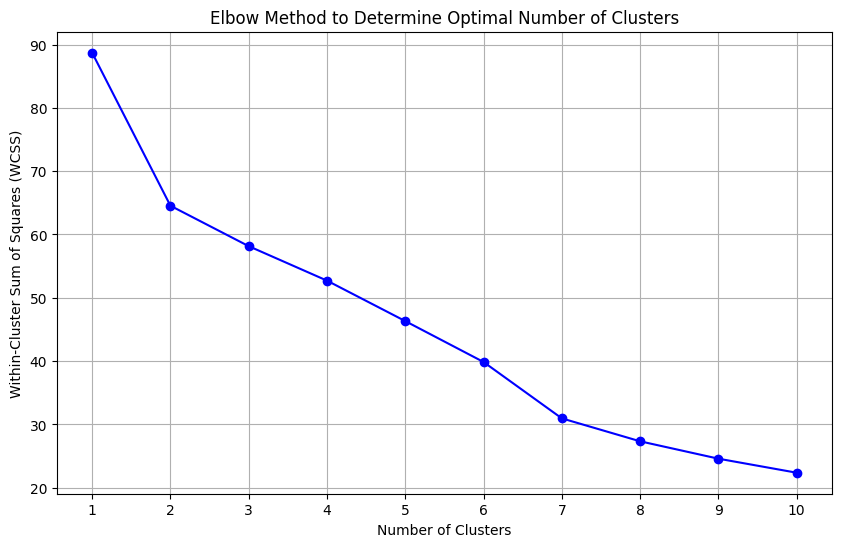

WCSS for each number of clusters: [88.70178473135799, 64.54199452402514, 58.156200312194294, 52.71478153877569, 46.325376694881975, 39.86673834284068, 30.964608085886187, 27.34355111972287, 24.59883228902066, 22.382063384816185]


In [429]:
# Calculate WCSS for different values of n_clusters
wcss = plot_elbow_method(reduced_features, cluster_range=range(1, 11))
print("WCSS for each number of clusters:", wcss)

In [430]:
# Define the number of clusters (determined using the Elbow Method or chosen directly)
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(reduced_features)

# Add the cluster labels to the original DataFrame
df['cluster'] = kmeans.labels_

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with K-Means cluster assignments:")
print(df.head())

DataFrame with K-Means cluster assignments:
   Drought Duration  Drought Severity  Drought Intensity  2000  2001  2002  \
0               0.0          0.896347           0.288566   1.0   0.0   1.0   
1               0.0          0.824586           0.576259   1.0   0.0   1.0   
2               0.0          0.877985           0.417793   1.0   0.0   1.0   
3               0.0          0.992145           0.415848   1.0   0.0   1.0   
4               0.0          0.784297           0.000000   1.0   0.0   1.0   

   2003  2004  2005  2006  ...  2015  2016  2017  2018  2019  2020  2021  \
0   1.0   0.0   1.0   0.0  ...   0.0   0.0   1.0   0.0   1.0   0.0   1.0   
1   0.0   0.0   1.0   0.0  ...   0.0   1.0   1.0   1.0   1.0   0.0   1.0   
2   0.0   0.0   1.0   0.0  ...   0.0   1.0   1.0   0.0   1.0   0.0   1.0   
3   0.0   0.0   1.0   0.0  ...   0.0   0.0   1.0   1.0   1.0   0.0   1.0   
4   1.0   0.0   0.0   0.0  ...   0.0   1.0   1.0   0.0   0.0   0.0   1.0   

   2022  2023  cluster  
0   0

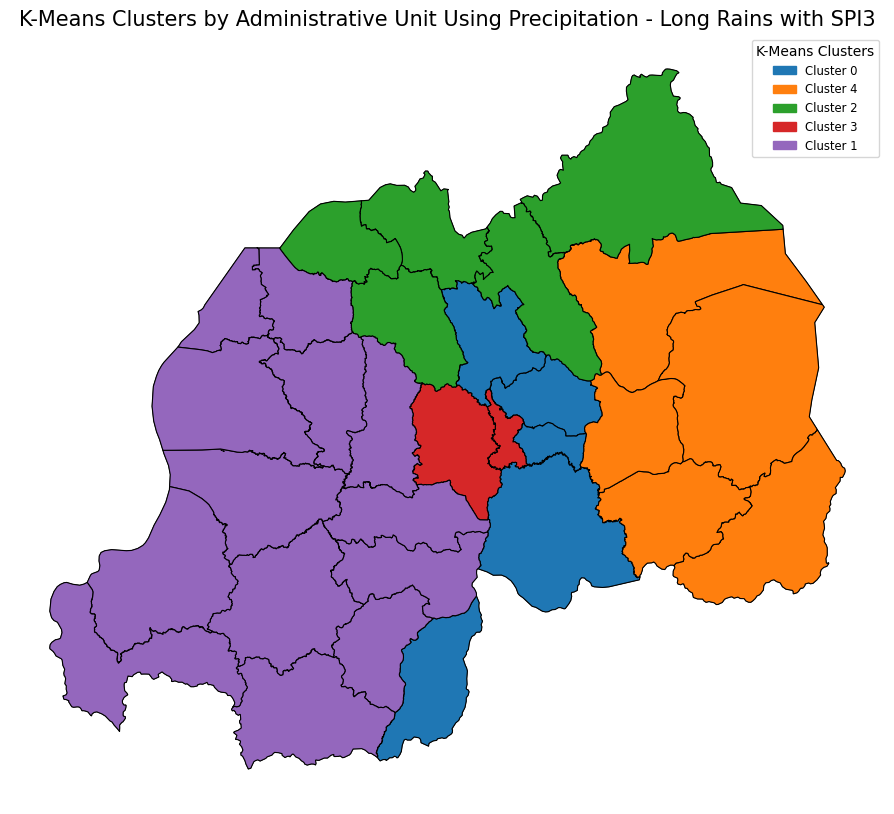

In [431]:
# Visualization of K-Means Clustering Results

# Reattach 'admin2_name' to the PCA-transformed DataFrame
df['admin2_name'] = admin2_names.values

# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all K-Means clusters with a legend
plot_all_geospatial_kmeans_clusters_with_legend("Long Rains with SPI3")

#### Hierarchical Clustering

Ward’s method minimizes variance and helps in identifying clusters of similar rainfall amounts. It provides a dendrogram, which can help determine different levels of clustering.

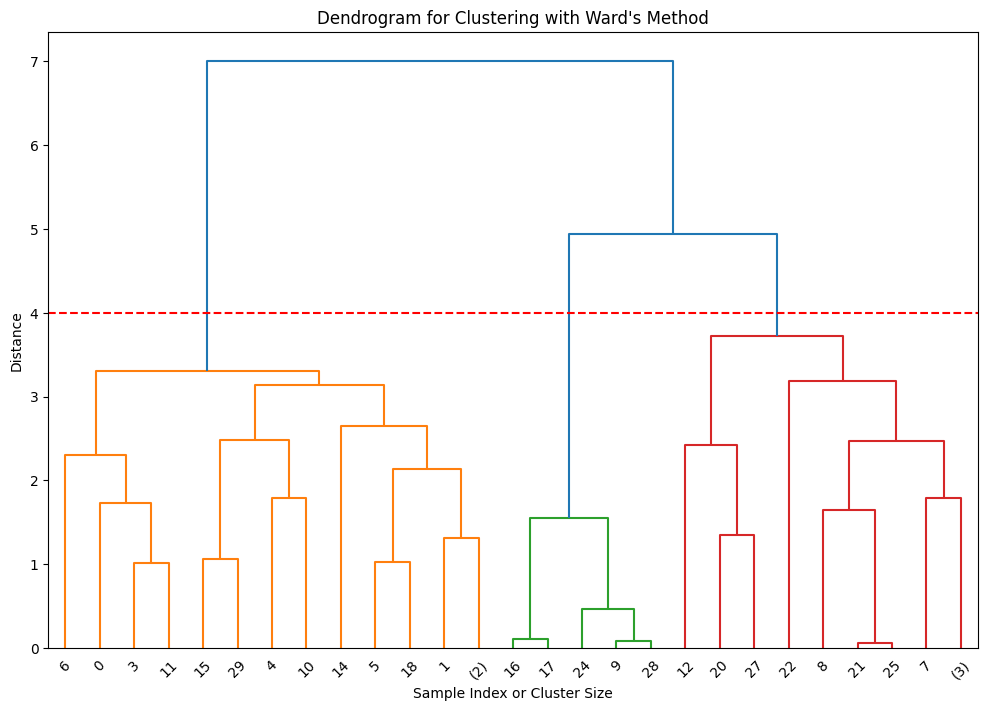

In [432]:
# Perform hierarchical clustering using Ward's method and plot the dendrogram to visualize cluster relationships
linkage_matrix = plot_hierarchical_dendrogram(reduced_features, cut_off=4, title='Dendrogram for Clustering with Ward\'s Method')

In [433]:
# Choose the Optimal Number of Clusters and Assign Labels

n_clusters = 5
hierarchical_labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')

# 4. Add the Hierarchical Cluster Labels to the Original DataFrame

df['hierarchical_cluster'] = hierarchical_labels

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with Hierarchical cluster assignments:")
print(df[['admin2_name', 'hierarchical_cluster']].head())

DataFrame with Hierarchical cluster assignments:
  admin2_name  hierarchical_cluster
0    Bugesera                     1
1      Burera                     2
2     Gakenke                     2
3      Gasabo                     1
4     Gatsibo                     2


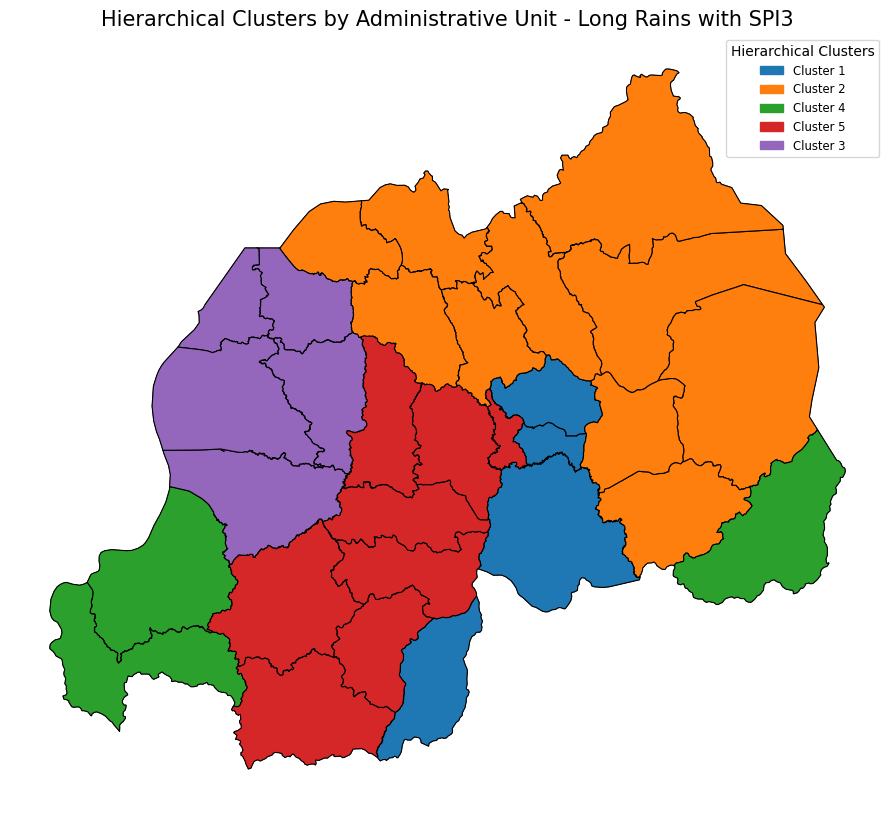

In [434]:
# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all hierarchical clusters with a legend
plot_all_hierarchical_clusters_with_legend("Long Rains with SPI3")

#### DBSCAN Clustering

In [435]:
# Assuming 'df' is your original DataFrame and 'reduced_features' contains the PCA-reduced data
df_with_clusters, best_eps, best_min_samples, best_score = optimize_dbscan(df, reduced_features)

# You can check the optimized results
print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples}, Best Silhouette Score: {best_score}")

No valid clusters were found with the given parameters.
Best eps: None, Best min_samples: None, Best Silhouette Score: None


In [436]:
#print(f'Number of clusters - {len(df["dbscan_cluster"].unique())}')

### Clustering Short Rains with SPI3

In [437]:
# Access the first dataset
df = process_drought_dataset_by_index(datasets=datasets, index=3)

# Check the result
print(df.head())

   admin2_name  Drought Duration  Drought Severity  Drought Intensity  \
35      Gasabo                10         -1.531287          -0.153129   
36      Gasabo                 1         -2.379611          -2.379611   
37      Gasabo                22         -5.693983          -0.258817   
38      Gasabo                11         -2.540814          -0.230983   
39      Gasabo                11         -2.723469          -0.247588   

   Drought Event_start Drought Event_end  start_year  end_year  
35          2002-11-01        2003-09-01        2002      2003  
36          2006-10-01        2006-11-01        2006      2006  
37          2008-11-01        2010-09-01        2008      2010  
38          2018-10-01        2019-09-01        2018      2019  
39          2022-10-01        2023-09-01        2022      2023  


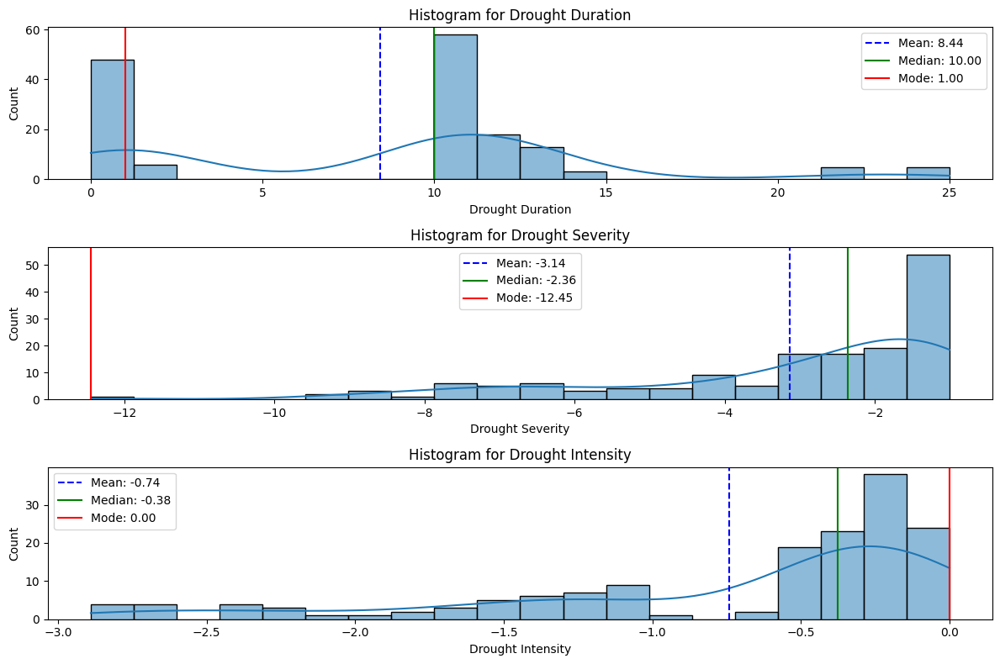

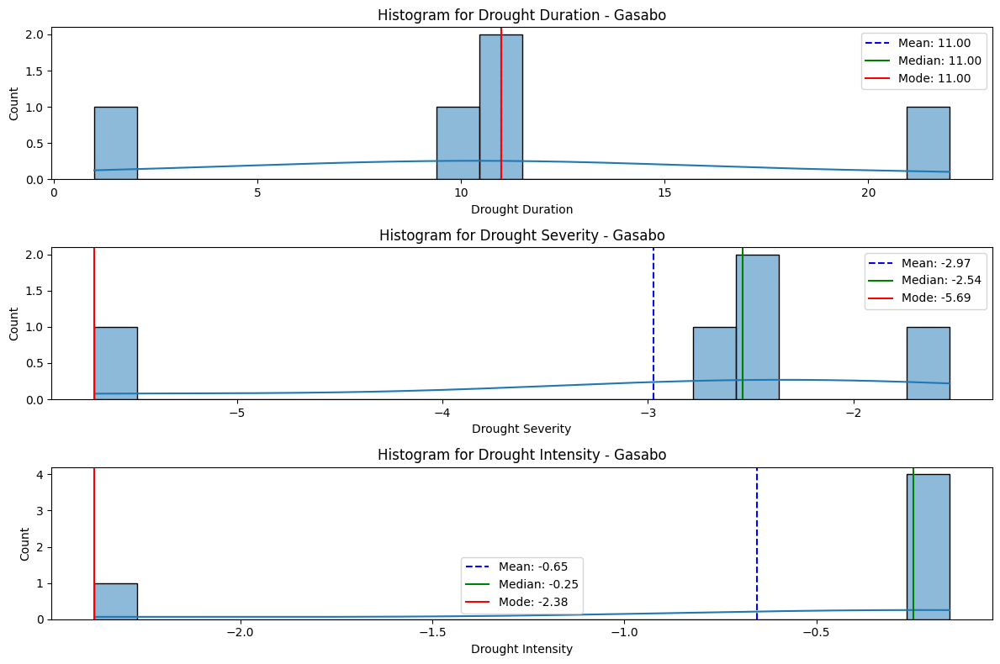

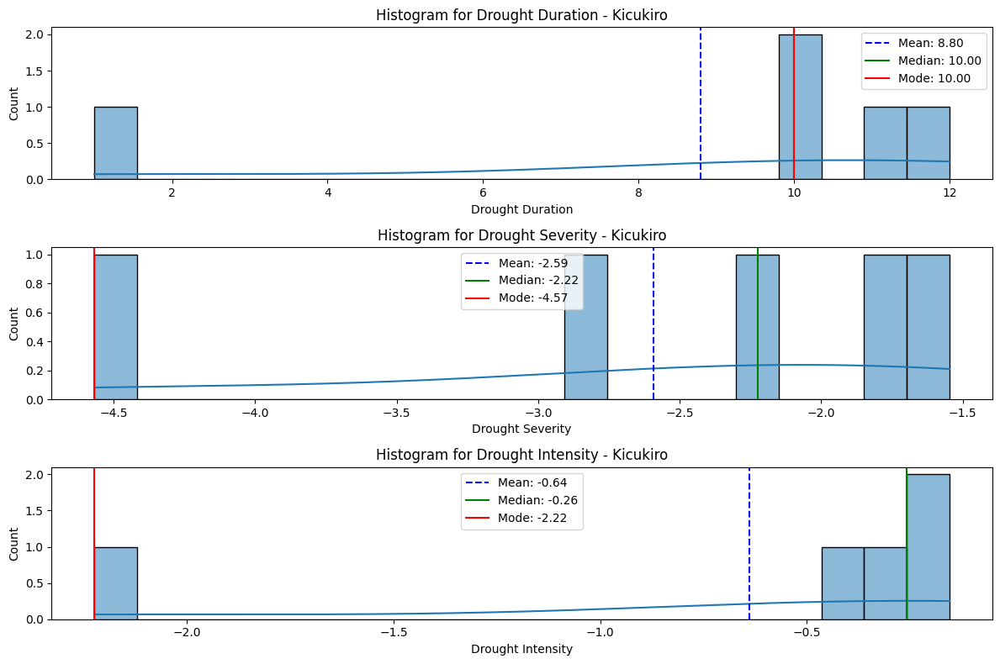

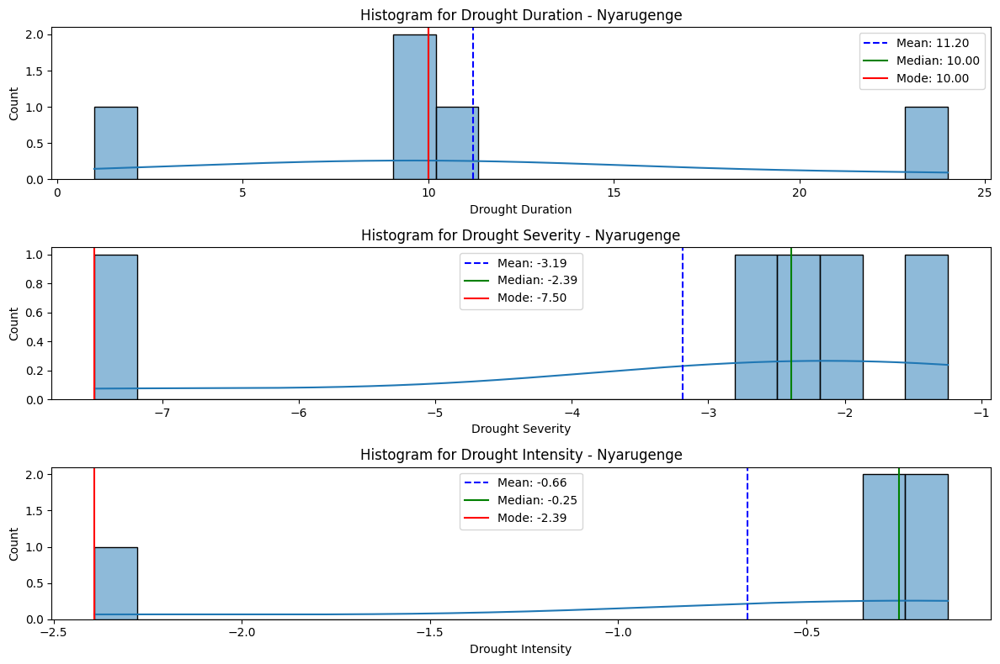

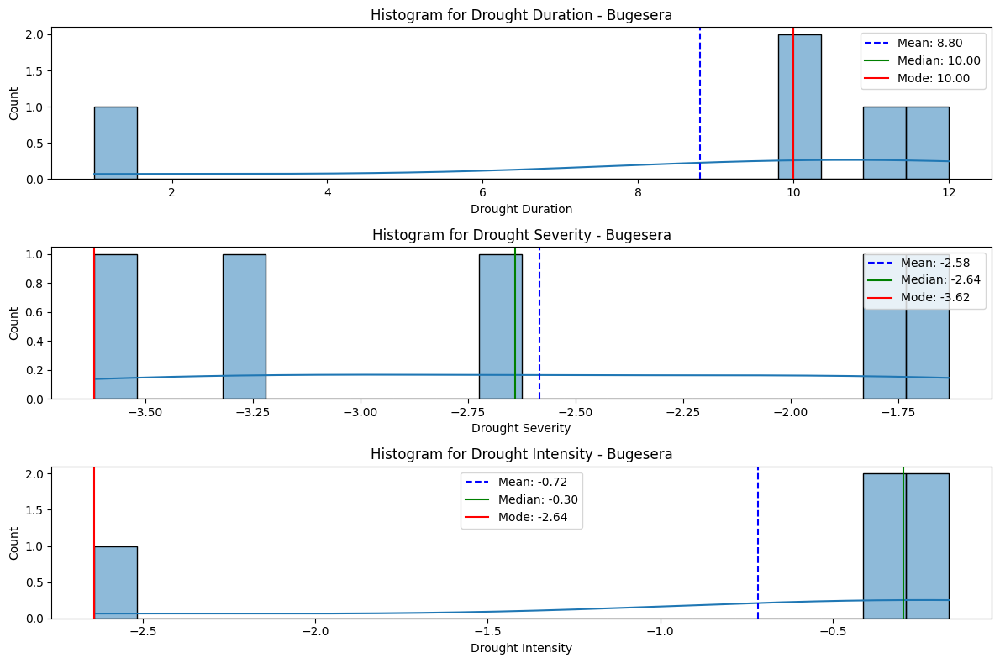

...

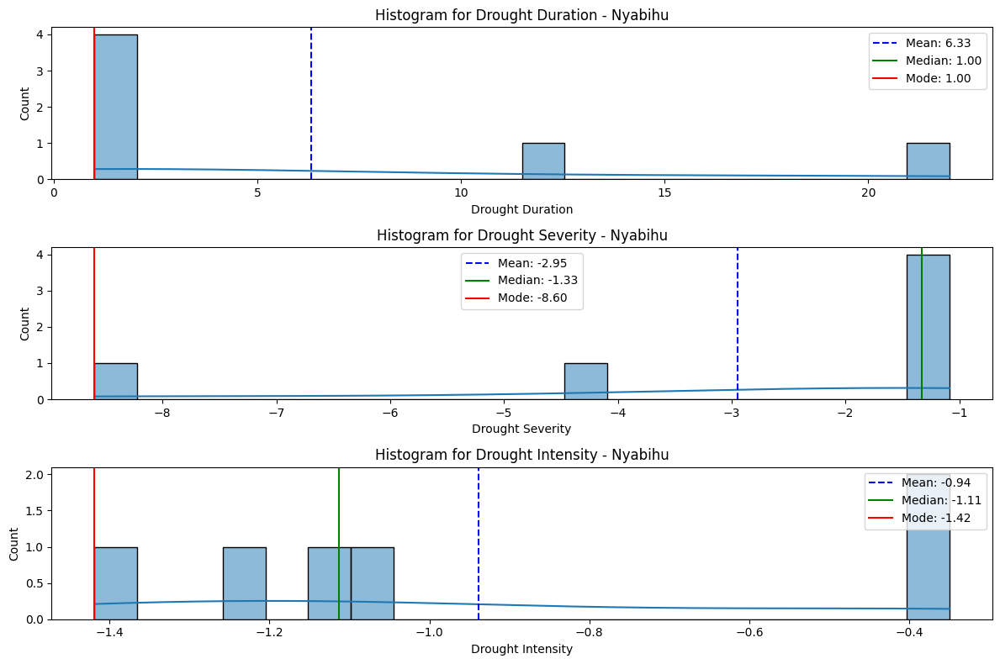

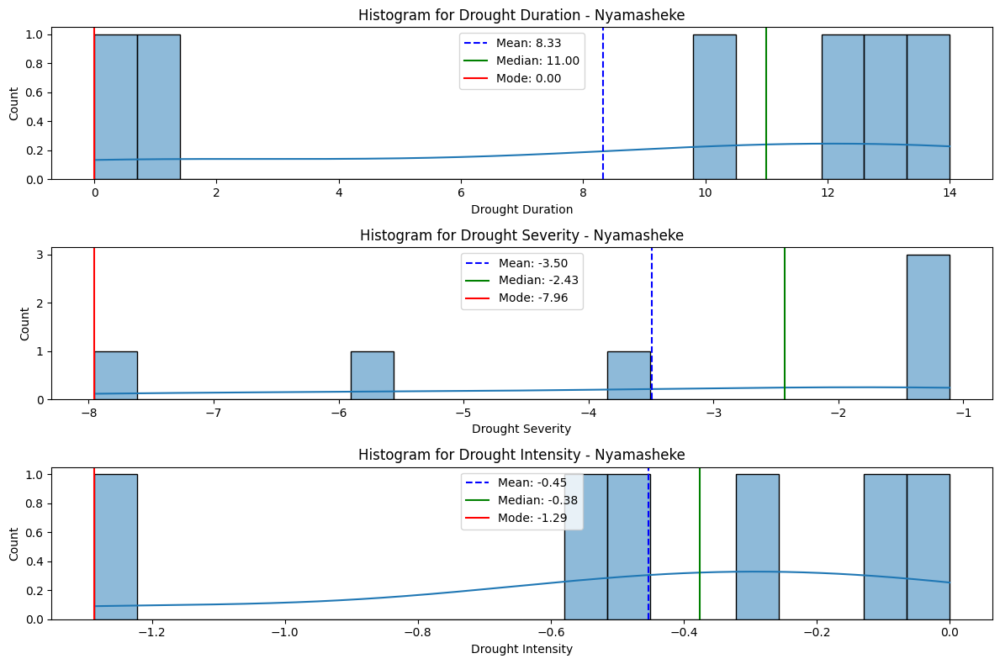

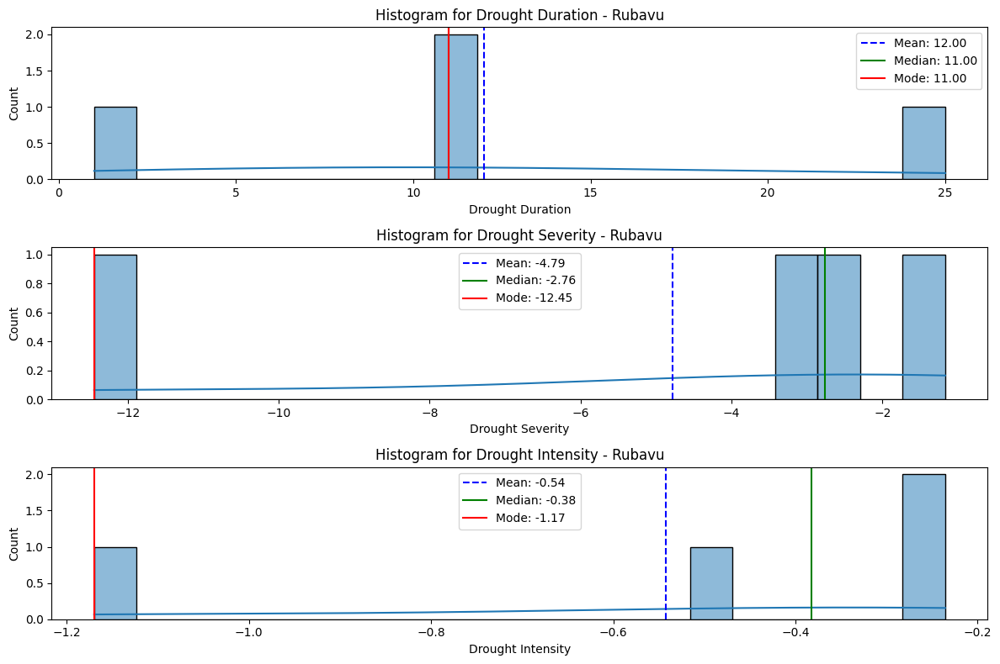

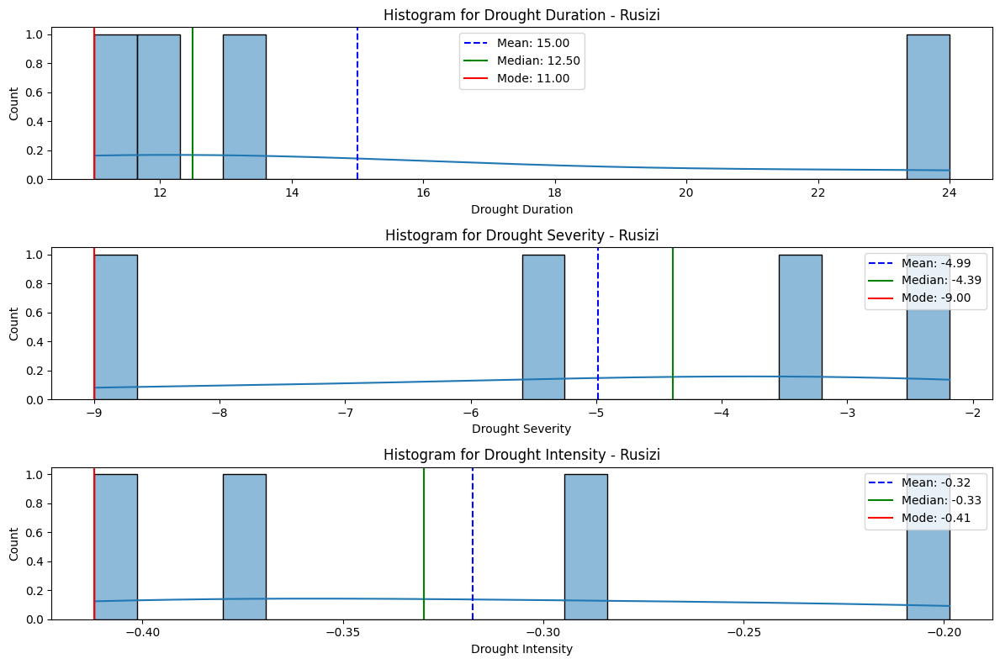

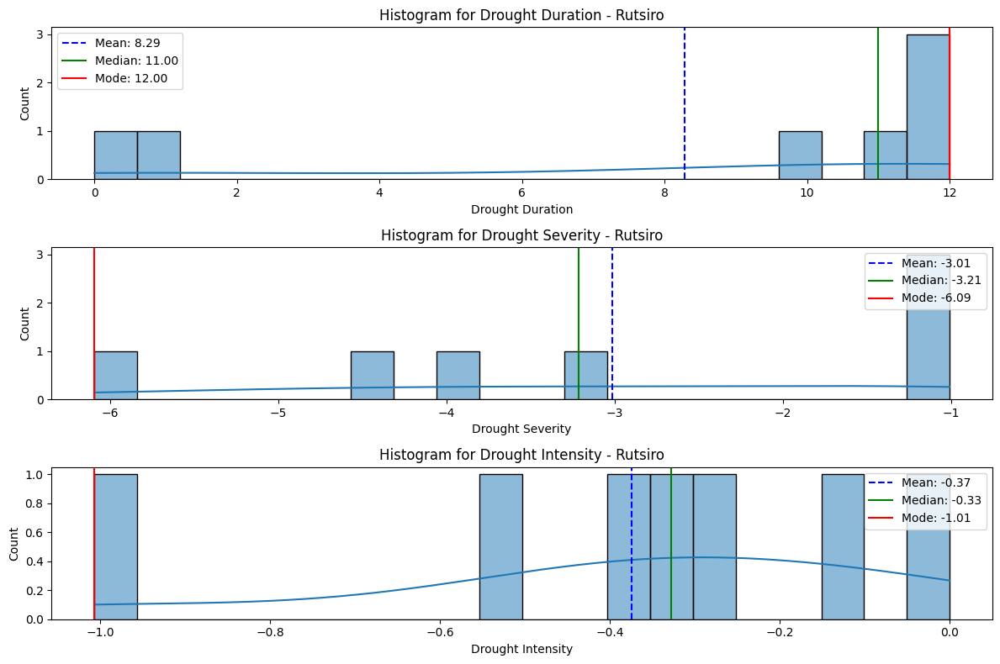

In [438]:
# Plots histograms for Drought Duration, Drought Severity, and Drought Intensity
plot_drought_metrics_histograms_with_stats(df)

In [439]:
# Drought Duration -  bimodal distribution
# Drought Severity - left-skewed (negatively skewed) distribution
# Drought Intensity -  somewhat bimodal but left skewed
df_combined = process_drought_data(df, duration_stat='median', severity_stat='median', intensity_stat='median')


# Display the result
print(df_combined.head())

  admin2_name  Drought Duration  Drought Severity  Drought Intensity  2002  \
0    Bugesera              10.0         -2.640853          -0.295521     1   
1      Burera              22.0         -6.974057          -0.379109     0   
2     Gakenke              11.0         -3.801699          -0.537332     1   
3      Gasabo              11.0         -2.540814          -0.247588     1   
4     Gatsibo              11.0         -2.807717          -0.273033     1   

   2003  2004  2005  2006  2007  ...  2014  2015  2016  2017  2018  2019  \
0     1     0     0     1     0  ...     0     0     0     0     1     1   
1     0     0     1     1     1  ...     0     0     0     0     0     0   
2     1     0     0     1     1  ...     0     0     0     0     0     0   
3     1     0     0     1     0  ...     0     0     0     0     1     1   
4     1     0     0     1     0  ...     0     0     0     0     1     1   

   2020  2021  2022  2023  
0     0     0     1     1  
1     0     0     

#### Data Preprocessing

In [440]:
# Normalize the combined dataset
scaler = MinMaxScaler()

# Keep 'admin2_name' aside
admin2_names = df_combined['admin2_name']

# Exclude 'admin2_name' from the features to be scaled
df_combined_for_clustering = df_combined.drop(columns=['admin2_name'])

# Convert column names to strings
df_combined_for_clustering.columns = df_combined_for_clustering.columns.astype(str)

# Apply MinMaxScaler to the remaining features (excluding 'admin2_name')
df = pd.DataFrame(scaler.fit_transform(df_combined_for_clustering),
                         columns=df_combined_for_clustering.columns)

#### Feature Vector Construction

To optimize the number of components (n_components) for Principal Component Analysis (PCA), we need to determine how many components are sufficient to retain the majority of the variance in the data. This can be done by plotting the explained variance ratio and observing when additional components contribute diminishing returns.

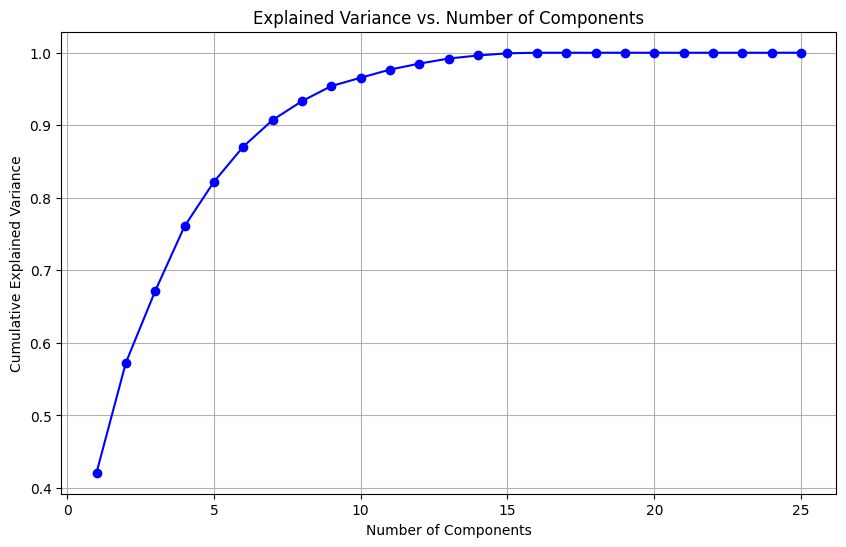

Cumulative explained variance: [0.42097285 0.57263766 0.67158055 0.76084919 0.82204106 0.87056482
 0.90725459 0.93330028 0.95402652 0.96554392 0.97676764 0.98502061
 0.99200069 0.99619069 0.99921731 1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.        ]


In [441]:
# Apply PCA with a large number of components to see variance explained by each component
# Plot the cumulative explained variance ratio
pca_model, cumulative_variance = plot_pca_variance_explained(df)

# Calculate the cumulative explained variance ratio
print("Cumulative explained variance:", cumulative_variance)

In [442]:
# Choose the optimal number of components based on the plot
optimal_n_components = 10  # This value should be adjusted based on the plot

# Apply PCA with the optimal number of components
pca_optimized = PCA(n_components=optimal_n_components)
reduced_features = pca_optimized.fit_transform(df)

# Print the shape of the reduced feature set
print(f"Reduced Feature Set Shape: {reduced_features.shape}")
print("Explained Variance by Optimal Components:")
print(np.sum(pca_optimized.explained_variance_ratio_))

Reduced Feature Set Shape: (30, 10)
Explained Variance by Optimal Components:
0.9655439195555138


#### K-Means Clustering

The Elbow Method is used to determine the optimal number of clusters (n_clusters) in K-Means clustering. It involves fitting the K-Means algorithm with different values for n_clusters and plotting the Within-Cluster Sum of Squares (WCSS) to observe the point where the WCSS starts to diminish at a reduced rate (forming an "elbow").

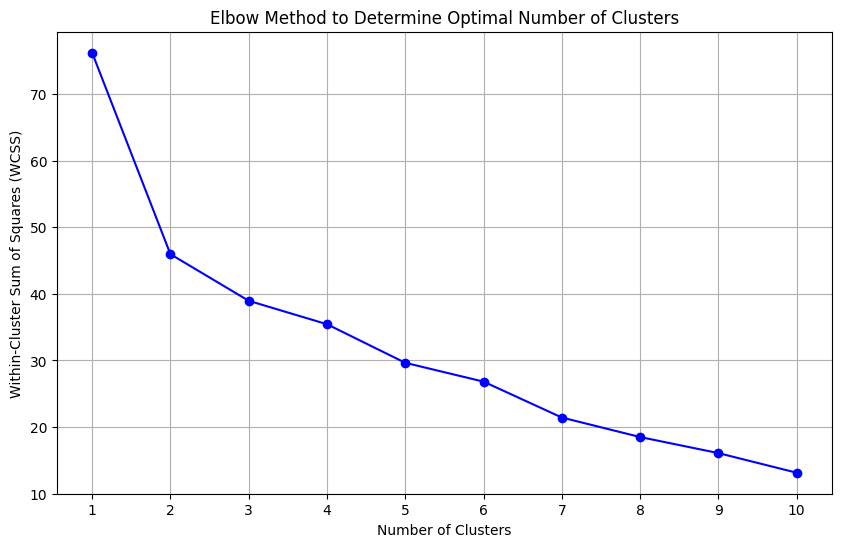

WCSS for each number of clusters: [76.233235013205, 45.97208286004324, 38.96868286661082, 35.4509553794985, 29.65302806857652, 26.824816385045267, 21.43422359256105, 18.502467459674687, 16.090063782485572, 13.141914712119085]


In [443]:
# Calculate WCSS for different values of n_clusters
wcss = plot_elbow_method(reduced_features, cluster_range=range(1, 11))
print("WCSS for each number of clusters:", wcss)

In [444]:
# Define the number of clusters (determined using the Elbow Method or chosen directly)
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(reduced_features)

# Add the cluster labels to the original DataFrame
df['cluster'] = kmeans.labels_

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with K-Means cluster assignments:")
print(df.head())

DataFrame with K-Means cluster assignments:
   Drought Duration  Drought Severity  Drought Intensity  2002  2003  2004  \
0          0.428571          0.763347           0.899809   1.0   1.0   0.0   
1          1.000000          0.000000           0.811680   0.0   0.0   0.0   
2          0.476190          0.558849           0.644861   1.0   1.0   0.0   
3          0.476190          0.780970           0.950346   1.0   1.0   0.0   
4          0.476190          0.733951           0.923519   1.0   1.0   0.0   

   2005  2006  2007  2008  ...  2015  2016  2017  2018  2019  2020  2021  \
0   0.0   0.0   0.0   1.0  ...   0.0   0.0   0.0   1.0   1.0   0.0   0.0   
1   1.0   0.0   1.0   1.0  ...   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   1.0   1.0  ...   0.0   0.0   0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   1.0  ...   0.0   0.0   0.0   1.0   1.0   0.0   0.0   
4   0.0   0.0   0.0   0.0  ...   0.0   0.0   0.0   1.0   1.0   0.0   0.0   

   2022  2023  cluster  
0   1

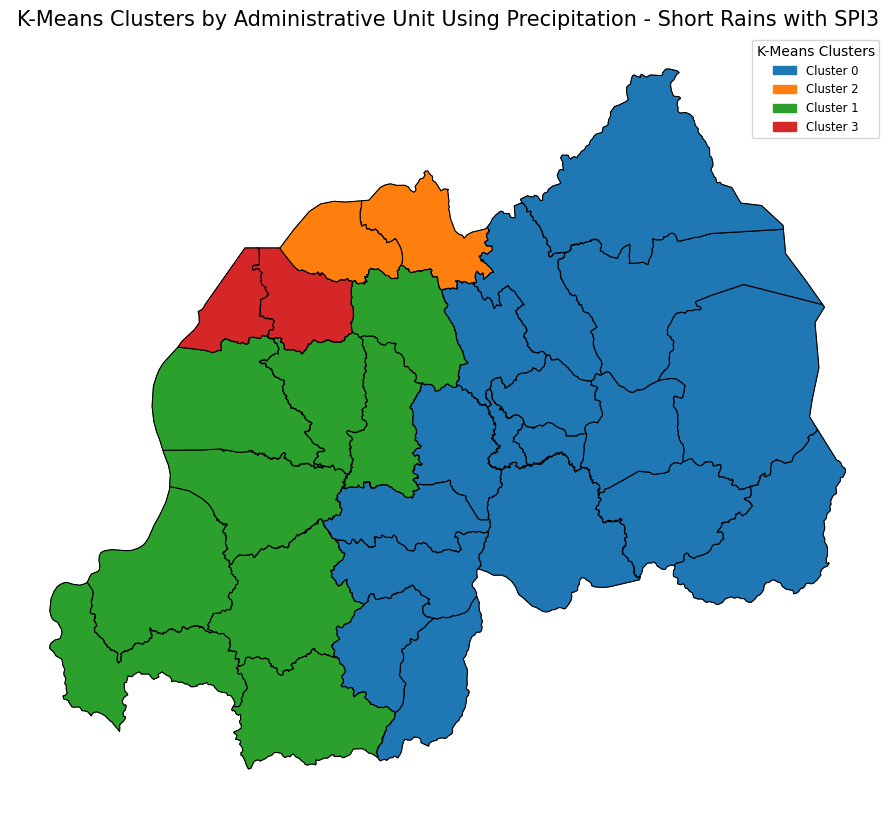

In [445]:
# Visualization of K-Means Clustering Results

# Reattach 'admin2_name' to the PCA-transformed DataFrame
df['admin2_name'] = admin2_names.values

# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all K-Means clusters with a legend
plot_all_geospatial_kmeans_clusters_with_legend("Short Rains with SPI3")

#### Hierarchical Clustering

Ward’s method minimizes variance and helps in identifying clusters of similar rainfall amounts. It provides a dendrogram, which can help determine different levels of clustering.

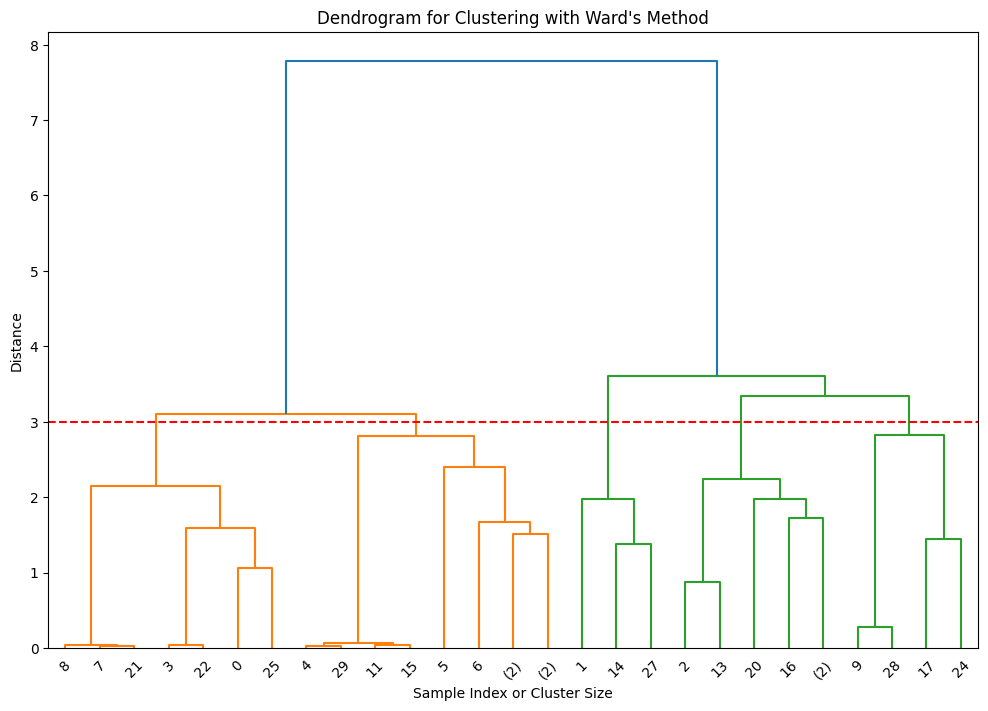

In [446]:
# Perform hierarchical clustering using Ward's method and plot the dendrogram to visualize cluster relationships
linkage_matrix = plot_hierarchical_dendrogram(reduced_features, cut_off=3, title='Dendrogram for Clustering with Ward\'s Method')

In [447]:
# Choose the Optimal Number of Clusters and Assign Labels

n_clusters = 4
hierarchical_labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')

# 4. Add the Hierarchical Cluster Labels to the Original DataFrame

df['hierarchical_cluster'] = hierarchical_labels

# Display the first few rows of the DataFrame with the cluster assignments
print("DataFrame with Hierarchical cluster assignments:")
print(df[['admin2_name', 'hierarchical_cluster']].head())

DataFrame with Hierarchical cluster assignments:
  admin2_name  hierarchical_cluster
0    Bugesera                     1
1      Burera                     2
2     Gakenke                     3
3      Gasabo                     1
4     Gatsibo                     1


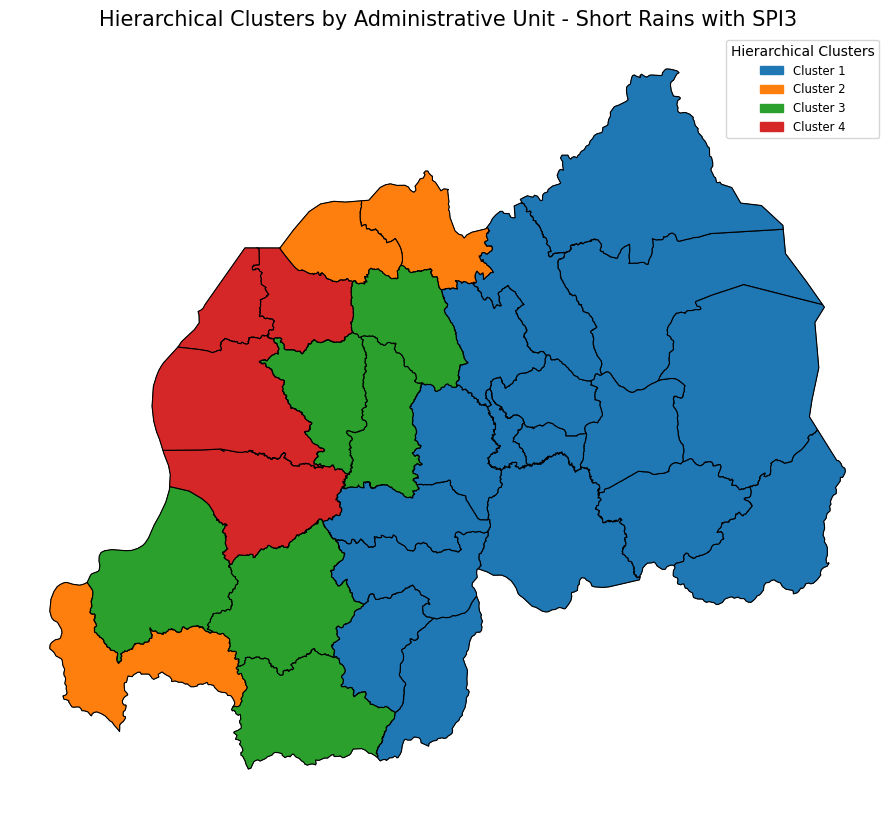

In [448]:
# Create the GeoDataFrame by merging the drought metrics DataFrame with the geospatial data
drought_gdf = admin_boundaries.merge(df, left_on='ADM2_NAME', right_on='admin2_name')

# Call the function to plot all hierarchical clusters with a legend
plot_all_hierarchical_clusters_with_legend("Short Rains with SPI3")

#### DBSCAN Clustering

In [449]:
# Assuming 'df' is your original DataFrame and 'reduced_features' contains the PCA-reduced data
df_with_clusters, best_eps, best_min_samples, best_score = optimize_dbscan(df, reduced_features)

# You can check the optimized results
print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples}, Best Silhouette Score: {best_score}")

No valid clusters were found with the given parameters.
Best eps: None, Best min_samples: None, Best Silhouette Score: None


In [450]:
#print(f'Number of clusters - {len(df["dbscan_cluster"].unique())}')